# <h1 align='center'> <font color='black'><font size=7> 🚚DELHIVERY - Business CaseStudy🚚 </font> </font></h1>
<h1 align='center'><font color='black'><font size=6>Feature Engineering</font> </font></h1>
<h2 align='right'>Analysed by : <font color='red'><b> KASI</b></font></h2>

<kbd>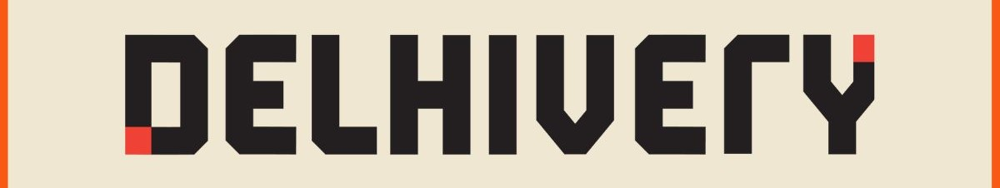
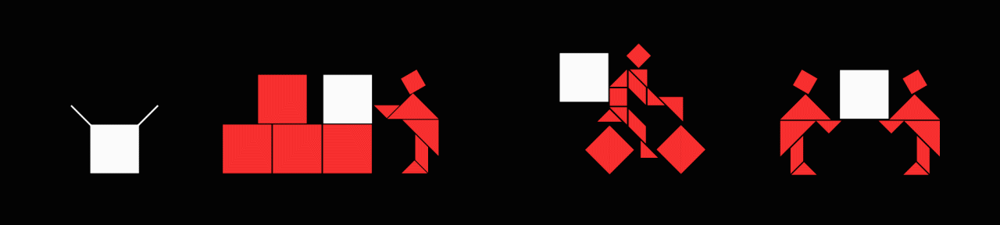</kbd>

## Introduction:
- 🚚**Delhivery**, established in 2011, is India's foremost logistics and supply chain service provider, offering a comprehensive range of solutions including express parcel transportation, warehousing, and last-mile delivery.

- Leveraging advanced technology and a vast delivery network, Delhivery efficiently manages nationwide movement of goods, earning trust across businesses of all sizes for its dedication to innovation and customer satisfaction.

- As the largest fully integrated player in India by revenue in Fiscal 2021, Delhivery aims to lead the industry by pioneering the commerce operating system, driven by top-tier infrastructure, logistics operations, and innovative data intelligence initiatives led by its Data team.

### 🔹Why this case study?

> Delhivery aims to establish itself as the premier player in the logistics industry. This case study is of paramount importance as it aligns with the company's core objectives and operational excellence.

> It provides a practical framework for understanding and processing data, which is integral to their operations. By leveraging data engineering pipelines and data analysis techniques, Delhivery can achieve several critical goals.

> First, it allows them to ensure data integrity and quality by addressing missing values and structuring the dataset appropriately.

> Second, it enables the extraction of valuable features from raw data, which can be utilized for building accurate forecasting models.

> Moreover, it facilitates the identification of patterns, insights, and actionable recommendations crucial for optimizing their logistics operations.

> Byconducting hypothesis testing and outlier detection, Delhivery can refine their processes and further enhance the quality of service they provide.

----
    
### How can you help here?

The company wants to understand and process the data coming out of data engineering pipelines:

- Clean, sanitize and manipulate data to get useful features out of raw fields

- Make sense out of the raw data and help the data science team to build forecasting models on it.


------
        
### 📃 Features of the dataset:

- Column Profiling:

| Feature | Description |
|:--------|:------------|
|data| tells whether the data is testing or training data|
|trip_creation_time| Timestamp of trip creation|
|route_schedule_uuid| Unique ID for a particular route schedule|
|**route_type**| **Transportation type**|
|a. FTL–Full Truck Load| FTL shipments get to the destination sooner, as the truck is making no other pickups or drop-offs along the way|
|b. Carting | Handling system consisting of small vehicles (carts)|
|trip_uuid| Unique ID given to a particular trip (A trip may include different source and destination centers)|
|source_center| Source ID of trip origin |
|source_name| Source Name of trip origin | 
|destination_center| Destination ID |
|destination_name| Destination Name | 
|od_start_time| Trip start time | 
|od_end_time| Trip end time |
|start_scan_to_end_scan | Time taken to deliver from source to destination |
|is_cutoff | Unknown field |
|cutoff_factor | Unknown field|
|cutoff_timestamp | Unknown field|
|actual_distance_to_destination | Distance in kms between source and destination warehouse|
|actual_time | Actual time taken to complete the delivery (Cumulative) |
|osrm_time | An open-source routing engine time calculator which computes the shortest path between points in a given map (Includes usual traffic, distance through major and minor roads) and gives the time (Cumulative) |
|osrm_distance | An open-source routing engine which computes the shortest path between points in a given map (Includes usual traffic, distance through major and minor roads) (Cumulative) |
|factor | Unknown field |
| segment_actual_time | This is a segment time. Time taken by the subset of the package delivery|
|segment_osrm_time | This is the OSRM segment time. Time taken by the subset of the package delivery|
| segment_osrm_distance | This is the OSRM distance. Distance covered by subset of the package delivery|
| segment_factor | Unknown field |

In [1]:
# importing the required modules and packages

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import re
from scipy.stats import norm,zscore,boxcox,probplot
from scipy.stats import ttest_ind,ttest_rel,mannwhitneyu,wilcoxon
from scipy.stats import shapiro,levene,kstest,anderson
import statsmodels.api as sm
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler , MinMaxScaler , OneHotEncoder
import warnings
warnings.filterwarnings('ignore')

In [2]:
# pd_reading the data
delhivery_data = pd.read_csv('delhivery_data.csv')

In [3]:
# setting the option of displaying all the columns
pd.set_option('display.max_columns', 50)

In [4]:
# making a deep copy for backup
dd = delhivery_data.copy()
dd.head()

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
0,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,9,2018-09-20 04:27:55,10.435660,14.0,11.0,11.9653,1.272727,14.0,11.0,11.9653,1.272727
1,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,18,2018-09-20 04:17:55,18.936842,24.0,20.0,21.7243,1.200000,10.0,9.0,9.7590,1.111111
2,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,27,2018-09-20 04:01:19.505586,27.637279,40.0,28.0,32.5395,1.428571,16.0,7.0,10.8152,2.285714
3,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,True,36,2018-09-20 03:39:57,36.118028,62.0,40.0,45.5620,1.550000,21.0,12.0,13.0224,1.750000
4,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,False,39,2018-09-20 03:33:55,39.386040,68.0,44.0,54.2181,1.545455,6.0,5.0,3.9153,1.200000


### 🧐**Exploration of data :**

In [5]:
dd.shape

(144867, 24)

In [6]:
dd.columns

Index(['data', 'trip_creation_time', 'route_schedule_uuid', 'route_type',
       'trip_uuid', 'source_center', 'source_name', 'destination_center',
       'destination_name', 'od_start_time', 'od_end_time',
       'start_scan_to_end_scan', 'is_cutoff', 'cutoff_factor',
       'cutoff_timestamp', 'actual_distance_to_destination', 'actual_time',
       'osrm_time', 'osrm_distance', 'factor', 'segment_actual_time',
       'segment_osrm_time', 'segment_osrm_distance', 'segment_factor'],
      dtype='object')

In [7]:
dd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144867 entries, 0 to 144866
Data columns (total 24 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   data                            144867 non-null  object 
 1   trip_creation_time              144867 non-null  object 
 2   route_schedule_uuid             144867 non-null  object 
 3   route_type                      144867 non-null  object 
 4   trip_uuid                       144867 non-null  object 
 5   source_center                   144867 non-null  object 
 6   source_name                     144574 non-null  object 
 7   destination_center              144867 non-null  object 
 8   destination_name                144606 non-null  object 
 9   od_start_time                   144867 non-null  object 
 10  od_end_time                     144867 non-null  object 
 11  start_scan_to_end_scan          144867 non-null  float64
 12  is_cutoff       

----
### 📝 Statistical Summary

In [8]:
dd.describe().T

,count,mean,std,min,25%,50%,75%,max
start_scan_to_end_scan,144867.0,961.262986,1037.012769,20.000000,161.000000,449.000000,1634.000000,7898.000000
cutoff_factor,144867.0,232.926567,344.755577,9.000000,22.000000,66.000000,286.000000,1927.000000
actual_distance_to_destination,144867.0,234.073372,344.990009,9.000045,23.355874,66.126571,286.708875,1927.447705
actual_time,144867.0,416.927527,598.103621,9.000000,51.000000,132.000000,513.000000,4532.000000
osrm_time,144867.0,213.868272,308.011085,6.000000,27.000000,64.000000,257.000000,1686.000000
osrm_distance,144867.0,284.771297,421.119294,9.008200,29.914700,78.525800,343.193250,2326.199100
factor,144867.0,2.120107,1.715421,0.144000,1.604264,1.857143,2.213483,77.387097
segment_actual_time,144867.0,36.196111,53.571158,-244.000000,20.000000,29.000000,40.000000,3051.000000
segment_osrm_time,144867.0,18.507548,14.775960,0.000000,11.000000,17.000000,22.000000,1611.000000
segment_osrm_distance,144867.0,22.829020,17.860660,0.000000,12.070100,23.513000,27.813250,2191.403700


In [9]:
dd.describe(include=object).T

,count,unique,top,freq
data,144867,2,training,104858
trip_creation_time,144867,14817,2018-09-28 05:23:15.359220,101
route_schedule_uuid,144867,1504,thanos::sroute:4029a8a2-6c74-4b7e-a6d8-f9e069f...,1812
route_type,144867,2,FTL,99660
trip_uuid,144867,14817,trip-153811219535896559,101
source_center,144867,1508,IND000000ACB,23347
source_name,144574,1498,Gurgaon_Bilaspur_HB (Haryana),23347
destination_center,144867,1481,IND000000ACB,15192
destination_name,144606,1468,Gurgaon_Bilaspur_HB (Haryana),15192
od_start_time,144867,26369,2018-09-21 18:37:09.322207,81


### 📜📜**Duplicate Detection**

In [10]:
dd[dd.duplicated()]

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor


### 🏷️ Insights

- The dataset does not contain any duplicates.
-----
### 🔸❓**Null Detection**

In [11]:
dd.isna().any()

data                              False
trip_creation_time                False
route_schedule_uuid               False
route_type                        False
trip_uuid                         False
source_center                     False
source_name                        True
destination_center                False
destination_name                   True
od_start_time                     False
od_end_time                       False
start_scan_to_end_scan            False
is_cutoff                         False
cutoff_factor                     False
cutoff_timestamp                  False
actual_distance_to_destination    False
actual_time                       False
osrm_time                         False
osrm_distance                     False
factor                            False
segment_actual_time               False
segment_osrm_time                 False
segment_osrm_distance             False
segment_factor                    False
dtype: bool

In [12]:
dd.isnull().sum()

data                                0
trip_creation_time                  0
route_schedule_uuid                 0
route_type                          0
trip_uuid                           0
source_center                       0
source_name                       293
destination_center                  0
destination_name                  261
od_start_time                       0
od_end_time                         0
start_scan_to_end_scan              0
is_cutoff                           0
cutoff_factor                       0
cutoff_timestamp                    0
actual_distance_to_destination      0
actual_time                         0
osrm_time                           0
osrm_distance                       0
factor                              0
segment_actual_time                 0
segment_osrm_time                   0
segment_osrm_distance               0
segment_factor                      0
dtype: int64

In [13]:
def missing_data(df):
    total_missing_df = df.isnull().sum().sort_values(ascending =False)
    percent_missing_df = (df.isnull().sum()/df.isna().count()*100).sort_values(ascending=False) # ----> /len(dd)
    missing_data_df = pd.concat([total_missing_df, percent_missing_df], axis=1, keys=['Total', 'Percent'])
    return missing_data_df

missing_pct = missing_data(dd)
missing_pct[missing_pct['Total']>0]

,Total,Percent
source_name,293,0.202254
destination_name,261,0.180165


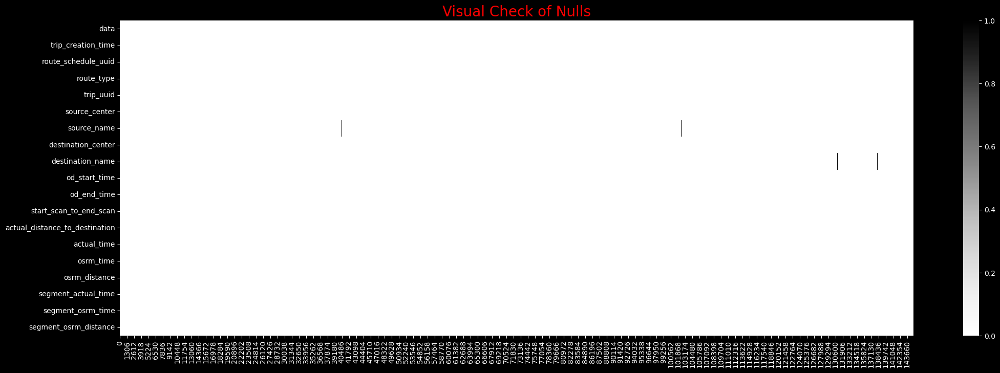

In [16]:
plt.figure(figsize=(25,8))
plt.style.use('dark_background')
sns.heatmap(dd.isnull().T,cmap='Greys')
plt.title('Visual Check of Nulls',fontsize=20,color='r')
plt.show()

In [15]:
# Dropping unknown fields

unknown_fields = ['is_cutoff', 'cutoff_factor', 'cutoff_timestamp', 'factor', 'segment_factor']
dd = dd.drop(columns = unknown_fields)

In [17]:
dd.sample()

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance
133488,test,2018-09-30 05:56:48.299467,thanos::sroute:6be6529b-f2ad-4714-b7ab-ac58f24...,FTL,trip-153828700829921150,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND600056AAB,MAA_Poonamallee_HB (Tamil Nadu),2018-09-30 05:56:48.299467,2018-10-02 10:36:25.970169,3159.0,1518.025696,2492.0,1400.0,1931.1737,54.0,21.0,21.5097


In [18]:
dd.shape

(144867, 19)

In [19]:
#checking the unique values for columns
for _ in dd.columns:
    print()
    print(f'Total Unique Values in {_} column are :- {dd[_].nunique()}')
    print(f'Unique Values in {_} column are :-\n {dd[_].unique()}')
    print()
    print('-'*120)


Total Unique Values in data column are :- 2
Unique Values in data column are :-
 ['training' 'test']

------------------------------------------------------------------------------------------------------------------------

Total Unique Values in trip_creation_time column are :- 14817
Unique Values in trip_creation_time column are :-
 ['2018-09-20 02:35:36.476840' '2018-09-23 06:42:06.021680'
 '2018-09-14 15:42:46.437249' ... '2018-09-22 11:30:41.399439'
 '2018-09-17 11:35:28.838714' '2018-09-20 16:24:28.436231']

------------------------------------------------------------------------------------------------------------------------

Total Unique Values in route_schedule_uuid column are :- 1504
Unique Values in route_schedule_uuid column are :-
 ['thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3297ef'
 'thanos::sroute:ff52ef7a-4d0d-4063-9bfe-cc211728881b'
 'thanos::sroute:a16bfa03-3462-4bce-9c82-5784c7d315e6' ...
 'thanos::sroute:72cf9feb-f4e3-4a55-b92a-0b686ee8fabc'
 'thanos::sroute:5e

----
### **🔄️ Changing the Datatype of Columns**

In [20]:
dd.sample()

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance
124444,training,2018-09-23 02:44:13.665024,thanos::sroute:f01c8bbd-655d-42ea-9abf-60d5040...,FTL,trip-153767065366477819,IND821115AAB,Sasaram_Central_I_2 (Bihar),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),2018-09-23 17:32:37.941229,2018-09-24 04:42:20.756776,669.0,22.302481,27.0,17.0,25.4394,27.0,17.0,25.4394


In [21]:
dd.dtypes

data                               object
trip_creation_time                 object
route_schedule_uuid                object
route_type                         object
trip_uuid                          object
source_center                      object
source_name                        object
destination_center                 object
destination_name                   object
od_start_time                      object
od_end_time                        object
start_scan_to_end_scan            float64
actual_distance_to_destination    float64
actual_time                       float64
osrm_time                         float64
osrm_distance                     float64
segment_actual_time               float64
segment_osrm_time                 float64
segment_osrm_distance             float64
dtype: object

In [22]:
# Converting the datatypes to category for columns like data and route_type as they only have 2 values.
dd['data'] = dd['data'].astype('category')
dd['route_type'] = dd['route_type'].astype('category')

# Converting time columns to datetime format
datetime_cols = ['trip_creation_time', 'od_start_time', 'od_end_time']
for _ in datetime_cols:
    dd[_] = pd.to_datetime(dd[_])

In [23]:
dd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144867 entries, 0 to 144866
Data columns (total 19 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   data                            144867 non-null  category      
 1   trip_creation_time              144867 non-null  datetime64[ns]
 2   route_schedule_uuid             144867 non-null  object        
 3   route_type                      144867 non-null  category      
 4   trip_uuid                       144867 non-null  object        
 5   source_center                   144867 non-null  object        
 6   source_name                     144574 non-null  object        
 7   destination_center              144867 non-null  object        
 8   destination_name                144606 non-null  object        
 9   od_start_time                   144867 non-null  datetime64[ns]
 10  od_end_time                     144867 non-null  datetim

```python
float_cols = []
for _ in dd.columns:
    if isinstance(dd[_],'float64'):
        float_cols.append(_)
float_cols
```
###### see y it didnt work

In [24]:
float_cols = []
for _ in dd.columns:
    if dd[_].dtype=='float64':
        float_cols.append(_)
float_cols

['start_scan_to_end_scan',
 'actual_distance_to_destination',
 'actual_time',
 'osrm_time',
 'osrm_distance',
 'segment_actual_time',
 'segment_osrm_time',
 'segment_osrm_distance']

In [25]:
# reducing the float64 to float32 to save memory
for _ in float_cols:
    dd[_] = dd[_].astype('float32')

In [26]:
dd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144867 entries, 0 to 144866
Data columns (total 19 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   data                            144867 non-null  category      
 1   trip_creation_time              144867 non-null  datetime64[ns]
 2   route_schedule_uuid             144867 non-null  object        
 3   route_type                      144867 non-null  category      
 4   trip_uuid                       144867 non-null  object        
 5   source_center                   144867 non-null  object        
 6   source_name                     144574 non-null  object        
 7   destination_center              144867 non-null  object        
 8   destination_name                144606 non-null  object        
 9   od_start_time                   144867 non-null  datetime64[ns]
 10  od_end_time                     144867 non-null  datetim

#### 🏷️Insights:

- Earlier the dataset was using 25.6+ MB of memory but now it has been reduced to 14.6 + MB. Around 40.63 % reduction in the memory usage.

In [27]:
# Time period of data
dd['trip_creation_time'].max(), dd['trip_creation_time'].min() , dd['trip_creation_time'].max()-dd['trip_creation_time'].min() 

(Timestamp('2018-10-03 23:59:42.701692'),
 Timestamp('2018-09-12 00:00:16.535741'),
 Timedelta('21 days 23:59:26.165951'))

In [28]:
# Time period of data
dd['od_start_time'].max(), dd['od_start_time'].min(), dd['od_start_time'].max() - dd['od_start_time'].min()

(Timestamp('2018-10-06 04:27:23.392375'),
 Timestamp('2018-09-12 00:00:16.535741'),
 Timedelta('24 days 04:27:06.856634'))

In [29]:
# Time period of data
dd['od_end_time'].max(), dd['od_end_time'].min(), dd['od_end_time'].max() - dd['od_end_time'].min()

(Timestamp('2018-10-08 03:00:24.353479'),
 Timestamp('2018-09-12 00:50:10.814399'),
 Timedelta('26 days 02:10:13.539080'))

In [30]:
data_time_frame =  dd['od_end_time'].max() - dd['trip_creation_time'].min()
data_time_frame

Timedelta('26 days 03:00:07.817738')

## 🔴Null Treatment: 

### Replace null values in 'source_name' and 'destination_name' columns with 'unknown' through scikit imputation
columns_to_impute = ['source_name', 'destination_name']  
imputer = SimpleImputer(strategy='constant', fill_value='unknown')  
dd[columns_to_impute] = imputer.fit_transform(dd[columns_to_impute])  

#### but 'unknown' transactions will be more and to be omitted while analyzing ... Hence `no use of imputing`....

In [31]:
dd[(dd.source_name.isna())&(dd.destination_name.isna())]

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance
68006,training,2018-09-26 22:21:56.619259,thanos::sroute:cfb575b8-df26-48f5-8427-6f48f9d...,FTL,trip-153800051661903546,IND331022A1B,NaN,IND331001A1C,NaN,2018-09-27 03:19:14.797080,2018-09-27 05:28:00.922915,128.0,25.178606,26.0,23.0,25.724600,26.0,23.0,25.724600
68007,training,2018-09-26 22:21:56.619259,thanos::sroute:cfb575b8-df26-48f5-8427-6f48f9d...,FTL,trip-153800051661903546,IND331022A1B,NaN,IND331001A1C,NaN,2018-09-27 03:19:14.797080,2018-09-27 05:28:00.922915,128.0,45.101166,114.0,44.0,54.611000,88.0,21.0,28.886299
68008,training,2018-09-26 22:21:56.619259,thanos::sroute:cfb575b8-df26-48f5-8427-6f48f9d...,FTL,trip-153800051661903546,IND331022A1B,NaN,IND331001A1C,NaN,2018-09-27 03:19:14.797080,2018-09-27 05:28:00.922915,128.0,50.844666,128.0,49.0,60.920502,13.0,4.0,6.309600


In [32]:
dd[dd.source_name.isna()]

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance
112,training,2018-09-25 08:53:04.377810,thanos::sroute:4460a38d-ab9b-484e-bd4e-f4201d0...,FTL,trip-153786558437756691,IND342902A1B,NaN,IND302014AAA,Jaipur_Hub (Rajasthan),2018-09-26 06:58:08.054001,2018-09-26 15:54:14.280942,536.0,22.783440,48.0,34.0,37.774899,48.0,34.0,37.774899
113,training,2018-09-25 08:53:04.377810,thanos::sroute:4460a38d-ab9b-484e-bd4e-f4201d0...,FTL,trip-153786558437756691,IND342902A1B,NaN,IND302014AAA,Jaipur_Hub (Rajasthan),2018-09-26 06:58:08.054001,2018-09-26 15:54:14.280942,536.0,46.071251,98.0,41.0,56.357498,49.0,33.0,34.166100
114,training,2018-09-25 08:53:04.377810,thanos::sroute:4460a38d-ab9b-484e-bd4e-f4201d0...,FTL,trip-153786558437756691,IND342902A1B,NaN,IND302014AAA,Jaipur_Hub (Rajasthan),2018-09-26 06:58:08.054001,2018-09-26 15:54:14.280942,536.0,67.714996,127.0,58.0,80.481102,29.0,17.0,24.123600
115,training,2018-09-25 08:53:04.377810,thanos::sroute:4460a38d-ab9b-484e-bd4e-f4201d0...,FTL,trip-153786558437756691,IND342902A1B,NaN,IND302014AAA,Jaipur_Hub (Rajasthan),2018-09-26 06:58:08.054001,2018-09-26 15:54:14.280942,536.0,88.149643,156.0,73.0,101.255600,28.0,14.0,20.774599
116,training,2018-09-25 08:53:04.377810,thanos::sroute:4460a38d-ab9b-484e-bd4e-f4201d0...,FTL,trip-153786558437756691,IND342902A1B,NaN,IND302014AAA,Jaipur_Hub (Rajasthan),2018-09-26 06:58:08.054001,2018-09-26 15:54:14.280942,536.0,112.691978,212.0,92.0,127.986000,55.0,18.0,26.730400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144484,test,2018-10-03 09:06:06.690094,thanos::sroute:cbef3b6a-79ea-4d5e-a215-b558a70...,FTL,trip-153855756668984584,IND282002AAD,NaN,IND474003AAA,Gwalior_HrihrNgr_I (Madhya Pradesh),2018-10-03 17:34:21.835475,2018-10-03 22:10:43.366324,276.0,45.134384,62.0,45.0,47.773399,34.0,23.0,23.660101
144485,test,2018-10-03 09:06:06.690094,thanos::sroute:cbef3b6a-79ea-4d5e-a215-b558a70...,FTL,trip-153855756668984584,IND282002AAD,NaN,IND474003AAA,Gwalior_HrihrNgr_I (Madhya Pradesh),2018-10-03 17:34:21.835475,2018-10-03 22:10:43.366324,276.0,66.542267,86.0,71.0,71.954903,23.0,25.0,24.181499
144486,test,2018-10-03 09:06:06.690094,thanos::sroute:cbef3b6a-79ea-4d5e-a215-b558a70...,FTL,trip-153855756668984584,IND282002AAD,NaN,IND474003AAA,Gwalior_HrihrNgr_I (Madhya Pradesh),2018-10-03 17:34:21.835475,2018-10-03 22:10:43.366324,276.0,88.143959,116.0,114.0,112.694298,30.0,43.0,40.739399
144487,test,2018-10-03 09:06:06.690094,thanos::sroute:cbef3b6a-79ea-4d5e-a215-b558a70...,FTL,trip-153855756668984584,IND282002AAD,NaN,IND474003AAA,Gwalior_HrihrNgr_I (Madhya Pradesh),2018-10-03 17:34:21.835475,2018-10-03 22:10:43.366324,276.0,111.084419,173.0,123.0,134.194000,57.0,45.0,46.921700


In [33]:
dd[dd.destination_name.isna()]

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance
110,training,2018-09-25 08:53:04.377810,thanos::sroute:4460a38d-ab9b-484e-bd4e-f4201d0...,FTL,trip-153786558437756691,IND342601AAA,Piparcity_BsstdDPP_D (Rajasthan),IND342902A1B,NaN,2018-09-26 05:04:49.254901,2018-09-26 06:58:08.054001,113.0,24.538214,58.0,33.0,30.884501,58.0,33.0,30.884501
111,training,2018-09-25 08:53:04.377810,thanos::sroute:4460a38d-ab9b-484e-bd4e-f4201d0...,FTL,trip-153786558437756691,IND342601AAA,Piparcity_BsstdDPP_D (Rajasthan),IND342902A1B,NaN,2018-09-26 05:04:49.254901,2018-09-26 06:58:08.054001,113.0,34.657707,110.0,43.0,41.536098,52.0,10.0,10.651700
982,test,2018-10-01 20:56:18.155260,thanos::sroute:d0ebdacd-e09b-47d3-be77-c9c4a05...,FTL,trip-153842737815495661,IND573103AAA,Arsikere_HsnRdDPP_D (Karnataka),IND577116AAA,NaN,2018-10-02 01:22:21.450243,2018-10-02 02:07:27.840862,45.0,22.029638,21.0,16.0,22.962999,21.0,16.0,22.962999
983,test,2018-10-01 20:56:18.155260,thanos::sroute:d0ebdacd-e09b-47d3-be77-c9c4a05...,FTL,trip-153842737815495661,IND573103AAA,Arsikere_HsnRdDPP_D (Karnataka),IND577116AAA,NaN,2018-10-02 01:22:21.450243,2018-10-02 02:07:27.840862,45.0,35.528961,36.0,25.0,36.505001,15.0,9.0,13.542000
4882,training,2018-09-24 07:18:06.087341,thanos::sroute:2f43f11e-d3ba-4590-9355-82928e1...,FTL,trip-153777348608709328,IND202001AAB,Aligarh_KhirByps_I (Uttar Pradesh),IND282002AAD,NaN,2018-09-24 15:02:13.760270,2018-09-24 18:49:23.454535,227.0,22.193687,40.0,26.0,28.981701,40.0,26.0,28.981701
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144478,test,2018-10-03 09:06:06.690094,thanos::sroute:cbef3b6a-79ea-4d5e-a215-b558a70...,FTL,trip-153855756668984584,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND282002AAD,NaN,2018-10-03 09:06:06.690094,2018-10-03 17:34:21.835475,508.0,89.773705,108.0,70.0,99.409599,21.0,16.0,23.359501
144479,test,2018-10-03 09:06:06.690094,thanos::sroute:cbef3b6a-79ea-4d5e-a215-b558a70...,FTL,trip-153855756668984584,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND282002AAD,NaN,2018-10-03 09:06:06.690094,2018-10-03 17:34:21.835475,508.0,110.854080,138.0,94.0,124.659798,30.0,24.0,25.250200
144480,test,2018-10-03 09:06:06.690094,thanos::sroute:cbef3b6a-79ea-4d5e-a215-b558a70...,FTL,trip-153855756668984584,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND282002AAD,NaN,2018-10-03 09:06:06.690094,2018-10-03 17:34:21.835475,508.0,132.514236,304.0,119.0,147.229507,166.0,24.0,22.569700
144481,test,2018-10-03 09:06:06.690094,thanos::sroute:cbef3b6a-79ea-4d5e-a215-b558a70...,FTL,trip-153855756668984584,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND282002AAD,NaN,2018-10-03 09:06:06.690094,2018-10-03 17:34:21.835475,508.0,154.024567,337.0,130.0,177.239395,33.0,27.0,24.978399


In [34]:
ddd = dd.copy()

In [35]:
missing_source_name = ddd.loc[ddd['source_name'].isnull(), 'source_center'].unique()
missing_source_name

array(['IND342902A1B', 'IND577116AAA', 'IND282002AAD', 'IND465333A1B',
       'IND841301AAC', 'IND509103AAC', 'IND126116AAA', 'IND331022A1B',
       'IND505326AAB', 'IND852118A1B'], dtype=object)

In [36]:
missing_destination_name = ddd.loc[ddd['destination_name'].isnull(), 'destination_center'].unique()
missing_destination_name

array(['IND342902A1B', 'IND577116AAA', 'IND282002AAD', 'IND465333A1B',
       'IND841301AAC', 'IND505326AAB', 'IND852118A1B', 'IND126116AAA',
       'IND509103AAC', 'IND221005A1A', 'IND250002AAC', 'IND331001A1C',
       'IND122015AAC'], dtype=object)

In [37]:
# checking if element of one np.array isin another np.array

#np.all(df.loc[df['source_name'].isnull(), 'source_center'].isin(missing_destination_name))

np.in1d(missing_source_name, missing_destination_name).all()

False

In [38]:
for _ in missing_source_name:
    unique_source_name = ddd.loc[ddd['source_center'] == _, 'source_name'].unique()
    if pd.isna(unique_source_name):
        print("Source Center :", _, "-" * 5, "Source Name :", 'NA')
    else :
        print("Source Center :", _, "-" * 5, "Source Name :", unique_source_name)

Source Center : IND342902A1B ----- Source Name : NA
Source Center : IND577116AAA ----- Source Name : NA
Source Center : IND282002AAD ----- Source Name : NA
Source Center : IND465333A1B ----- Source Name : NA
Source Center : IND841301AAC ----- Source Name : NA
Source Center : IND509103AAC ----- Source Name : NA
Source Center : IND126116AAA ----- Source Name : NA
Source Center : IND331022A1B ----- Source Name : NA
Source Center : IND505326AAB ----- Source Name : NA
Source Center : IND852118A1B ----- Source Name : NA


In [39]:
for _ in missing_destination_name:
    unique_destination_name = ddd.loc[ddd['destination_center'] == _, 'destination_name'].unique()
    if pd.isna(unique_destination_name):
        print("Destination Center :", _, "-" * 5, "Destination Name :", 'NA')
    else :
        print("Destination Center :", _, "-" * 5, "Destination Name :", unique_destination_name)

Destination Center : IND342902A1B ----- Destination Name : NA
Destination Center : IND577116AAA ----- Destination Name : NA
Destination Center : IND282002AAD ----- Destination Name : NA
Destination Center : IND465333A1B ----- Destination Name : NA
Destination Center : IND841301AAC ----- Destination Name : NA
Destination Center : IND505326AAB ----- Destination Name : NA
Destination Center : IND852118A1B ----- Destination Name : NA
Destination Center : IND126116AAA ----- Destination Name : NA
Destination Center : IND509103AAC ----- Destination Name : NA
Destination Center : IND221005A1A ----- Destination Name : NA
Destination Center : IND250002AAC ----- Destination Name : NA
Destination Center : IND331001A1C ----- Destination Name : NA
Destination Center : IND122015AAC ----- Destination Name : NA


In [40]:
count = 1
for i in missing_destination_name:
    ddd.loc[ddd['destination_center'] == i, 'destination_name'] = ddd.loc[ddd['destination_center'] == i, 
                                     'destination_name'].replace(np.nan, f'location_{count}')
    count += 1

In [41]:
d = {}
for i in missing_source_name:
    d[i] = ddd.loc[ddd['destination_center'] == i, 'destination_name'].unique()
for idx, val in d.items():
    if len(val) == 0:
        d[idx] = [f'location_{count}']
        count += 1
d2 = {}
for idx, val in d.items():
    d2[idx] = val[0]
for i, v in d2.items():
    print(i, v)

IND342902A1B location_1
IND577116AAA location_2
IND282002AAD location_3
IND465333A1B location_4
IND841301AAC location_5
IND509103AAC location_9
IND126116AAA location_8
IND331022A1B location_14
IND505326AAB location_6
IND852118A1B location_7


In [45]:
for i in missing_source_name:
    ddd.loc[ddd['source_center'] == i, 'source_name'] = ddd.loc[ddd['source_center'] == i, 'source_name'].replace(np.nan, d2[i])

In [46]:
ddd.source_name.value_counts()

source_name
Gurgaon_Bilaspur_HB (Haryana)            23347
Bangalore_Nelmngla_H (Karnataka)          9975
Bhiwandi_Mankoli_HB (Maharashtra)         9088
Pune_Tathawde_H (Maharashtra)             4061
Hyderabad_Shamshbd_H (Telangana)          3340
                                         ...  
Badkulla_Central_DPP_1 (West Bengal)         1
Kasganj_BnkrGate_D (Uttar Pradesh)           1
Shahjhnpur_NavdaCln_D (Uttar Pradesh)        1
Jaunpur_Katghara_D (Uttar Pradesh)           1
Krishnanagar_AnadiDPP_D (West Bengal)        1
Name: count, Length: 1508, dtype: int64

In [47]:
ddd.destination_name.value_counts()

destination_name
Gurgaon_Bilaspur_HB (Haryana)        15192
Bangalore_Nelmngla_H (Karnataka)     11019
Bhiwandi_Mankoli_HB (Maharashtra)     5492
Hyderabad_Shamshbd_H (Telangana)      5142
Kolkata_Dankuni_HB (West Bengal)      4892
                                     ...  
Vijayawada (Andhra Pradesh)              1
Ranaghat_ArickDPP_D (West Bengal)        1
Mumbai_Sanpada_CP (Maharashtra)          1
Delhi_Lajwanti (Delhi)                   1
Luxettipet_ShivaDPP_D (Telangana)        1
Name: count, Length: 1481, dtype: int64

even if we replace these nulls with some values, those are not gonna have any impact on the data.... so we can drop it as well..

In [49]:
261+290

551

In [50]:
len(delhivery_data)

144867

In [51]:
144867 - 551

144316

In [52]:
df = dd.dropna()

In [53]:
df.isna().sum().any()

False

In [54]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 144316 entries, 0 to 144866
Data columns (total 19 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   data                            144316 non-null  category      
 1   trip_creation_time              144316 non-null  datetime64[ns]
 2   route_schedule_uuid             144316 non-null  object        
 3   route_type                      144316 non-null  category      
 4   trip_uuid                       144316 non-null  object        
 5   source_center                   144316 non-null  object        
 6   source_name                     144316 non-null  object        
 7   destination_center              144316 non-null  object        
 8   destination_name                144316 non-null  object        
 9   od_start_time                   144316 non-null  datetime64[ns]
 10  od_end_time                     144316 non-null  datetime64[n

#### 🏷️Insights:

- Only two fields have a tiny fraction of missing values, less than 0.05% of the whole dataset.
- Since we have plenty of data to work with, we're choosing to just get rid of the missing values instead of trying to guess them using methods like using the average or most common value.
- I'm dropping the missing values to keep things simple and not mess up how the features are spread out. But if a lot more data was missing, we could have used other methods like guessing based on what's there or using the most common values.

-----

## 🕵️‍♂️**Exploratory Data Analysis**


In [55]:
cp = ['gray','red','dimgrey','tomato','dimgray','orangered','k','salmon','gray','red','dimgrey','tomato','dimgray','orangered','k','salmon']

In [255]:
df.sample()

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_key,segment_actual_time_sum,segment_osrm_distance_sum,segment_osrm_time_sum
92389,training,2018-09-14 23:36:50.771430,thanos::sroute:3f001d56-e933-4ba1-a7cf-26828f7...,Carting,trip-153696821077115152,IND515201AAA,Hindupur_Parigi_D (Andhra Pradesh),IND515301AAA,Madakasira_RTCStand_D (Andhra Pradesh),2018-09-15 01:35:41.452946,2018-09-15 02:46:18.759915,70.0,25.308775,51.0,21.0,30.9918,20.0,5.0,8.1409,trip-153696821077115152+IND515201AAA+IND515301AAA,50.0,30.991899,20.0


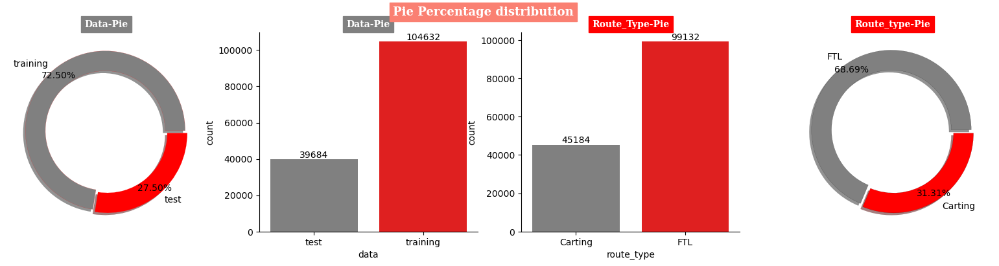

In [270]:
plt.figure(figsize=(20,4))
plt.suptitle('Pie Percentage distribution',fontsize=13,fontfamily='serif',fontweight='bold',backgroundcolor=cp[-1],color='w')

plt.subplot(141)
plt.pie(df['data'].value_counts(), labels=df['data'].value_counts().index, colors=cp,counterclock=True , explode=(0.02,0.02) , autopct='%.2f%%', pctdistance=0.905,
       textprops={'color':'k','fontsize':10} , shadow=True, radius=1,wedgeprops=dict(edgecolor='r',linewidth=0.1,width=0.25))
plt.title('Data-Pie',fontsize=10,fontfamily='serif',fontweight='bold',backgroundcolor=cp[0],color='w')

plt.subplot(142)
a = sns.barplot(x=df['data'].value_counts().index, y=df['data'].value_counts(), palette=cp)
a.bar_label(a.containers[0], label_type='edge',fmt='%d')
plt.title('Data-Pie',fontsize=10,fontfamily='serif',fontweight='bold',backgroundcolor=cp[0],color='w')

plt.subplot(143)
b = sns.barplot(x=df['route_type'].value_counts().index, y=df['route_type'].value_counts(), palette=cp)
b.bar_label(b.containers[0], label_type='edge',fmt='%d')
plt.title('Route_Type-Pie',fontsize=10,fontfamily='serif',fontweight='bold',backgroundcolor=cp[1],color='w')

plt.subplot(144)
plt.pie(df['route_type'].value_counts(), labels=df['route_type'].value_counts().index, colors=cp,counterclock=True , explode=(0.03,0.02) , autopct='%.2f%%', pctdistance=0.905,
       textprops={'color':'k','fontsize':10} , shadow=True, radius=1,wedgeprops=dict(edgecolor='k',linewidth=0.1,width=0.25))
plt.title('Route_type-Pie',fontsize=10,fontfamily='serif',fontweight='bold',backgroundcolor=cp[1],color='w')

sns.despine()
plt.show()

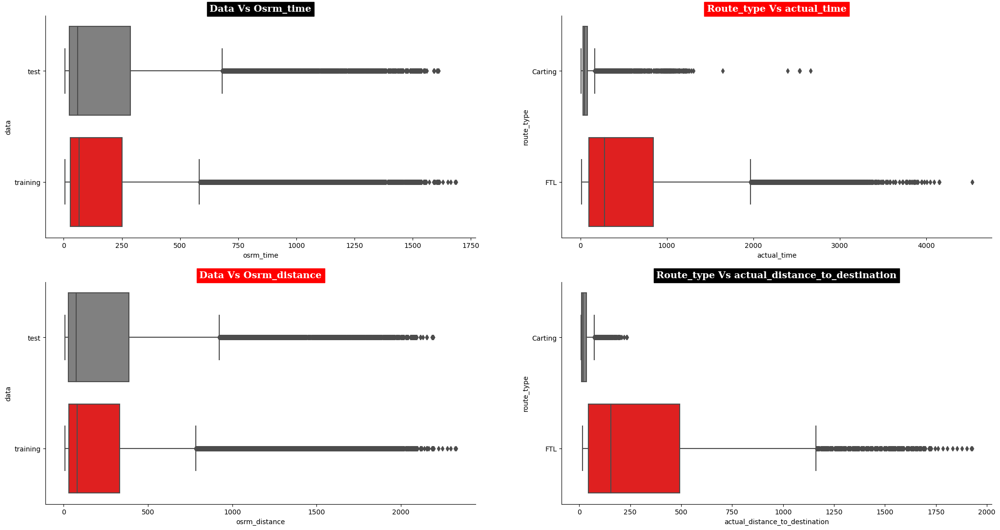

In [57]:
plt.figure(figsize=(25,13))
plt.style.use('default')
plt.style.use('seaborn-bright')

plt.subplot(221)
sns.boxplot(data=df,y='data',x='osrm_time',palette=cp)
plt.title('Data Vs Osrm_time',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor='k',color='w')

plt.subplot(222)
sns.boxplot(data=df,y='route_type',x='actual_time',palette=cp)
plt.title('Route_type Vs actual_time',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor='r',color='w')

plt.subplot(223)
sns.boxplot(data=df,y='data',x='osrm_distance',palette=cp)
plt.title('Data Vs Osrm_distance',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor='r',color='w')

plt.subplot(224)
sns.boxplot(data=df,y='route_type',x='actual_distance_to_destination',palette=cp)
plt.title('Route_type Vs actual_distance_to_destination',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor='k',color='w')
sns.despine()
plt.show()

### 🏷️Observations:

- Both training and test data have the same range of osrm time recorded
- FTL route type has more actual time compared to Carting. This can also be since FTL is used a lot more than carting in the data available to us
- Both training and test data have the same range of osrm distance recorded
- FTL route type has more actual distance compared to Carting. This can also be since FTL is used a lot more than carting in the data available to us

------

##  2.Merging of rows and aggregation of fields

Merging of rows and aggregation of fields

* Since delivery details of one package are divided into several rows (think of it as connecting flights to reach a particular destination). Now think about how we should treat their fields if we combine these rows? What aggregation would make sense if we merge. What would happen to the numeric fields if we merge the rows.

In [58]:
# Grouping by segment
# Creating a unique identifier for each segment of a trip

segment_cols = ['segment_actual_time', 'segment_osrm_distance', 'segment_osrm_time']

df['segment_key'] = df['trip_uuid'] + '+' + df['source_center'] + '+' + df['destination_center']

for col in segment_cols:
    df[col + '_sum'] = df.groupby('segment_key')[col].cumsum()

df[['segment_key', 'segment_actual_time', 'segment_actual_time_sum','segment_osrm_distance', 'segment_osrm_distance_sum','segment_osrm_time', 'segment_osrm_time_sum']]

,segment_key,segment_actual_time,segment_actual_time_sum,segment_osrm_distance,segment_osrm_distance_sum,segment_osrm_time,segment_osrm_time_sum
0,trip-153741093647649320+IND388121AAA+IND388620AAB,14.0,14.0,11.965300,11.965300,11.0,11.0
1,trip-153741093647649320+IND388121AAA+IND388620AAB,10.0,24.0,9.759000,21.724300,9.0,20.0
2,trip-153741093647649320+IND388121AAA+IND388620AAB,16.0,40.0,10.815200,32.539497,7.0,27.0
3,trip-153741093647649320+IND388121AAA+IND388620AAB,21.0,61.0,13.022400,45.561897,12.0,39.0
4,trip-153741093647649320+IND388121AAA+IND388620AAB,6.0,67.0,3.915300,49.477200,5.0,44.0
...,...,...,...,...,...,...,...
144862,trip-153746066843555182+IND131028AAB+IND000000ACB,12.0,92.0,8.185800,65.348701,12.0,94.0
144863,trip-153746066843555182+IND131028AAB+IND000000ACB,26.0,118.0,17.372499,82.721199,21.0,115.0
144864,trip-153746066843555182+IND131028AAB+IND000000ACB,20.0,138.0,20.705299,103.426498,34.0,149.0
144865,trip-153746066843555182+IND131028AAB+IND000000ACB,17.0,155.0,18.888500,122.315002,27.0,176.0


In [59]:
# Aggregating at segment level & Creating a dictionary for aggregation at segment level

segment_dict = {
  'trip_uuid' : 'first',
  'data': 'first',
  'route_type': 'first',
  'trip_creation_time': 'first',
  'source_name': 'first',
  'destination_name': 'last',
  'od_start_time': 'first',
  'od_end_time': 'last',
  'start_scan_to_end_scan': 'first',
  'actual_distance_to_destination': 'last',
  'actual_time': 'last',
  'osrm_time': 'last',
  'osrm_distance': 'last',
  'segment_actual_time' : 'sum',
  'segment_osrm_time' : 'sum',
  'segment_osrm_distance' : 'sum',
  'segment_actual_time_sum': 'last',
  'segment_osrm_time_sum': 'last',
  'segment_osrm_distance_sum': 'last',
}

# Grouping by segment_key and aggregating
segment_agg_data = df.groupby('segment_key').agg(segment_dict).reset_index()
segment_agg_data = segment_agg_data.sort_values(by=['segment_key','od_end_time'])
segment_agg_data

,segment_key,trip_uuid,data,route_type,trip_creation_time,source_name,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum
0,trip-153671041653548748+IND209304AAA+IND000000ACB,trip-153671041653548748,training,FTL,2018-09-12 00:00:16.535741,Kanpur_Central_H_6 (Uttar Pradesh),Gurgaon_Bilaspur_HB (Haryana),2018-09-12 16:39:46.858469,2018-09-13 13:40:23.123744,1260.0,383.759155,732.0,329.0,446.549591,728.0,534.0,670.620483,728.0,534.0,670.620483
1,trip-153671041653548748+IND462022AAA+IND209304AAA,trip-153671041653548748,training,FTL,2018-09-12 00:00:16.535741,Bhopal_Trnsport_H (Madhya Pradesh),Kanpur_Central_H_6 (Uttar Pradesh),2018-09-12 00:00:16.535741,2018-09-12 16:39:46.858469,999.0,440.973694,830.0,388.0,544.802673,820.0,474.0,649.852783,820.0,474.0,649.852783
2,trip-153671042288605164+IND561203AAB+IND562101AAA,trip-153671042288605164,training,Carting,2018-09-12 00:00:22.886430,Doddablpur_ChikaDPP_D (Karnataka),Chikblapur_ShntiSgr_D (Karnataka),2018-09-12 02:03:09.655591,2018-09-12 03:01:59.598855,58.0,24.644020,47.0,26.0,28.199400,46.0,26.0,28.199501,46.0,26.0,28.199501
3,trip-153671042288605164+IND572101AAA+IND561203AAB,trip-153671042288605164,training,Carting,2018-09-12 00:00:22.886430,Tumkur_Veersagr_I (Karnataka),Doddablpur_ChikaDPP_D (Karnataka),2018-09-12 00:00:22.886430,2018-09-12 02:03:09.655591,122.0,48.542889,96.0,42.0,56.911598,95.0,39.0,55.989899,95.0,39.0,55.989899
4,trip-153671043369099517+IND000000ACB+IND160002AAC,trip-153671043369099517,training,FTL,2018-09-12 00:00:33.691250,Gurgaon_Bilaspur_HB (Haryana),Chandigarh_Mehmdpur_H (Punjab),2018-09-14 03:40:17.106733,2018-09-14 17:34:55.442454,834.0,237.439606,611.0,212.0,281.210907,608.0,231.0,317.740784,608.0,231.0,317.740784
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26217,trip-153861115439069069+IND628204AAA+IND627657AAA,trip-153861115439069069,test,Carting,2018-10-03 23:59:14.390954,Tirchchndr_Shnmgprm_D (Tamil Nadu),Thisayanvilai_UdnkdiRD_D (Tamil Nadu),2018-10-04 02:29:04.272194,2018-10-04 03:31:11.183797,62.0,33.627182,51.0,41.0,42.521301,49.0,42.0,42.143101,49.0,42.0,42.143101
26218,trip-153861115439069069+IND628613AAA+IND627005AAA,trip-153861115439069069,test,Carting,2018-10-03 23:59:14.390954,Peikulam_SriVnktpm_D (Tamil Nadu),Tirunelveli_VdkkuSrt_I (Tamil Nadu),2018-10-04 04:16:39.894872,2018-10-04 05:47:45.162682,91.0,33.673836,90.0,48.0,40.608002,89.0,77.0,78.586899,89.0,77.0,78.586899
26219,trip-153861115439069069+IND628801AAA+IND628204AAA,trip-153861115439069069,test,Carting,2018-10-03 23:59:14.390954,Eral_Busstand_D (Tamil Nadu),Tirchchndr_Shnmgprm_D (Tamil Nadu),2018-10-04 01:44:53.808000,2018-10-04 02:29:04.272194,44.0,12.661944,30.0,14.0,16.018499,29.0,14.0,16.018400,29.0,14.0,16.018400
26220,trip-153861118270144424+IND583119AAA+IND583101AAA,trip-153861118270144424,test,FTL,2018-10-03 23:59:42.701692,Sandur_WrdN1DPP_D (Karnataka),Bellary_Dc (Karnataka),2018-10-04 03:58:40.726547,2018-10-04 08:46:09.166940,287.0,40.546738,233.0,42.0,52.530300,233.0,42.0,52.530300,233.0,42.0,52.530300


### 🔹Understanding:

> The rows have been merged based on the unique segment_key, which is a combination of trip_uuid, source_center, and destination_center. 

> The aggregated dataset reflects the total values for each segment of the trip.

----

## 📂Feature Engineering

In [60]:
# 1. Calculating time difference between od_start_time and od_end_time
segment_agg_data['od_total_time']=(segment_agg_data['od_end_time'] - segment_agg_data['od_start_time'])
segment_agg_data['od_time_diff_hour'] = (segment_agg_data['od_total_time']).dt.total_seconds()/3600
segment_agg_data

,segment_key,trip_uuid,data,route_type,trip_creation_time,source_name,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,od_total_time,od_time_diff_hour
0,trip-153671041653548748+IND209304AAA+IND000000ACB,trip-153671041653548748,training,FTL,2018-09-12 00:00:16.535741,Kanpur_Central_H_6 (Uttar Pradesh),Gurgaon_Bilaspur_HB (Haryana),2018-09-12 16:39:46.858469,2018-09-13 13:40:23.123744,1260.0,383.759155,732.0,329.0,446.549591,728.0,534.0,670.620483,728.0,534.0,670.620483,0 days 21:00:36.265275,21.010074
1,trip-153671041653548748+IND462022AAA+IND209304AAA,trip-153671041653548748,training,FTL,2018-09-12 00:00:16.535741,Bhopal_Trnsport_H (Madhya Pradesh),Kanpur_Central_H_6 (Uttar Pradesh),2018-09-12 00:00:16.535741,2018-09-12 16:39:46.858469,999.0,440.973694,830.0,388.0,544.802673,820.0,474.0,649.852783,820.0,474.0,649.852783,0 days 16:39:30.322728,16.658423
2,trip-153671042288605164+IND561203AAB+IND562101AAA,trip-153671042288605164,training,Carting,2018-09-12 00:00:22.886430,Doddablpur_ChikaDPP_D (Karnataka),Chikblapur_ShntiSgr_D (Karnataka),2018-09-12 02:03:09.655591,2018-09-12 03:01:59.598855,58.0,24.644020,47.0,26.0,28.199400,46.0,26.0,28.199501,46.0,26.0,28.199501,0 days 00:58:49.943264,0.980540
3,trip-153671042288605164+IND572101AAA+IND561203AAB,trip-153671042288605164,training,Carting,2018-09-12 00:00:22.886430,Tumkur_Veersagr_I (Karnataka),Doddablpur_ChikaDPP_D (Karnataka),2018-09-12 00:00:22.886430,2018-09-12 02:03:09.655591,122.0,48.542889,96.0,42.0,56.911598,95.0,39.0,55.989899,95.0,39.0,55.989899,0 days 02:02:46.769161,2.046325
4,trip-153671043369099517+IND000000ACB+IND160002AAC,trip-153671043369099517,training,FTL,2018-09-12 00:00:33.691250,Gurgaon_Bilaspur_HB (Haryana),Chandigarh_Mehmdpur_H (Punjab),2018-09-14 03:40:17.106733,2018-09-14 17:34:55.442454,834.0,237.439606,611.0,212.0,281.210907,608.0,231.0,317.740784,608.0,231.0,317.740784,0 days 13:54:38.335721,13.910649
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26217,trip-153861115439069069+IND628204AAA+IND627657AAA,trip-153861115439069069,test,Carting,2018-10-03 23:59:14.390954,Tirchchndr_Shnmgprm_D (Tamil Nadu),Thisayanvilai_UdnkdiRD_D (Tamil Nadu),2018-10-04 02:29:04.272194,2018-10-04 03:31:11.183797,62.0,33.627182,51.0,41.0,42.521301,49.0,42.0,42.143101,49.0,42.0,42.143101,0 days 01:02:06.911603,1.035253
26218,trip-153861115439069069+IND628613AAA+IND627005AAA,trip-153861115439069069,test,Carting,2018-10-03 23:59:14.390954,Peikulam_SriVnktpm_D (Tamil Nadu),Tirunelveli_VdkkuSrt_I (Tamil Nadu),2018-10-04 04:16:39.894872,2018-10-04 05:47:45.162682,91.0,33.673836,90.0,48.0,40.608002,89.0,77.0,78.586899,89.0,77.0,78.586899,0 days 01:31:05.267810,1.518130
26219,trip-153861115439069069+IND628801AAA+IND628204AAA,trip-153861115439069069,test,Carting,2018-10-03 23:59:14.390954,Eral_Busstand_D (Tamil Nadu),Tirchchndr_Shnmgprm_D (Tamil Nadu),2018-10-04 01:44:53.808000,2018-10-04 02:29:04.272194,44.0,12.661944,30.0,14.0,16.018499,29.0,14.0,16.018400,29.0,14.0,16.018400,0 days 00:44:10.464194,0.736240
26220,trip-153861118270144424+IND583119AAA+IND583101AAA,trip-153861118270144424,test,FTL,2018-10-03 23:59:42.701692,Sandur_WrdN1DPP_D (Karnataka),Bellary_Dc (Karnataka),2018-10-04 03:58:40.726547,2018-10-04 08:46:09.166940,287.0,40.546738,233.0,42.0,52.530300,233.0,42.0,52.530300,233.0,42.0,52.530300,0 days 04:47:28.440393,4.791233


In [61]:
segment_agg_data.sample()

,segment_key,trip_uuid,data,route_type,trip_creation_time,source_name,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,od_total_time,od_time_diff_hour
4965,trip-153704666810685062+IND173025AAA+IND160002AAC,trip-153704666810685062,training,FTL,2018-09-15 21:24:28.108007,PaontSahib_Gurudwar_D (Himachal Pradesh),Chandigarh_Mehmdpur_H (Punjab),2018-09-16 09:10:26.756767,2018-09-16 14:11:04.351703,300.0,85.146751,198.0,100.0,106.438904,197.0,99.0,121.251198,197.0,99.0,121.251198,0 days 05:00:37.594936,5.010443


In [63]:
# de = segment_agg_data.drop(columns=['source_city','source_state','source_place','destination_place','destination_city','destination_state'])
de = segment_agg_data.copy()

In [64]:
de.sample()

,segment_key,trip_uuid,data,route_type,trip_creation_time,source_name,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,od_total_time,od_time_diff_hour
4962,trip-153704666399260818+IND421302AAG+IND401104AAA,trip-153704666399260818,training,Carting,2018-09-15 21:24:23.992906,Bhiwandi_Mankoli_HB (Maharashtra),Mumbai_MiraRd_IP (Maharashtra),2018-09-15 21:24:23.992906,2018-09-16 01:16:04.776133,231.0,16.74782,102.0,26.0,29.297199,102.0,25.0,29.297199,102.0,25.0,29.297199,0 days 03:51:40.783227,3.861329


In [ ]:
# # could have done this --- but some major error ... check it....
# sad = segment_agg_data.copy()
# sad["source_city"] = sad["source_name"].str.split(" ",n=1,expand=True)[0].str.split("_",n=1,expand=True)[0]
# sad["source_state"] = sad["source_name"].str.split(" ",n=1,expand=True)[1].str.replace("(","").str.replace(")","")

# sad["destination_city"] = sad["destination_name"].str.split(" ",n=1,expand=True)[0].str.split("_",n=1,expand=True)[0]
# sad["destination_state"] = sad["destination_name"].str.split(" ",n=1,expand=True)[1].str.replace("(","").str.replace(")","")

# sad["source_place"] = sad["source_name"].str.split("_",n=2,expand=True)[1]
# sad["destination_place"] = sad["destination_name"].str.split("_",n=2,expand=True)[1]

In [65]:
# using regex pattern to seperate the city,place,state 
def extract_info(name):
    pattern = r'^(?P<city>[^\s_]+)_?(?P<place>[^\(\)]*)\s?\((?P<state>[A-Za-z\s&]+)\)$'
    match = re.match(pattern, name)
    if match:
        city = match.group('city').strip()
        place = match.group('place').strip() if match.group('place') else city
        state = match.group('state').strip()
        return city, place, state
    else:
        return None, None, None

In [66]:
de[['source_city', 'source_place', 'source_state']] = de['source_name'].apply(lambda x: pd.Series(extract_info(x)))

In [67]:
de[['destination_city', 'destination_place', 'destination_state']] = de['destination_name'].apply(lambda x: pd.Series(extract_info(x)))

In [68]:
de

,segment_key,trip_uuid,data,route_type,trip_creation_time,source_name,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,od_total_time,od_time_diff_hour,source_city,source_place,source_state,destination_city,destination_place,destination_state
0,trip-153671041653548748+IND209304AAA+IND000000ACB,trip-153671041653548748,training,FTL,2018-09-12 00:00:16.535741,Kanpur_Central_H_6 (Uttar Pradesh),Gurgaon_Bilaspur_HB (Haryana),2018-09-12 16:39:46.858469,2018-09-13 13:40:23.123744,1260.0,383.759155,732.0,329.0,446.549591,728.0,534.0,670.620483,728.0,534.0,670.620483,0 days 21:00:36.265275,21.010074,Kanpur,Central_H_6,Uttar Pradesh,Gurgaon,Bilaspur_HB,Haryana
1,trip-153671041653548748+IND462022AAA+IND209304AAA,trip-153671041653548748,training,FTL,2018-09-12 00:00:16.535741,Bhopal_Trnsport_H (Madhya Pradesh),Kanpur_Central_H_6 (Uttar Pradesh),2018-09-12 00:00:16.535741,2018-09-12 16:39:46.858469,999.0,440.973694,830.0,388.0,544.802673,820.0,474.0,649.852783,820.0,474.0,649.852783,0 days 16:39:30.322728,16.658423,Bhopal,Trnsport_H,Madhya Pradesh,Kanpur,Central_H_6,Uttar Pradesh
2,trip-153671042288605164+IND561203AAB+IND562101AAA,trip-153671042288605164,training,Carting,2018-09-12 00:00:22.886430,Doddablpur_ChikaDPP_D (Karnataka),Chikblapur_ShntiSgr_D (Karnataka),2018-09-12 02:03:09.655591,2018-09-12 03:01:59.598855,58.0,24.644020,47.0,26.0,28.199400,46.0,26.0,28.199501,46.0,26.0,28.199501,0 days 00:58:49.943264,0.980540,Doddablpur,ChikaDPP_D,Karnataka,Chikblapur,ShntiSgr_D,Karnataka
3,trip-153671042288605164+IND572101AAA+IND561203AAB,trip-153671042288605164,training,Carting,2018-09-12 00:00:22.886430,Tumkur_Veersagr_I (Karnataka),Doddablpur_ChikaDPP_D (Karnataka),2018-09-12 00:00:22.886430,2018-09-12 02:03:09.655591,122.0,48.542889,96.0,42.0,56.911598,95.0,39.0,55.989899,95.0,39.0,55.989899,0 days 02:02:46.769161,2.046325,Tumkur,Veersagr_I,Karnataka,Doddablpur,ChikaDPP_D,Karnataka
4,trip-153671043369099517+IND000000ACB+IND160002AAC,trip-153671043369099517,training,FTL,2018-09-12 00:00:33.691250,Gurgaon_Bilaspur_HB (Haryana),Chandigarh_Mehmdpur_H (Punjab),2018-09-14 03:40:17.106733,2018-09-14 17:34:55.442454,834.0,237.439606,611.0,212.0,281.210907,608.0,231.0,317.740784,608.0,231.0,317.740784,0 days 13:54:38.335721,13.910649,Gurgaon,Bilaspur_HB,Haryana,Chandigarh,Mehmdpur_H,Punjab
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26217,trip-153861115439069069+IND628204AAA+IND627657AAA,trip-153861115439069069,test,Carting,2018-10-03 23:59:14.390954,Tirchchndr_Shnmgprm_D (Tamil Nadu),Thisayanvilai_UdnkdiRD_D (Tamil Nadu),2018-10-04 02:29:04.272194,2018-10-04 03:31:11.183797,62.0,33.627182,51.0,41.0,42.521301,49.0,42.0,42.143101,49.0,42.0,42.143101,0 days 01:02:06.911603,1.035253,Tirchchndr,Shnmgprm_D,Tamil Nadu,Thisayanvilai,UdnkdiRD_D,Tamil Nadu
26218,trip-153861115439069069+IND628613AAA+IND627005AAA,trip-153861115439069069,test,Carting,2018-10-03 23:59:14.390954,Peikulam_SriVnktpm_D (Tamil Nadu),Tirunelveli_VdkkuSrt_I (Tamil Nadu),2018-10-04 04:16:39.894872,2018-10-04 05:47:45.162682,91.0,33.673836,90.0,48.0,40.608002,89.0,77.0,78.586899,89.0,77.0,78.586899,0 days 01:31:05.267810,1.518130,Peikulam,SriVnktpm_D,Tamil Nadu,Tirunelveli,VdkkuSrt_I,Tamil Nadu
26219,trip-153861115439069069+IND628801AAA+IND628204AAA,trip-153861115439069069,test,Carting,2018-10-03 23:59:14.390954,Eral_Busstand_D (Tamil Nadu),Tirchchndr_Shnmgprm_D (Tamil Nadu),2018-10-04 01:44:53.808000,2018-10-04 02:29:04.272194,44.0,12.661944,30.0,14.0,16.018499,29.0,14.0,16.018400,29.0,14.0,16.018400,0 days 00:44:10.464194,0.736240,Eral,Busstand_D,Tamil Nadu,Tirchchndr,Shnmgprm_D,Tamil Nadu
26220,trip-153861118270144424+IND583119AAA+IND583101AAA,trip-153861118270144424,test,FTL,2018-10-03 23:59:42.70169

In [69]:
de[(de['source_place']=='') | (de['destination_place']=='')]

,segment_key,trip_uuid,data,route_type,trip_creation_time,source_name,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,od_total_time,od_time_diff_hour,source_city,source_place,source_state,destination_city,destination_place,destination_state
7,trip-153671052974046625+IND583101AAA+IND583201AAA,trip-153671052974046625,training,FTL,2018-09-12 00:02:09.740725,Bellary_Dc (Karnataka),Hospet (Karnataka),2018-09-12 00:02:09.740725,2018-09-12 02:34:10.515593,152.0,59.530350,147.0,46.0,63.646099,147.0,45.0,63.646099,147.0,45.0,63.646099,0 days 02:32:00.774868,2.533549,Bellary,Dc,Karnataka,Hospet,,Karnataka
9,trip-153671052974046625+IND583201AAA+IND583119AAA,trip-153671052974046625,training,FTL,2018-09-12 00:02:09.740725,Hospet (Karnataka),Sandur_WrdN1DPP_D (Karnataka),2018-09-12 02:34:10.515593,2018-09-12 03:54:43.114421,80.0,26.600536,63.0,27.0,29.569599,63.0,26.0,29.569698,63.0,26.0,29.569698,0 days 01:20:32.598828,1.342389,Hospet,,Karnataka,Sandur,WrdN1DPP_D,Karnataka
19,trip-153671110078355292+IND121004AAB+IND121001AAA,trip-153671110078355292,training,Carting,2018-09-12 00:11:40.783923,FBD_Balabhgarh_DPC (Haryana),Faridabad (Haryana),2018-09-12 00:11:40.783923,2018-09-12 00:50:10.814399,38.0,9.396525,17.0,9.0,10.815900,17.0,9.0,10.815900,17.0,9.0,10.815900,0 days 00:38:30.030476,0.641675,FBD,Balabhgarh_DPC,Haryana,Faridabad,,Haryana
33,trip-153671173668736946+IND110043AAA+IND110078AAA,trip-153671173668736946,training,Carting,2018-09-12 00:22:16.687619,Delhi_Nangli_IP (Delhi),Janakpuri (Delhi),2018-09-12 00:22:16.687619,2018-09-12 01:29:19.277412,67.0,12.756768,44.0,21.0,18.766800,43.0,25.0,22.654800,43.0,25.0,22.654800,0 days 01:07:02.589793,1.117386,Delhi,Nangli_IP,Delhi,Janakpuri,,Delhi
80,trip-153671320807895983+IND121004AAB+IND121102AAA,trip-153671320807895983,training,Carting,2018-09-12 00:46:48.079257,FBD_Balabhgarh_DPC (Haryana),Palwal (Haryana),2018-09-12 00:46:48.079257,2018-09-12 01:53:32.471405,66.0,37.859165,45.0,28.0,39.724499,44.0,27.0,39.724400,44.0,27.0,39.724400,0 days 01:06:44.392148,1.112331,FBD,Balabhgarh_DPC,Haryana,Palwal,,Haryana
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26118,trip-153860849934816308+IND110078AAA+IND110043AAA,trip-153860849934816308,test,Carting,2018-10-03 23:14:59.348414,Janakpuri (Delhi),Delhi_Nangli_IP (Delhi),2018-10-04 01:32:14.530264,2018-10-04 03:05:32.479193,93.0,12.207495,37.0,20.0,19.151501,37.0,24.0,18.512800,37.0,24.0,18.512800,0 days 01:33:17.948929,1.554986,Janakpuri,,Delhi,Delhi,Nangli_IP,Delhi
26153,trip-153860958923357924+IND842003AAB+IND482002AAA,trip-153860958923357924,test,Carting,2018-10-03 23:33:09.233829,Jabalpur_Adhartal_IP (Madhya Pradesh),Jabalpur (Madhya Pradesh),2018-10-03 23:33:09.233829,2018-10-04 07:48:23.711056,495.0,9.065360,226.0,8.0,10.552100,226.0,8.0,10.552100,226.0,8.0,10.552100,0 days 08:15:14.477227,8.254021,Jabalpur,Adhartal_IP,Madhya Pradesh,Jabalpur,,Madhya Pradesh
26180,trip-153861007249500192+IND842001AAA+IND846004AAA,trip-153861007249500192,test,FTL,2018-10-03 23:41:12.495257,Muzaffrpur_Bbganj_I (Bihar),Darbhanga (Bihar),2018-10-03 23:41:12.495257,2018-10-04 02:17:56.235080,156.0,53.236195,96.0,50.0,68.275101,95.0,49.0,68.275101,95.0,49.0,68.275101,0 days 02:36:43.739823,2.612150,Muzaffrpur,Bbganj_I,Bihar,Darbhanga,,Bihar
26181,trip-153861007249500192+IND846004AAA+IND847103AAA,trip-153861007249500192,test,FTL,2018-10-03 23:41:12.495257,Darbhanga (Bihar),Benipur_Javahar_D (Bihar),2018-10-04 02:17:56.235080,2018-10-04 04:20:42.531207,122.0,24.323849,45.0,23.0,25.596600,45.0,23.0,25.596600,45.0,23.0,25.596600,0 days 02:02:46.296127,2.046193,Darbhanga,,Bihar,Benipur,Javahar_D,Bihar


In [70]:
de.loc[de['source_place']=='','source_place']=de['source_city']
de.loc[de['destination_place']=='','destination_place']=de['destination_city']

In [71]:
de[de.source_place.isna()]

,segment_key,trip_uuid,data,route_type,trip_creation_time,source_name,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,od_total_time,od_time_diff_hour,source_city,source_place,source_state,destination_city,destination_place,destination_state


In [72]:
de.isna().sum()

segment_key                       0
trip_uuid                         0
data                              0
route_type                        0
trip_creation_time                0
source_name                       0
destination_name                  0
od_start_time                     0
od_end_time                       0
start_scan_to_end_scan            0
actual_distance_to_destination    0
actual_time                       0
osrm_time                         0
osrm_distance                     0
segment_actual_time               0
segment_osrm_time                 0
segment_osrm_distance             0
segment_actual_time_sum           0
segment_osrm_time_sum             0
segment_osrm_distance_sum         0
od_total_time                     0
od_time_diff_hour                 0
source_city                       0
source_place                      0
source_state                      0
destination_city                  0
destination_place                 0
destination_state           

In [73]:
#de = de.drop(columns=['source_city','source_state','source_place','destination_city', 'destination_place', 'destination_state'])

In [74]:
de.loc[de.source_city=='Bangalore','source_city']='Bengaluru'
de.loc[de.destination_city=='Bangalore','destination_city']='Bengaluru'

In [75]:
np.set_printoptions(threshold=np.inf)

In [76]:
de['source_city'].unique()

array(['Kanpur', 'Bhopal', 'Doddablpur', 'Tumkur', 'Gurgaon', 'Bengaluru',
       'Mumbai', 'Bellary', 'Sandur', 'Hospet', 'Chennai', 'HBR', 'Surat',
       'Delhi', 'Pune', 'FBD', 'Shirala', 'Ratnagiri', 'Kolhapur',
       'Hyderabad', 'Anantapur', 'Thirumalagiri', 'Gulbarga', 'Aland',
       'Sindagi', 'Indi', 'Jaipur', 'Allahabad', 'Guwahati', 'Unnao',
       'Narsinghpur', 'Gadarwara', 'Shrirampur', 'Nashik', 'Sinnar',
       'Sangamner', 'Shirdi', 'Kopargaon', 'Vaijiapur', 'Hoogly',
       'Hooghly', 'Kolkata', 'Madakasira', 'Pavagada', 'Sonari',
       'Medchal', 'Dindigul', 'Kodaikanal', 'Batlagundu', 'Palani',
       'Oddnchtram', 'Jalandhar', 'Nakodar', 'Kapurthala', 'Faridabad',
       'Chandigarh', 'Deoli', 'Pandharpur', 'Atapadi', 'CCU', 'Bhandara',
       'Kurnool', 'Palwal', 'Bhiwandi', 'Bhatinda', 'TalwandiSabo',
       'Mansa', 'Jhunir', 'RoopNagar', 'AnandprShb', 'Bantwal', 'Kadaba',
       'Sullia', 'Chittapur', 'Sedam', 'Chincholi', 'Lalru', 'Kadi',
       'Mehsana',

In [77]:
de['source_place'].unique()

array(['Central_H_6', 'Trnsport_H', 'ChikaDPP_D', 'Veersagr_I',
       'Bilaspur_HB', 'Nelmngla_H', 'Hub', 'Dc', 'WrdN1DPP_D', 'Hospet',
       'Poonamallee', 'Porur_DPC', 'Chrompet_DPC', 'Layout PC',
       'Bagaluru_D', 'Central_D_12', 'Central_I_4', 'Lajpat_IP',
       'North_D_3', 'Balabhgarh_DPC', 'Central_DPP_3', 'MjgaonRd_D',
       'Shivaji_I', 'Shamshbd_H', 'KamaStrt_I', 'Xroad_D', 'Nehrugnj_I',
       'RazaviRd_D', 'KalyanNg_D', 'SindgiRD_D', 'Central_I_7',
       'VarunCly_DC', 'Central_H_1', 'Nangli_IP', 'North', 'VikasRam_D',
       'KndliDPP_D', 'MPward_D', 'Central_D_9', 'DavkharRd_D',
       'TgrniaRD_I', 'Central_D_1', 'JawanChk_D', 'SaiBansi_D',
       'NkshtrPz_D', 'YeolaRD_D', 'Bandel_D', 'DC', 'North_I_4',
       'RTCStand_D', 'PnukndRD_D', 'Central_DPP_1', 'KGAirprt_HB',
       'North_D_2', 'MROoffce_D', 'Athithnr_DC', 'RTOofice_D',
       'RjndraRd_D', 'Palani_D', 'DPC', 'ChowkDPP_D', 'Mthurard_L',
       'Mullanpr_DC', 'Mehmdpur_H', 'Mohali', 'Central_DPP_2',
  

In [78]:
de['source_state'].unique()

array(['Uttar Pradesh', 'Madhya Pradesh', 'Karnataka', 'Haryana',
       'Maharashtra', 'Tamil Nadu', 'Gujarat', 'Delhi', 'Telangana',
       'Andhra Pradesh', 'Rajasthan', 'Assam', 'West Bengal', 'Punjab',
       'Chandigarh', 'Goa', 'Uttarakhand', 'Jharkhand', 'Pondicherry',
       'Orissa', 'Himachal Pradesh', 'Kerala', 'Arunachal Pradesh',
       'Bihar', 'Meghalaya', 'Chhattisgarh', 'Jammu & Kashmir',
       'Dadra and Nagar Haveli', 'Mizoram', 'Tripura', 'Nagaland'],
      dtype=object)

In [253]:
de['source_state'].value_counts().to_frame().style.background_gradient(cmap='Reds')

,count
source_state,
Maharashtra,3565
Karnataka,3445
Tamil Nadu,2130
Haryana,2039
Uttar Pradesh,1818
Telangana,1474
Gujarat,1401
West Bengal,1368
Andhra Pradesh,1310


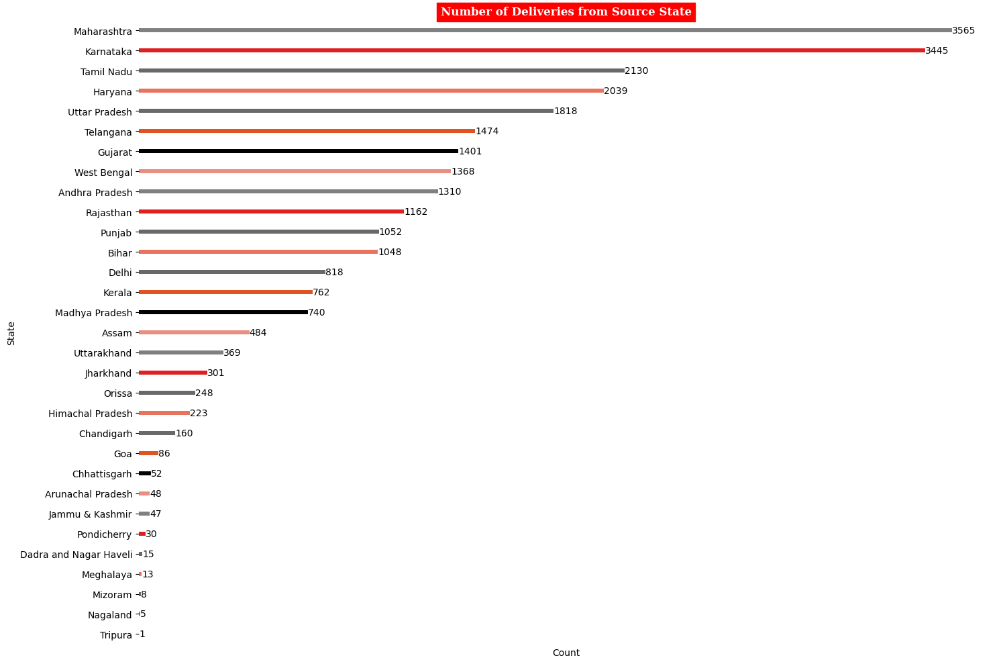

In [80]:
state_counts = de['source_state'].value_counts().to_frame().reset_index()
state_counts.columns = ['State', 'Count']

plt.figure(figsize=(15,10))
a = sns.barplot(y='State', x='Count', data=state_counts,palette=cp,width=0.2)
a.bar_label(a.containers[0], label_type='edge')
plt.xticks([])
plt.ylabel('State')
plt.xlabel('Count')
plt.title('Number of Deliveries from Source State',fontsize=12,fontfamily='serif',fontweight='bold',backgroundcolor='r',color='w')
plt.tight_layout()
sns.despine(bottom=True,left=True)
plt.show()

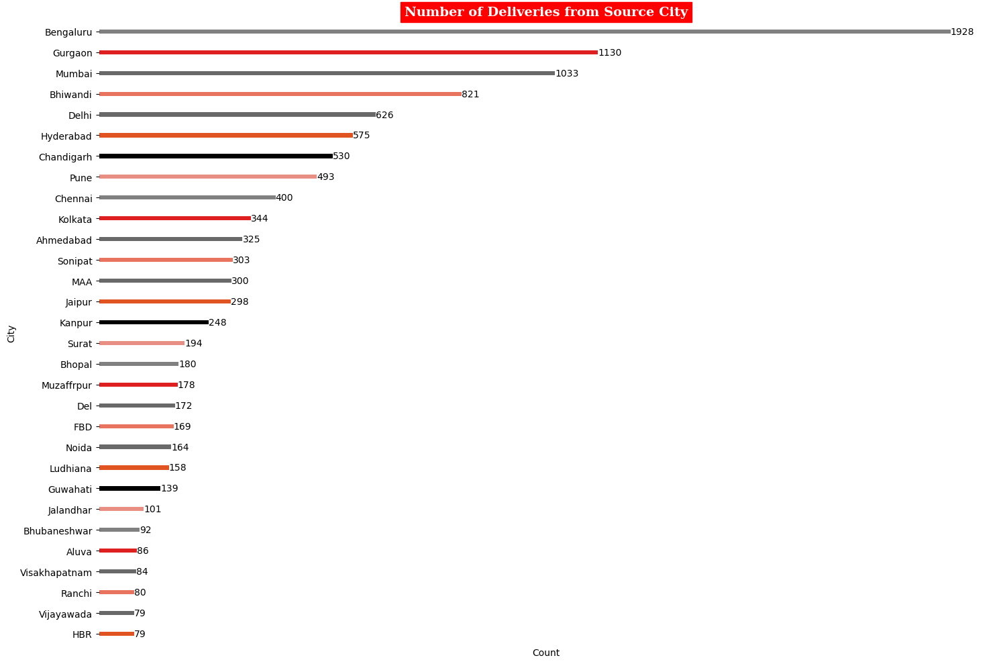

In [81]:
city_counts = de['source_city'].value_counts().to_frame().reset_index()[:30]
city_counts.columns = ['City', 'Count']

plt.figure(figsize=(15,10))
a = sns.barplot(y='City', x='Count', data=city_counts,palette=cp,width=0.2)
a.bar_label(a.containers[0], label_type='edge')
plt.xticks([])
plt.ylabel('City')
plt.xlabel('Count')
plt.title('Number of Deliveries from Source City',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor='r',color='w')
plt.tight_layout()
sns.despine(bottom=True,left=True)
plt.show()

#### 🏷️Insights:

> `Source State contributors`

- **Maharashtra**, **Karnataka** ,**Tamil Nadu**, **Haryana**, and **Uttar Pradesh** are the top contributors where maximum bookings are recorded in this month indicating significant engagement.

> `Source City contributors` 

- Cities like **Bengaluru**, **Gurgaon**, **Mumbai**, **Bhiwandi**, **Delhi**, **Hyderabad** where the major no.of booking are recorded. 

In [82]:
de.describe().T

,count,mean,min,25%,50%,75%,max,std
trip_creation_time,26222,2018-09-22 13:58:56.740969728,2018-09-12 00:00:16.535741,2018-09-17 03:57:50.900417024,2018-09-22 03:33:30.255023104,2018-09-27 19:55:17.273207040,2018-10-03 23:59:42.701692,NaN
od_start_time,26222,2018-09-22 17:49:54.012840448,2018-09-12 00:00:16.535741,2018-09-17 07:43:36.525784320,2018-09-22 07:17:15.379571712,2018-09-27 23:22:20.105725952,2018-10-06 04:27:23.392375,NaN
od_end_time,26222,2018-09-22 22:49:00.449498112,2018-09-12 00:50:10.814399,2018-09-17 15:10:35.615369472,2018-09-22 14:46:05.410478848,2018-09-28 03:19:50.211971840,2018-10-08 03:00:24.353479,NaN
start_scan_to_end_scan,26222.0,298.553375,20.0,90.0,152.0,307.0,7898.0,441.116974
actual_distance_to_destination,26222.0,92.533051,9.001351,21.65415,35.044329,65.557392,1927.447754,209.952652
actual_time,26222.0,200.92659,9.0,51.0,84.0,167.0,4532.0,385.728271
osrm_time,26222.0,90.785332,6.0,25.0,39.0,72.0,1686.0,185.558731
osrm_distance,26222.0,114.975334,9.0729,27.71915,43.54355,85.443949,2326.199219,254.426529
segment_actual_time,26222.0,199.095642,9.0,50.0,83.0,166.0,4504.0,382.145752
segment_osrm_time,26222.0,101.793343,6.0,25.0,42.0,79.0,1938.0,216.205933


In [83]:
de.describe(include='object').T

,count,unique,top,freq
segment_key,26222,26222,trip-153671041653548748+IND209304AAA+IND000000ACB,1
trip_uuid,26222,14787,trip-153717306559016761,8
source_name,26222,1496,Gurgaon_Bilaspur_HB (Haryana),1052
destination_name,26222,1466,Gurgaon_Bilaspur_HB (Haryana),928
source_city,26222,1239,Bengaluru,1928
source_place,26222,1246,Bilaspur_HB,1052
source_state,26222,31,Maharashtra,3565
destination_city,26222,1236,Bengaluru,1863
destination_place,26222,1217,Bilaspur_HB,928
destination_state,26222,32,Karnataka,3497


In [84]:
de['destination_city'].unique()

array(['Gurgaon', 'Kanpur', 'Chikblapur', 'Doddablpur', 'Chandigarh',
       'Mumbai', 'Hospet', 'Bellary', 'Sandur', 'Chennai', 'Bengaluru',
       'HBR', 'Surat', 'Delhi', 'PNQ', 'Faridabad', 'Kolhapur', 'Shirala',
       'Ratnagiri', 'Anantapur', 'Hyderabad', 'Sindagi', 'Gulbarga',
       'Indi', 'Aland', 'Jaipur', 'Satna', 'Janakpuri', 'Guwahati',
       'Unnao', 'Gadarwara', 'Bareli', 'Shirdi', 'Sinnar', 'Sangamner',
       'Shrirampur', 'Kopargaon', 'Vaijiapur', 'Nashik', 'Kolkata',
       'Hoogly', 'Hooghly', 'Pavagada', 'Puttaprthi', 'Sivasagar',
       'Medchal', 'Oddnchtram', 'Batlagundu', 'Vadipatti', 'Kodaikanal',
       'Palani', 'Nakodar', 'Kapurthala', 'Jalandhar', 'Yavatmal',
       'Atapadi', 'Sangola', 'Bhandara', 'Savner', 'Kurnool', 'Palwal',
       'FBD', 'TalwandiSabo', 'Mansa', 'Jhunir', 'Bhatinda', 'Bhiwandi',
       'Barnala', 'Murbad', 'AnandprShb', 'RoopNagar', 'Puttur', 'Kadaba',
       'Chittapur', 'Sedam', 'Chincholi', 'Naraingarh', 'Ludhiana',
       'Ahm

In [85]:
de['destination_place'].unique()

array(['Bilaspur_HB', 'Central_H_6', 'ShntiSgr_D', 'ChikaDPP_D',
       'Mehmdpur_H', 'MiraRd_IP', 'Hospet', 'Dc', 'WrdN1DPP_D',
       'Sriperumbudur_Dc', 'Poonamallee', 'Vandalur_Dc', 'NwYlhnka_DC',
       'Layout PC', 'Central_I_4', 'Central_D_3', 'Bhogal',
       'Rahatani DPC', 'Faridabad', 'Shivaji_I', 'Central_DPP_3',
       'MjgaonRd_D', 'KamaStrt_I', 'Nelmngla_H', 'Uppal_I', 'KalyanNg_D',
       'Nehrugnj_I', 'SindgiRD_D', 'RazaviRd_D', 'Bhankrot_DC',
       'Central_I_7', 'Central_I_2', 'Janakpuri', 'Hub', 'VikasRam_D',
       'MPward_D', 'SourvDPP_D', 'Varachha_DC', 'SaiBansi_D',
       'Central_D_1', 'JawanChk_D', 'DavkharRd_D', 'NkshtrPz_D',
       'YeolaRD_D', 'TgrniaRD_I', 'North_I_4', 'Bandel_D', 'DC',
       'PnukndRD_D', 'Gokulam_D', 'Babupaty_D', 'Bomsndra_HB',
       'MROoffce_D', 'Alwal_I', 'Palani_D', 'RTOofice_D', 'lalaNGR_D',
       'Athithnr_DC', 'RjndraRd_D', 'ChowkDPP_D', 'DPC', 'Mohali',
       'Mullanpr_DC', 'Sanpada_I', 'JajuDPP_D', 'Vidyangr_D',
       'C

In [86]:
de['destination_state'].unique()

array(['Haryana', 'Uttar Pradesh', 'Karnataka', 'Punjab', 'Maharashtra',
       'Tamil Nadu', 'Gujarat', 'Delhi', 'Andhra Pradesh', 'Telangana',
       'Rajasthan', 'Madhya Pradesh', 'Assam', 'West Bengal',
       'Chandigarh', 'Dadra and Nagar Haveli', 'Orissa', 'Uttarakhand',
       'Bihar', 'Jharkhand', 'Pondicherry', 'Goa', 'Himachal Pradesh',
       'Kerala', 'Arunachal Pradesh', 'Mizoram', 'Chhattisgarh',
       'Jammu & Kashmir', 'Meghalaya', 'Nagaland', 'Tripura',
       'Daman & Diu'], dtype=object)

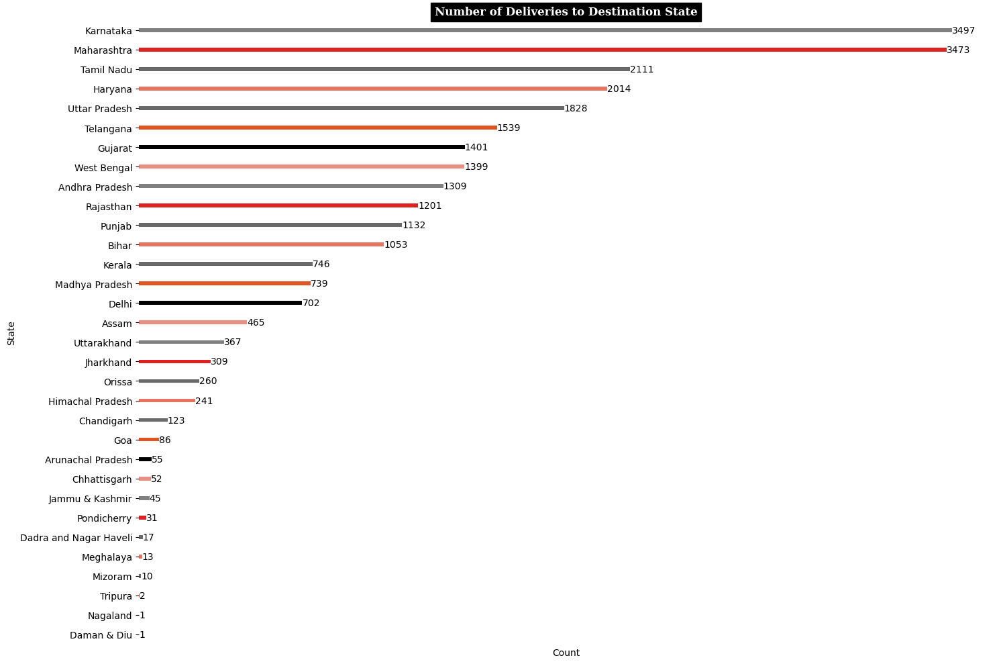

In [87]:
state_counts = de['destination_state'].value_counts().to_frame().reset_index()
state_counts.columns = ['State', 'Count']

plt.figure(figsize=(15,10))
a = sns.barplot(y='State', x='Count', data=state_counts,palette=cp,width=0.2)
a.bar_label(a.containers[0], label_type='edge')
plt.xticks([])
plt.ylabel('State')
plt.xlabel('Count')
plt.title('Number of Deliveries to Destination State',fontsize=12,fontfamily='serif',fontweight='bold',backgroundcolor='k',color='w')
plt.tight_layout()
sns.despine(bottom=True,left=True)
plt.show()

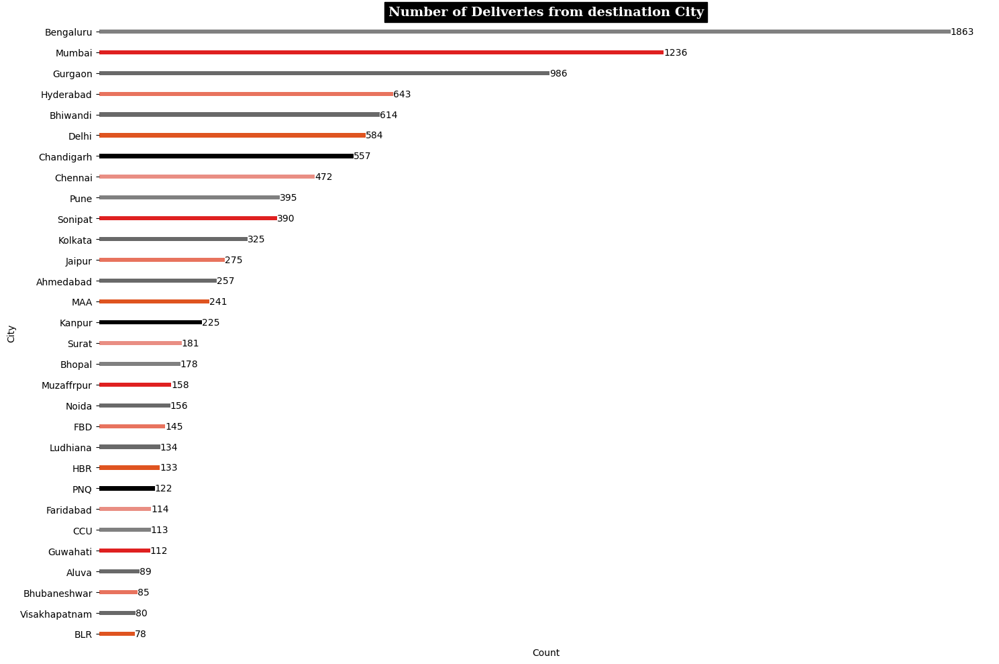

In [88]:
city_counts = de['destination_city'].value_counts().to_frame().reset_index()[:30]
city_counts.columns = ['City', 'Count']

plt.figure(figsize=(15,10))
a = sns.barplot(y='City', x='Count', data=city_counts,palette=cp,width=0.2)
a.bar_label(a.containers[0], label_type='edge')
plt.xticks([])
plt.ylabel('City')
plt.xlabel('Count')
plt.title('Number of Deliveries from destination City',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor='k',color='w')
plt.tight_layout()
sns.despine(bottom=True,left=True)
plt.show()

#### 🏷️Insights:

> `Destination State`

- States like **Karnataka**, **Maharashtra**, **Tamil Nadu**, **Haryana**, and **Uttar Pradesh** where maximum packages are received in this month indicating significant engagement.

> `Destination City` 

- Cities like **Bengaluru**, **Mumbai**, **Gurgaon**, **Bhiwandi**, **Hyderabad**, **Delhi** where the major no.of booking are received. 

In [89]:
np.set_printoptions(threshold=np.inf)

In [90]:
de['corridor'] = de['source_name'] +' <---> '+ de['destination_name']
de['corridor'].value_counts()

corridor
Bangalore_Nelmngla_H (Karnataka) <---> Bengaluru_KGAirprt_HB (Karnataka)            151
Bangalore_Nelmngla_H (Karnataka) <---> Bengaluru_Bomsndra_HB (Karnataka)            127
Bengaluru_Bomsndra_HB (Karnataka) <---> Bengaluru_KGAirprt_HB (Karnataka)           121
Bengaluru_KGAirprt_HB (Karnataka) <---> Bangalore_Nelmngla_H (Karnataka)            108
Pune_Tathawde_H (Maharashtra) <---> Bhiwandi_Mankoli_HB (Maharashtra)               107
                                                                                   ... 
Ongole_SubhVRTL_I (Andhra Pradesh) <---> Kandukur_LICOffce_D (Andhra Pradesh)         1
Madnapalle_PngnrRd_D (Andhra Pradesh) <---> Palamaner_Lakshmi_D (Andhra Pradesh)      1
Dharmavram_SaiNgr_D (Andhra Pradesh) <---> Kadiri_GVManu_D (Andhra Pradesh)           1
Baharampur_Chuanpur_I (West Bengal) <---> Chapra_NagarDPP_D (West Bengal)             1
Jaipur_NgrNigam_DC (Rajasthan) <---> Jaipur_Central_D_1 (Rajasthan)                   1
Name: count, Length: 27

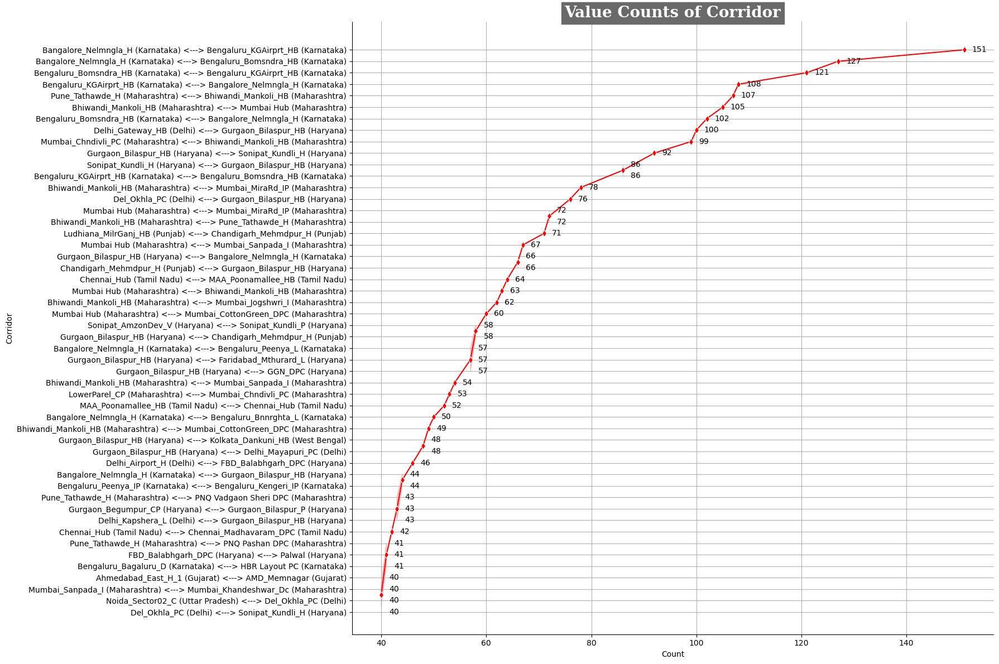

In [91]:
corridor_counts = de['corridor'].value_counts()[:50]

plt.figure(figsize=(18,12))
#corridor_counts.plot(kind='line', marker='d', color='r')
sns.lineplot(y=corridor_counts.index, x=corridor_counts.values, marker='d', color='r')
plt.title('Value Counts of Corridor',fontsize=20,fontfamily='serif',fontweight='bold',backgroundcolor='dimgrey',color='w')
plt.ylabel('Corridor')
plt.xlabel('Count')
plt.tight_layout()
sns.despine()
plt.grid(True)

for i, count in enumerate(corridor_counts.values):
    plt.text(count+1.5, corridor_counts.index[i], str(count), ha='left', va='center')

plt.show()

#### 🏷️Insights:

- The route between **Bangalore_Nelamangala_H** to **Bengaluru_KGAirport_HB**,**Bengaluru_Bomsndra_HB** sees the highest package volume, with 151 and 127 packages sent respectively.
- **Bengaluru_Bommasandra_HB** to **Bengaluru_KGAirport_HB** is also popular, with 121 packages sent.
- **Bengaluru_KGAirport_HB** to **Bangalore_Nelamangala_H** has moderate activity, with 108 packages sent.
4. The data indicates Bengaluru's importance as a transportation hub `Corridor` within ***Karnataka***, handling significant package traffic.

In [92]:
de['state_corridor'] = de['source_state']+'--'+de['source_city'] +' <---> '+ de['destination_state']+'--'+de['destination_city'] 
de['state_corridor'].value_counts()

state_corridor
Karnataka--Bengaluru <---> Karnataka--Bengaluru                   1413
Maharashtra--Mumbai <---> Maharashtra--Mumbai                      622
Maharashtra--Bhiwandi <---> Maharashtra--Mumbai                    512
Maharashtra--Mumbai <---> Maharashtra--Bhiwandi                    345
Telangana--Hyderabad <---> Telangana--Hyderabad                    316
                                                                  ... 
Gujarat--Jetpur <---> Gujarat--Dhoraji                               1
Andhra Pradesh--Anakapalle <---> Andhra Pradesh--Visakhapatnam       1
Andhra Pradesh--Narsiptnm <---> Andhra Pradesh--Anakapalle           1
West Bengal--MirzapurWB <---> West Bengal--Kolkata                   1
Uttar Pradesh--Anandnagar <---> Uttar Pradesh--Gorakhpur             1
Name: count, Length: 2302, dtype: int64

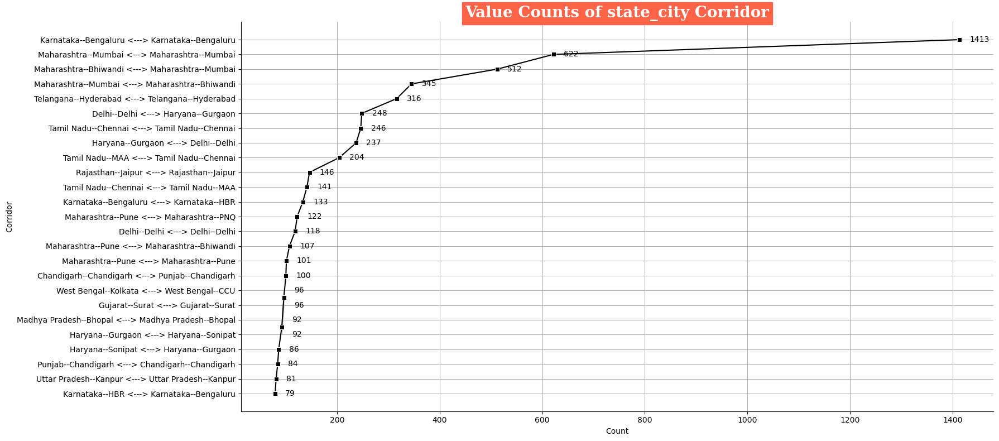

In [93]:
state_corridor_counts = de['state_corridor'].value_counts()[:25]

plt.figure(figsize=(18,8))
sns.lineplot(y=state_corridor_counts.index, x=state_corridor_counts.values, marker='s', color='k')
plt.title('Value Counts of state_city Corridor',fontsize=20,fontfamily='serif',fontweight='bold',backgroundcolor='tomato',color='w')
plt.ylabel('Corridor')
plt.xlabel('Count')
plt.tight_layout()
sns.despine()
plt.grid(True)

for i, count in enumerate(state_corridor_counts.values):
    plt.text(count+20, state_corridor_counts.index[i], str(count), ha='left', va='center')

plt.show()

In [94]:
de['city_corridor'] = de['source_city']+'--'+de['source_place'] +' <---> '+ de['destination_city']+'--'+de['destination_place'] 
display(de['city_corridor'].value_counts())

city_corridor
Bengaluru--Nelmngla_H <---> Bengaluru--KGAirprt_HB     151
Bengaluru--Nelmngla_H <---> Bengaluru--Bomsndra_HB     127
Bengaluru--Bomsndra_HB <---> Bengaluru--KGAirprt_HB    121
Bengaluru--KGAirprt_HB <---> Bengaluru--Nelmngla_H     108
Pune--Tathawde_H <---> Bhiwandi--Mankoli_HB            107
                                                      ... 
Ongole--SubhVRTL_I <---> Kandukur--LICOffce_D            1
Madnapalle--PngnrRd_D <---> Palamaner--Lakshmi_D         1
Dharmavram--SaiNgr_D <---> Kadiri--GVManu_D              1
Baharampur--Chuanpur_I <---> Chapra--NagarDPP_D          1
Jaipur--NgrNigam_DC <---> Jaipur--Central_D_1            1
Name: count, Length: 2741, dtype: int64

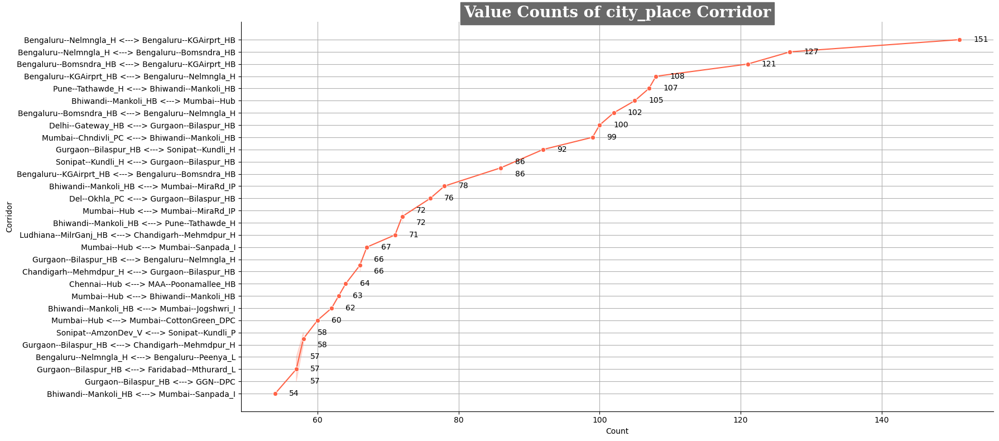

In [95]:
city_corridor_counts = de['city_corridor'].value_counts()[:30]

plt.figure(figsize=(18,8))
sns.lineplot(y=city_corridor_counts.index, x=city_corridor_counts.values, marker='o', color='tomato')
plt.title('Value Counts of city_place Corridor',fontsize=20,fontfamily='serif',fontweight='bold',backgroundcolor='dimgray',color='w')
plt.ylabel('Corridor')
plt.xlabel('Count')
plt.tight_layout()
sns.despine()
plt.grid(True)

for i, count in enumerate(city_corridor_counts.values):
    plt.text(count+2, city_corridor_counts.index[i], str(count), ha='left', va='center')

plt.show()

#### 🏷️Insights:
-  Maharashtra, Karnataka, Haryana, and Tamil Nadu serve as key starting and ending locations for delivery services.
-  Mumbai, Gurgaon, Delhi, and Bengaluru are major metropolitan centers from where many deliveries originate.
-  A large proportion of nationwide deliveries are destined for Mumbai, Bengaluru, Gurgaon, and Delhi.


In [97]:
# 4. Extracting features like month, year, day, etc. from Trip_creation_time
de['trip_creation_month'] = de['trip_creation_time'].dt.month
de['trip_creation_year'] = de['trip_creation_time'].dt.year
de['trip_creation_day'] = de['trip_creation_time'].dt.day
de['trip_creation_hour'] = de['trip_creation_time'].dt.hour
de['trip_creation_weekday'] = de['trip_creation_time'].dt.weekday
de['trip_creation_week'] = de['trip_creation_time'].dt.isocalendar().week
de

,segment_key,trip_uuid,data,route_type,trip_creation_time,source_name,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,od_total_time,od_time_diff_hour,source_city,source_place,source_state,destination_city,destination_place,destination_state,corridor,state_corridor,city_corridor,trip_creation_month,trip_creation_year,trip_creation_day,trip_creation_hour,trip_creation_weekday,trip_creation_week
0,trip-153671041653548748+IND209304AAA+IND000000ACB,trip-153671041653548748,training,FTL,2018-09-12 00:00:16.535741,Kanpur_Central_H_6 (Uttar Pradesh),Gurgaon_Bilaspur_HB (Haryana),2018-09-12 16:39:46.858469,2018-09-13 13:40:23.123744,1260.0,383.759155,732.0,329.0,446.549591,728.0,534.0,670.620483,728.0,534.0,670.620483,0 days 21:00:36.265275,21.010074,Kanpur,Central_H_6,Uttar Pradesh,Gurgaon,Bilaspur_HB,Haryana,Kanpur_Central_H_6 (Uttar Pradesh) <---> Gurga...,Uttar Pradesh--Kanpur <---> Haryana--Gurgaon,Kanpur--Central_H_6 <---> Gurgaon--Bilaspur_HB,9,2018,12,0,2,37
1,trip-153671041653548748+IND462022AAA+IND209304AAA,trip-153671041653548748,training,FTL,2018-09-12 00:00:16.535741,Bhopal_Trnsport_H (Madhya Pradesh),Kanpur_Central_H_6 (Uttar Pradesh),2018-09-12 00:00:16.535741,2018-09-12 16:39:46.858469,999.0,440.973694,830.0,388.0,544.802673,820.0,474.0,649.852783,820.0,474.0,649.852783,0 days 16:39:30.322728,16.658423,Bhopal,Trnsport_H,Madhya Pradesh,Kanpur,Central_H_6,Uttar Pradesh,Bhopal_Trnsport_H (Madhya Pradesh) <---> Kanpu...,Madhya Pradesh--Bhopal <---> Uttar Pradesh--Ka...,Bhopal--Trnsport_H <---> Kanpur--Central_H_6,9,2018,12,0,2,37
2,trip-153671042288605164+IND561203AAB+IND562101AAA,trip-153671042288605164,training,Carting,2018-09-12 00:00:22.886430,Doddablpur_ChikaDPP_D (Karnataka),Chikblapur_ShntiSgr_D (Karnataka),2018-09-12 02:03:09.655591,2018-09-12 03:01:59.598855,58.0,24.644020,47.0,26.0,28.199400,46.0,26.0,28.199501,46.0,26.0,28.199501,0 days 00:58:49.943264,0.980540,Doddablpur,ChikaDPP_D,Karnataka,Chikblapur,ShntiSgr_D,Karnataka,Doddablpur_ChikaDPP_D (Karnataka) <---> Chikbl...,Karnataka--Doddablpur <---> Karnataka--Chikblapur,Doddablpur--ChikaDPP_D <---> Chikblapur--Shnti...,9,2018,12,0,2,37
3,trip-153671042288605164+IND572101AAA+IND561203AAB,trip-153671042288605164,training,Carting,2018-09-12 00:00:22.886430,Tumkur_Veersagr_I (Karnataka),Doddablpur_ChikaDPP_D (Karnataka),2018-09-12 00:00:22.886430,2018-09-12 02:03:09.655591,122.0,48.542889,96.0,42.0,56.911598,95.0,39.0,55.989899,95.0,39.0,55.989899,0 days 02:02:46.769161,2.046325,Tumkur,Veersagr_I,Karnataka,Doddablpur,ChikaDPP_D,Karnataka,Tumkur_Veersagr_I (Karnataka) <---> Doddablpur...,Karnataka--Tumkur <---> Karnataka--Doddablpur,Tumkur--Veersagr_I <---> Doddablpur--ChikaDPP_D,9,2018,12,0,2,37
4,trip-153671043369099517+IND000000ACB+IND160002AAC,trip-153671043369099517,training,FTL,2018-09-12 00:00:33.691250,Gurgaon_Bilaspur_HB (Haryana),Chandigarh_Mehmdpur_H (Punjab),2018-09-14 03:40:17.106733,2018-09-14 17:34:55.442454,834.0,237.439606,611.0,212.0,281.210907,608.0,231.0,317.740784,608.0,231.0,317.740784,0 days 13:54:38.335721,13.910649,Gurgaon,Bilaspur_HB,Haryana,Chandigarh,Mehmdpur_H,Punjab,Gurgaon_Bilaspur_HB (Haryana) <---> Chandigarh...,Haryana--Gurgaon <---> Punjab--Chandigarh,Gurgaon--Bilaspur_HB <---> Chandigarh--Mehmdpur_H,9,2018,12,0,2,37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26217,trip-153861115439069069+IND628204AAA+IND627657AAA,trip-153861115439069069,test,Carting,2018-10-03 23:59:14.390954,Tirchchndr_Shnmgprm_D (Tamil Nadu),Thisayanvilai_UdnkdiRD_D (Tamil Nadu),2018-10-04 02:29:04.272194,2018-10-04 03:31:11.183797,62.0,33.627182,51.0,41.0,42.521301,49.0,42.0,42.143101,49.0,42.0,42.143101,0 days 01:02:06.911603,1.035253,Tirchc

## 🔷In-Depth Analysis

In [98]:
new_df = de.copy()

In [99]:
new_df.columns

Index(['segment_key', 'trip_uuid', 'data', 'route_type', 'trip_creation_time',
       'source_name', 'destination_name', 'od_start_time', 'od_end_time',
       'start_scan_to_end_scan', 'actual_distance_to_destination',
       'actual_time', 'osrm_time', 'osrm_distance', 'segment_actual_time',
       'segment_osrm_time', 'segment_osrm_distance', 'segment_actual_time_sum',
       'segment_osrm_time_sum', 'segment_osrm_distance_sum', 'od_total_time',
       'od_time_diff_hour', 'source_city', 'source_place', 'source_state',
       'destination_city', 'destination_place', 'destination_state',
       'corridor', 'state_corridor', 'city_corridor', 'trip_creation_month',
       'trip_creation_year', 'trip_creation_day', 'trip_creation_hour',
       'trip_creation_weekday', 'trip_creation_week'],
      dtype='object')

In [100]:
new_df.sample(2)

,segment_key,trip_uuid,data,route_type,trip_creation_time,source_name,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,od_total_time,od_time_diff_hour,source_city,source_place,source_state,destination_city,destination_place,destination_state,corridor,state_corridor,city_corridor,trip_creation_month,trip_creation_year,trip_creation_day,trip_creation_hour,trip_creation_weekday,trip_creation_week
3330,trip-153694740553026744+IND574104AAA+IND574216AAA,trip-153694740553026744,training,Carting,2018-09-14 17:50:05.530477,Karkala_MarketRd_D (Karnataka),Dhrmsthala_Beltngdi_D (Karnataka),2018-09-15 02:48:16.030062,2018-09-15 04:38:56.729715,110.0,43.015263,88.0,47.0,54.231701,86.0,45.0,54.231598,86.0,45.0,54.231598,0 days 01:50:40.699653,1.844639,Karkala,MarketRd_D,Karnataka,Dhrmsthala,Beltngdi_D,Karnataka,Karkala_MarketRd_D (Karnataka) <---> Dhrmsthal...,Karnataka--Karkala <---> Karnataka--Dhrmsthala,Karkala--MarketRd_D <---> Dhrmsthala--Beltngdi_D,9,2018,14,17,4,37
3755,trip-153696604384005633+IND507117AAB+IND507303AAA,trip-153696604384005633,training,FTL,2018-09-14 23:00:43.840397,Manuguru_AskNagar_D (Telangana),Sathupally_VidyaNGR_D (Telangana),2018-09-15 04:15:30.426079,2018-09-15 07:28:59.609574,193.0,79.276848,177.0,92.0,121.918297,176.0,139.0,114.664200,176.0,139.0,114.664200,0 days 03:13:29.183495,3.224773,Manuguru,AskNagar_D,Telangana,Sathupally,VidyaNGR_D,Telangana,Manuguru_AskNagar_D (Telangana) <---> Sathupal...,Telangana--Manuguru <---> Telangana--Sathupally,Manuguru--AskNagar_D <---> Sathupally--VidyaNGR_D,9,2018,14,23,4,37


In [101]:
create_trip_dict={
  'data' : 'first',
  'route_type' : 'first',
  'od_start_time':'first',
  'od_end_time':'last',
  'od_time_diff_hour' : 'sum',
  'trip_creation_time' : 'first',
  'trip_creation_month' : 'first',
  'trip_creation_year' : 'first',
  'trip_creation_day' : 'first',
  'trip_creation_hour' : 'first',
  'trip_creation_weekday' : 'first',
  'trip_creation_week' : 'first',
  'start_scan_to_end_scan' : 'sum',
  'actual_distance_to_destination' : 'sum',
  'actual_time' : 'sum',
  'osrm_time' : 'sum',
  'osrm_distance' : 'sum',
  'segment_actual_time': 'sum',
  'segment_osrm_time': 'sum',
  'segment_osrm_distance': 'sum',
  'segment_actual_time_sum': 'sum',
  'segment_osrm_time_sum': 'sum',
  'segment_osrm_distance_sum': 'sum',
  'source_name': 'first',
  'source_city':'first', 
  'source_state':'first', 
  'source_place':'first',
  'destination_name': 'first',
  'destination_city':'first',
  'destination_state':'first',
  'destination_place':'first',
  'corridor':'first',
  'state_corridor':'first',
  'city_corridor':'first'
  }

trip_agg_df = new_df.groupby('trip_uuid').agg(create_trip_dict).reset_index()
trip_agg_df

,trip_uuid,data,route_type,od_start_time,od_end_time,od_time_diff_hour,trip_creation_time,trip_creation_month,trip_creation_year,trip_creation_day,trip_creation_hour,trip_creation_weekday,trip_creation_week,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,source_name,source_city,source_state,source_place,destination_name,destination_city,destination_state,destination_place,corridor,state_corridor,city_corridor
0,trip-153671041653548748,training,FTL,2018-09-12 16:39:46.858469,2018-09-12 16:39:46.858469,37.668497,2018-09-12 00:00:16.535741,9,2018,12,0,2,37,2259.0,824.732849,1562.0,717.0,991.352295,1548.0,1008.0,1320.473267,1548.0,1008.0,1320.473267,Kanpur_Central_H_6 (Uttar Pradesh),Kanpur,Uttar Pradesh,Central_H_6,Gurgaon_Bilaspur_HB (Haryana),Gurgaon,Haryana,Bilaspur_HB,Kanpur_Central_H_6 (Uttar Pradesh) <---> Gurga...,Uttar Pradesh--Kanpur <---> Haryana--Gurgaon,Kanpur--Central_H_6 <---> Gurgaon--Bilaspur_HB
1,trip-153671042288605164,training,Carting,2018-09-12 02:03:09.655591,2018-09-12 02:03:09.655591,3.026865,2018-09-12 00:00:22.886430,9,2018,12,0,2,37,180.0,73.186905,143.0,68.0,85.111000,141.0,65.0,84.189400,141.0,65.0,84.189400,Doddablpur_ChikaDPP_D (Karnataka),Doddablpur,Karnataka,ChikaDPP_D,Chikblapur_ShntiSgr_D (Karnataka),Chikblapur,Karnataka,ShntiSgr_D,Doddablpur_ChikaDPP_D (Karnataka) <---> Chikbl...,Karnataka--Doddablpur <---> Karnataka--Chikblapur,Doddablpur--ChikaDPP_D <---> Chikblapur--Shnti...
2,trip-153671043369099517,training,FTL,2018-09-14 03:40:17.106733,2018-09-14 03:40:17.106733,65.572709,2018-09-12 00:00:33.691250,9,2018,12,0,2,37,3933.0,1927.404297,3347.0,1740.0,2354.066650,3308.0,1941.0,2545.267822,3308.0,1941.0,2545.267822,Gurgaon_Bilaspur_HB (Haryana),Gurgaon,Haryana,Bilaspur_HB,Chandigarh_Mehmdpur_H (Punjab),Chandigarh,Punjab,Mehmdpur_H,Gurgaon_Bilaspur_HB (Haryana) <---> Chandigarh...,Haryana--Gurgaon <---> Punjab--Chandigarh,Gurgaon--Bilaspur_HB <---> Chandigarh--Mehmdpur_H
3,trip-153671046011330457,training,Carting,2018-09-12 00:01:00.113710,2018-09-12 01:41:29.809822,1.674916,2018-09-12 00:01:00.113710,9,2018,12,0,2,37,100.0,17.175274,59.0,15.0,19.680000,59.0,16.0,19.876600,59.0,16.0,19.876600,Mumbai Hub (Maharashtra),Mumbai,Maharashtra,Hub,Mumbai_MiraRd_IP (Maharashtra),Mumbai,Maharashtra,MiraRd_IP,Mumbai Hub (Maharashtra) <---> Mumbai_MiraRd_I...,Maharashtra--Mumbai <---> Maharashtra--Mumbai,Mumbai--Hub <---> Mumbai--MiraRd_IP
4,trip-153671052974046625,training,FTL,2018-09-12 00:02:09.740725,2018-09-12 03:54:43.114421,11.972484,2018-09-12 00:02:09.740725,9,2018,12,0,2,37,717.0,127.448502,341.0,117.0,146.791794,340.0,115.0,146.791901,340.0,115.0,146.791901,Bellary_Dc (Karnataka),Bellary,Karnataka,Dc,Hospet (Karnataka),Hospet,Karnataka,Hospet,Bellary_Dc (Karnataka) <---> Hospet (Karnataka),Karnataka--Bellary <---> Karnataka--Hospet,Bellary--Dc <---> Hospet--Hospet
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14782,trip-153861095625827784,test,Carting,2018-10-03 23:55:56.258533,2018-10-04 06:41:25.409035,4.300482,2018-10-03 23:55:56.258533,10,2018,3,23,2,40,257.0,57.762333,83.0,62.0,73.462997,82.0,62.0,64.855103,82.0,62.0,64.855103,Chandigarh_Mehmdpur_H (Punjab),Chandigarh,Punjab,Mehmdpur_H,Zirakpur_DC (Punjab),Zirakpur,Punjab,DC,Chandigarh_Mehmdpur_H (Punjab) <---> Zirakpur_...,Punjab--Chandigarh <---> Punjab--Zirakpur,Chandigarh--Mehmdpur_H <---> Zirakpur--DC
14783,trip-153861104386292051,test,Carting,2018-10-03 23:57:23.863155,2018-10-04 00:57:59.294434,1.009842,2018-10-03 23:57:23.863155,10,2018,3,23,2,40,60.0,15.513784,21.0,12.0,16.088200,21.0,11.0,16.088299,21.0,11.0,16.088299,FBD_Balabhgarh_DPC (Haryana),FBD,Haryana,Balabhgarh_DPC,Faridabad_Blbgarh_DC (Haryana),Faridabad,Haryana,Blbgarh_DC,FBD_Balabhgarh_DPC (Haryana) <--

In [102]:
numerical_columns = trip_agg_df.select_dtypes(include=[np.float32, np.float64])
numerical_columns

,od_time_diff_hour,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum
0,37.668497,2259.0,824.732849,1562.0,717.0,991.352295,1548.0,1008.0,1320.473267,1548.0,1008.0,1320.473267
1,3.026865,180.0,73.186905,143.0,68.0,85.111000,141.0,65.0,84.189400,141.0,65.0,84.189400
2,65.572709,3933.0,1927.404297,3347.0,1740.0,2354.066650,3308.0,1941.0,2545.267822,3308.0,1941.0,2545.267822
3,1.674916,100.0,17.175274,59.0,15.0,19.680000,59.0,16.0,19.876600,59.0,16.0,19.876600
4,11.972484,717.0,127.448502,341.0,117.0,146.791794,340.0,115.0,146.791901,340.0,115.0,146.791901
...,...,...,...,...,...,...,...,...,...,...,...,...
14782,4.300482,257.0,57.762333,83.0,62.0,73.462997,82.0,62.0,64.855103,82.0,62.0,64.855103
14783,1.009842,60.0,15.513784,21.0,12.0,16.088200,21.0,11.0,16.088299,21.0,11.0,16.088299
14784,7.035331,421.0,38.684837,282.0,48.0,58.903702,281.0,88.0,104.886597,281.0,88.0,104.886597
14785,5.808548,347.0,134.723831,264.0,179.0,171.110306,258.0,221.0,223.532394,258.0,221.0,223.532394


In [103]:
numerical_columns.describe().T

,count,mean,std,min,25%,50%,75%,max
od_time_diff_hour,14787.0,8.840187,10.978880,0.391024,2.494975,4.661846,10.558962,131.642533
start_scan_to_end_scan,14787.0,529.429016,658.254395,23.000000,149.000000,279.000000,632.000000,7898.000000
actual_distance_to_destination,14787.0,164.090195,305.502808,9.002461,22.777099,48.287895,163.591255,2186.531738
actual_time,14787.0,356.306000,561.517761,9.000000,67.000000,148.000000,367.000000,6265.000000
osrm_time,14787.0,160.990936,271.459229,6.000000,29.000000,60.000000,168.000000,2032.000000
osrm_distance,14787.0,203.887405,370.565460,9.072900,30.756900,65.302795,206.644203,2840.081055
segment_actual_time,14787.0,353.059174,556.364441,9.000000,66.000000,147.000000,364.000000,6230.000000
segment_osrm_time,14787.0,180.511597,314.678741,6.000000,30.000000,65.000000,184.000000,2564.000000
segment_osrm_distance,14787.0,222.705444,416.845642,9.072900,32.578850,69.784203,216.560608,3523.632324
segment_actual_time_sum,14787.0,353.059174,556.364441,9.000000,66.000000,147.000000,364.000000,6230.000000


In [104]:
trip_agg_df.describe(include = object).T

,count,unique,top,freq
trip_uuid,14787,14787,trip-153671041653548748,1
source_name,14787,930,Gurgaon_Bilaspur_HB (Haryana),1052
source_city,14787,713,Bengaluru,1700
source_state,14787,29,Maharashtra,2714
source_place,14787,788,Bilaspur_HB,1052
destination_name,14787,1042,Gurgaon_Bilaspur_HB (Haryana),745
destination_city,14787,851,Bengaluru,1633
destination_state,14787,32,Maharashtra,2569
destination_place,14787,866,Bilaspur_HB,745
corridor,14787,1737,Bangalore_Nelmngla_H (Karnataka) <---> Bengalu...,151


In [105]:
trip_df = trip_agg_df.copy()

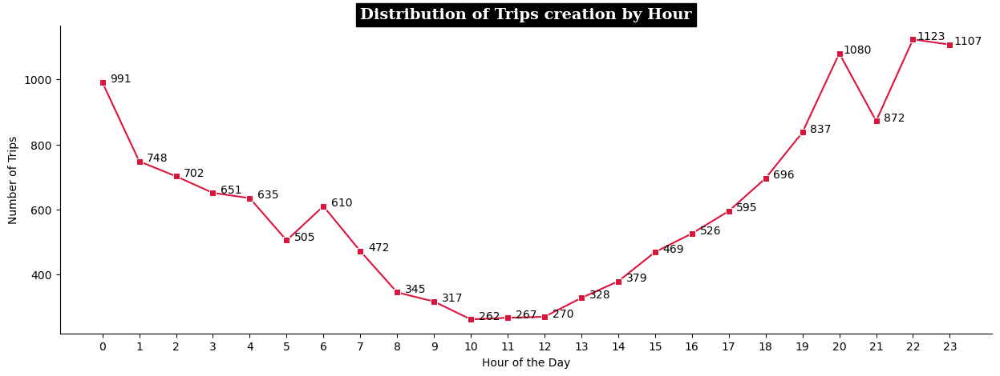

In [106]:
trip_creation_by_hour = trip_df.groupby(by='trip_creation_hour')['trip_uuid'].count().reset_index()

plt.figure(figsize=(15,5))
sns.lineplot(data=trip_creation_by_hour, x='trip_creation_hour', y='trip_uuid', marker='s', color='crimson')
plt.xticks(np.arange(0, 24))

for i, count in enumerate(trip_creation_by_hour['trip_uuid']):
    plt.text(trip_creation_by_hour['trip_creation_hour'][i]+0.5, count, count, ha='center')

plt.title('Distribution of Trips creation by Hour',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor='k',color='w')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Trips')
sns.despine()
plt.show()

In [107]:
trip_df.sample()

,trip_uuid,data,route_type,od_start_time,od_end_time,od_time_diff_hour,trip_creation_time,trip_creation_month,trip_creation_year,trip_creation_day,trip_creation_hour,trip_creation_weekday,trip_creation_week,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,source_name,source_city,source_state,source_place,destination_name,destination_city,destination_state,destination_place,corridor,state_corridor,city_corridor
7917,trip-153765583943264913,training,Carting,2018-09-22 22:37:19.432896,2018-09-22 23:19:42.965506,0.706537,2018-09-22 22:37:19.432896,9,2018,22,22,5,38,42.0,12.338054,14.0,9.0,12.3592,13.0,9.0,12.359099,13.0,9.0,12.359099,Sonipat_AmzonDev_V (Haryana),Sonipat,Haryana,AmzonDev_V,Sonipat_Kundli_P (Haryana),Sonipat,Haryana,Kundli_P,Sonipat_AmzonDev_V (Haryana) <---> Sonipat_Kun...,Haryana--Sonipat <---> Haryana--Sonipat,Sonipat--AmzonDev_V <---> Sonipat--Kundli_P


In [108]:
trip_df.trip_creation_year.value_counts()

trip_creation_year
2018    14787
Name: count, dtype: int64

In [109]:
trip_df.trip_creation_month.value_counts()

trip_creation_month
9     13011
10     1776
Name: count, dtype: int64

In [110]:
trip_df['trip_creation_month'].value_counts(normalize = True) * 100

trip_creation_month
9     87.98945
10    12.01055
Name: proportion, dtype: float64

In [111]:
trip_df.trip_creation_week.value_counts()

trip_creation_week
38    5001
39    4402
37    3608
40    1776
Name: count, dtype: Int64

In [112]:
trip_df.trip_creation_weekday.value_counts(ascending=True)

trip_creation_weekday
6    1753
0    1980
1    2035
4    2057
3    2103
5    2128
2    2731
Name: count, dtype: int64

In [113]:
trip_df['trip_creation_day_week'] = trip_df['trip_creation_time'].dt.day_name()

In [114]:
trip_df.trip_creation_day.value_counts()

trip_creation_day
18    791
15    783
13    750
12    747
21    740
22    740
17    722
14    712
20    703
25    695
26    683
19    674
24    658
27    650
23    631
3     627
16    616
28    605
29    605
1     600
2     549
30    506
Name: count, dtype: int64

In [123]:
trip_df.sample()

,trip_uuid,data,route_type,od_start_time,od_end_time,od_time_diff_hour,trip_creation_time,trip_creation_month,trip_creation_year,trip_creation_day,trip_creation_hour,trip_creation_weekday,trip_creation_week,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,source_name,source_city,source_state,source_place,destination_name,destination_city,destination_state,destination_place,corridor,state_corridor,city_corridor,trip_creation_day_week,trip_creation_dayofdate
8403,trip-153772987770593762,training,FTL,2018-09-24 00:14:22.226774,2018-09-24 02:42:00.976996,3.847563,2018-09-23 19:11:17.706293,9,2018,23,19,6,38,230.0,69.34938,130.0,82.0,79.446396,129.0,86.0,83.658005,129.0,86.0,83.658005,Pattukotai_anthniyr_D (Tamil Nadu),Pattukotai,Tamil Nadu,anthniyr_D,Peravurani_SH71_D (Tamil Nadu),Peravurani,Tamil Nadu,SH71_D,Pattukotai_anthniyr_D (Tamil Nadu) <---> Perav...,Tamil Nadu--Pattukotai <---> Tamil Nadu--Perav...,Pattukotai--anthniyr_D <---> Peravurani--SH71_D,Sunday,23


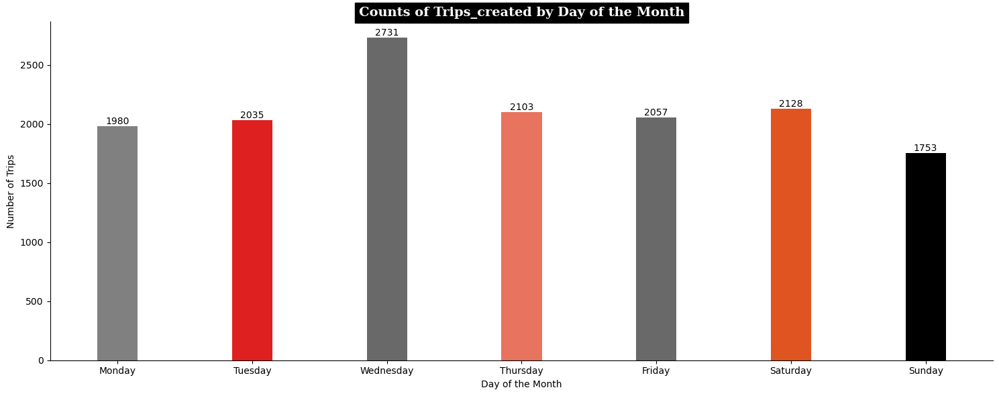

In [125]:
plt.figure(figsize=(15,6))

weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
day_counts = trip_df['trip_creation_day_week'].value_counts().reindex(weekday_order)

sns.barplot(x=day_counts.index, y=day_counts.values, palette=cp,width=0.3)
for i, count in enumerate(day_counts.values):
    plt.text(i, count, str(count), ha='center', va='bottom')
plt.title('Counts of Trips_created by Day of the Month',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor='k',color='w')
plt.xlabel('Day of the Month')
plt.ylabel('Number of Trips')
plt.tight_layout()
sns.despine()
plt.show()

In [126]:
trip_df['trip_creation_dayofdate'] = trip_df['trip_creation_time'].dt.day

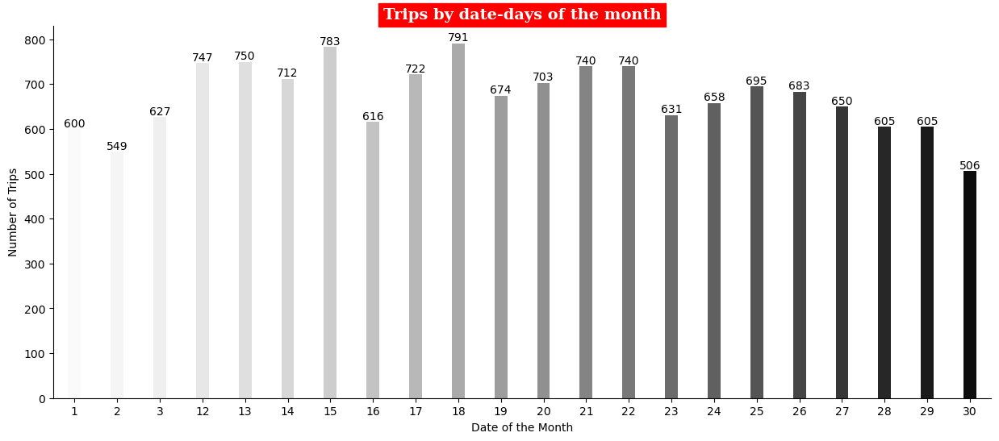

In [127]:
trips_by_dateday = trip_df.groupby(by = 'trip_creation_dayofdate')['trip_uuid'].count().to_frame().reset_index()

plt.figure(figsize = (15, 6))
sns.barplot(data =trip_df,x = trips_by_dateday['trip_creation_dayofdate'],y = trips_by_dateday['trip_uuid'], palette='Greys',width=0.3)
for i, count in enumerate(trips_by_dateday['trip_uuid']):
    plt.text(i, count, str(count), ha='center', va='bottom')
plt.title('Trips by date-days of the month',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor='r',color='w')
plt.xlabel('Date of the Month')
plt.ylabel('Number of Trips')
sns.despine()
plt.show()

## 📈Outlier treatment

In [128]:
numerical_columns

,od_time_diff_hour,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum
0,37.668497,2259.0,824.732849,1562.0,717.0,991.352295,1548.0,1008.0,1320.473267,1548.0,1008.0,1320.473267
1,3.026865,180.0,73.186905,143.0,68.0,85.111000,141.0,65.0,84.189400,141.0,65.0,84.189400
2,65.572709,3933.0,1927.404297,3347.0,1740.0,2354.066650,3308.0,1941.0,2545.267822,3308.0,1941.0,2545.267822
3,1.674916,100.0,17.175274,59.0,15.0,19.680000,59.0,16.0,19.876600,59.0,16.0,19.876600
4,11.972484,717.0,127.448502,341.0,117.0,146.791794,340.0,115.0,146.791901,340.0,115.0,146.791901
...,...,...,...,...,...,...,...,...,...,...,...,...
14782,4.300482,257.0,57.762333,83.0,62.0,73.462997,82.0,62.0,64.855103,82.0,62.0,64.855103
14783,1.009842,60.0,15.513784,21.0,12.0,16.088200,21.0,11.0,16.088299,21.0,11.0,16.088299
14784,7.035331,421.0,38.684837,282.0,48.0,58.903702,281.0,88.0,104.886597,281.0,88.0,104.886597
14785,5.808548,347.0,134.723831,264.0,179.0,171.110306,258.0,221.0,223.532394,258.0,221.0,223.532394


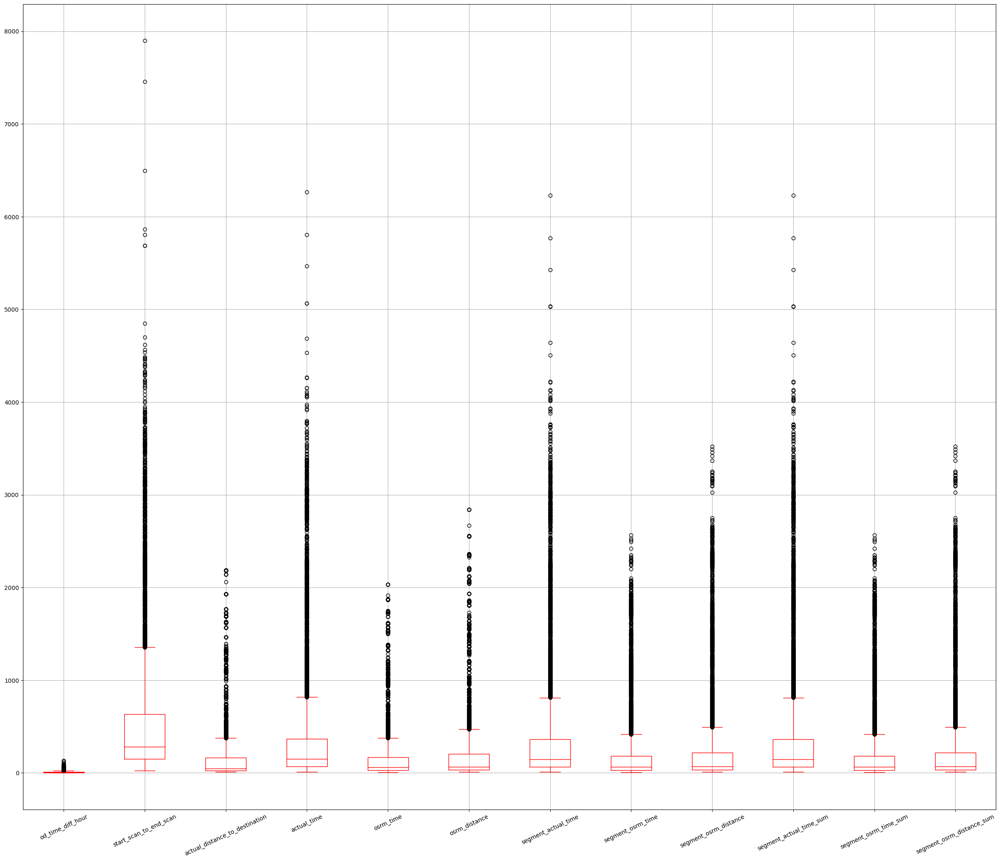

In [129]:
plt.figure(figsize=(30, 25))
numerical_columns.boxplot(rot=25, figsize=(35,20), color = 'r')
plt.grid('off')
plt.show()

In [130]:
numerical_columns.columns

Index(['od_time_diff_hour', 'start_scan_to_end_scan',
       'actual_distance_to_destination', 'actual_time', 'osrm_time',
       'osrm_distance', 'segment_actual_time', 'segment_osrm_time',
       'segment_osrm_distance', 'segment_actual_time_sum',
       'segment_osrm_time_sum', 'segment_osrm_distance_sum'],
      dtype='object')

In [131]:
num_cols = numerical_columns.columns.tolist()
num_cols

['od_time_diff_hour',
 'start_scan_to_end_scan',
 'actual_distance_to_destination',
 'actual_time',
 'osrm_time',
 'osrm_distance',
 'segment_actual_time',
 'segment_osrm_time',
 'segment_osrm_distance',
 'segment_actual_time_sum',
 'segment_osrm_time_sum',
 'segment_osrm_distance_sum']

In [132]:
# obtain the first quartile
Q1 = numerical_columns.quantile(0.25)

# obtain the third quartile
Q3 = numerical_columns.quantile(0.75)

# obtain the IQR
IQR = Q3 - Q1

# print the IQR
print(IQR)

od_time_diff_hour                   8.063987
start_scan_to_end_scan            483.000000
actual_distance_to_destination    140.814157
actual_time                       300.000000
osrm_time                         139.000000
osrm_distance                     175.887303
segment_actual_time               298.000000
segment_osrm_time                 154.000000
segment_osrm_distance             183.981758
segment_actual_time_sum           298.000000
segment_osrm_time_sum             154.000000
segment_osrm_distance_sum         183.981758
dtype: float64


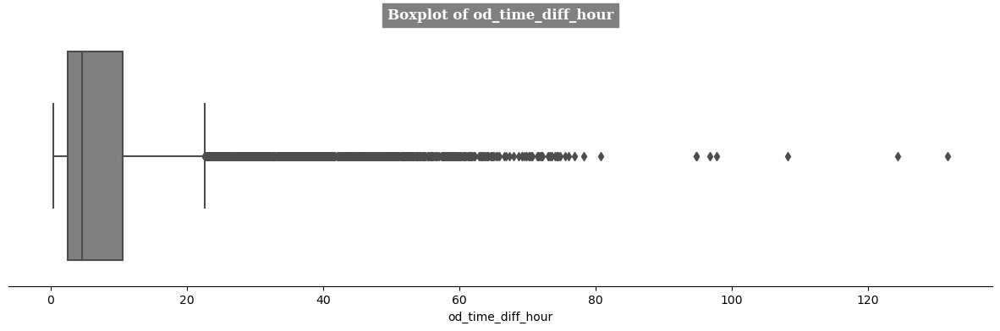

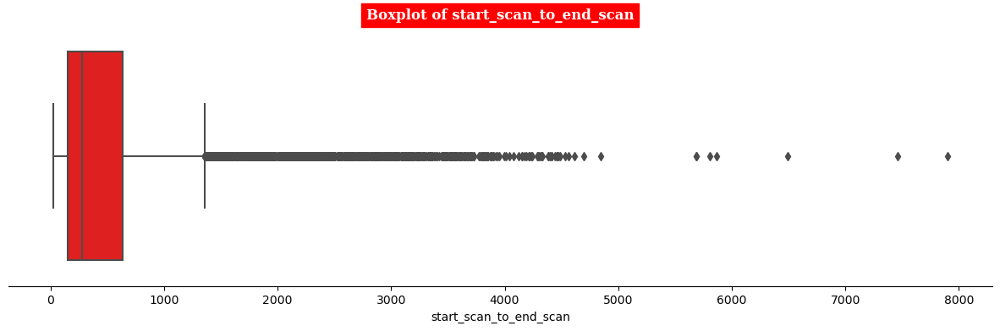

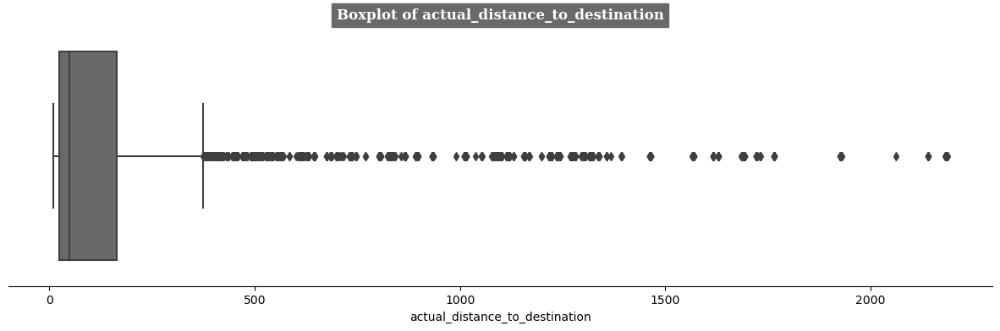

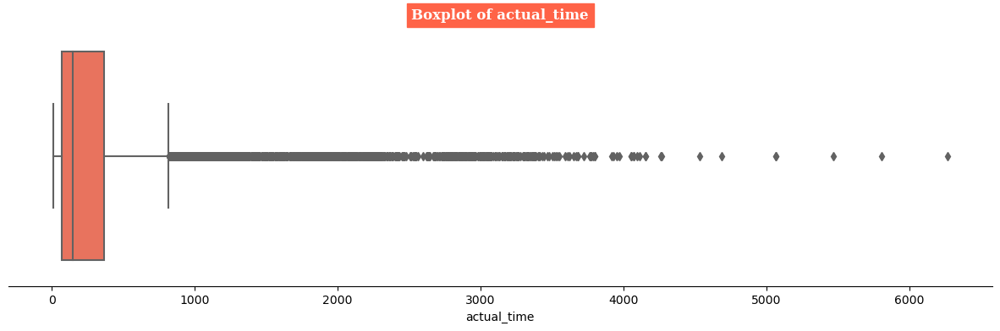

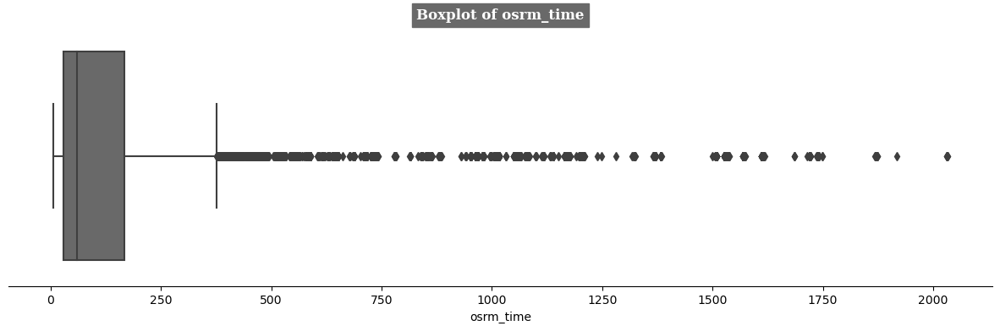

...

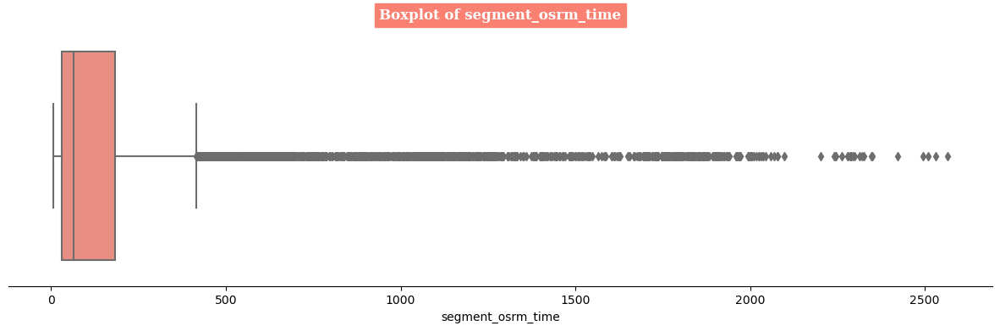

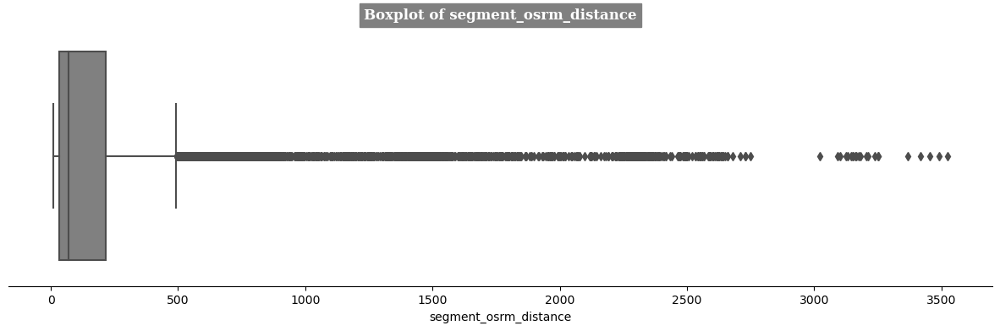

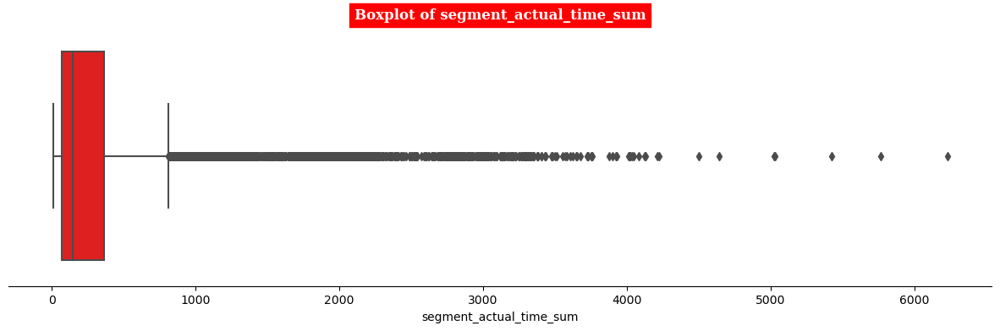

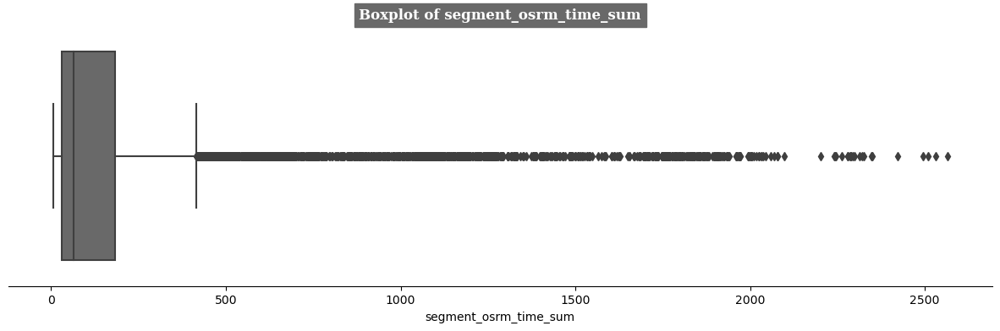

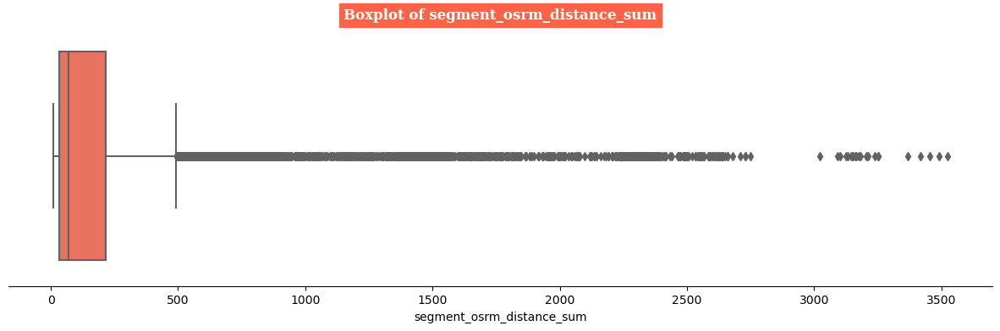

In [133]:
for i,col in enumerate(numerical_columns):
    plt.figure(figsize=(15,4))
    sns.boxplot(x=col, data=numerical_columns,color=cp[i])
    sns.despine(left=True)
    plt.yticks([])
    plt.title(f'Boxplot of {col}',fontfamily='serif',fontweight='bold',fontsize=12,backgroundcolor=cp[i],color='w')
    plt.show()

### ❇️Outlier Removal 

,od_time_diff_hour
0,37.668497
1,3.026865
2,65.572709
3,1.674916
4,11.972484
...,...
14782,4.300482
14783,1.009842
14784,7.035331
14785,5.808548


Clipped data of od_time_diff_hour


,od_time_diff_hour
0,22.654942
1,3.026865
2,22.654942
3,1.674916
4,11.972484
...,...
14782,4.300482
14783,1.009842
14784,7.035331
14785,5.808548



Filtered data of od_time_diff_hour


,od_time_diff_hour
0,37.668497
1,3.026865
2,65.572709
3,1.674916
4,11.972484
...,...
14782,4.300482
14783,1.009842
14784,7.035331
14785,5.808548


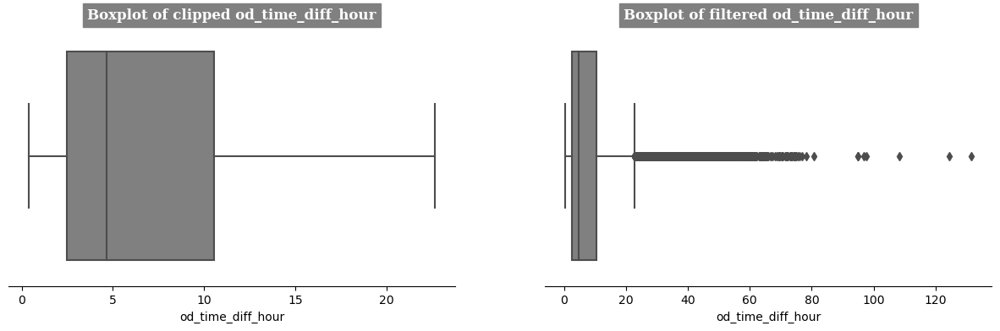

,start_scan_to_end_scan
0,2259.0
1,180.0
2,3933.0
3,100.0
4,717.0
...,...
14782,257.0
14783,60.0
14784,421.0
14785,347.0


Clipped data of start_scan_to_end_scan


,start_scan_to_end_scan
0,1356.5
1,180.0
2,1356.5
3,100.0
4,717.0
...,...
14782,257.0
14783,60.0
14784,421.0
14785,347.0



Filtered data of start_scan_to_end_scan


,start_scan_to_end_scan
0,2259.0
1,180.0
2,3933.0
3,100.0
4,717.0
...,...
14782,257.0
14783,60.0
14784,421.0
14785,347.0


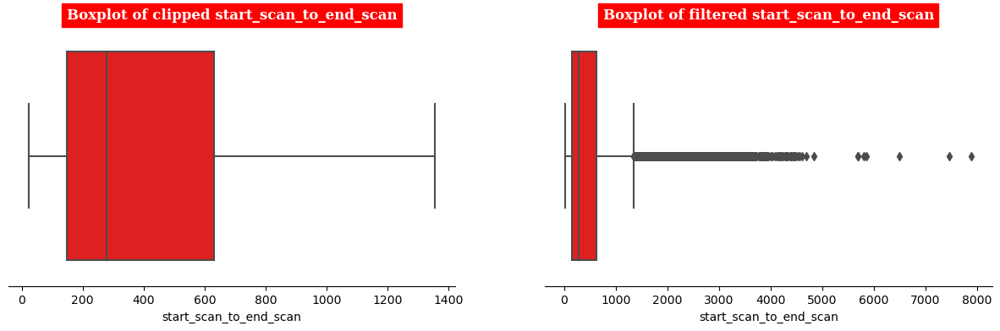

,actual_distance_to_destination
0,824.732849
1,73.186905
2,1927.404297
3,17.175274
4,127.448502
...,...
14782,57.762333
14783,15.513784
14784,38.684837
14785,134.723831


Clipped data of actual_distance_to_destination


,actual_distance_to_destination
0,374.812490
1,73.186905
2,374.812490
3,17.175274
4,127.448502
...,...
14782,57.762333
14783,15.513784
14784,38.684837
14785,134.723831



Filtered data of actual_distance_to_destination


,actual_distance_to_destination
0,824.732849
1,73.186905
2,1927.404297
3,17.175274
4,127.448502
...,...
14782,57.762333
14783,15.513784
14784,38.684837
14785,134.723831


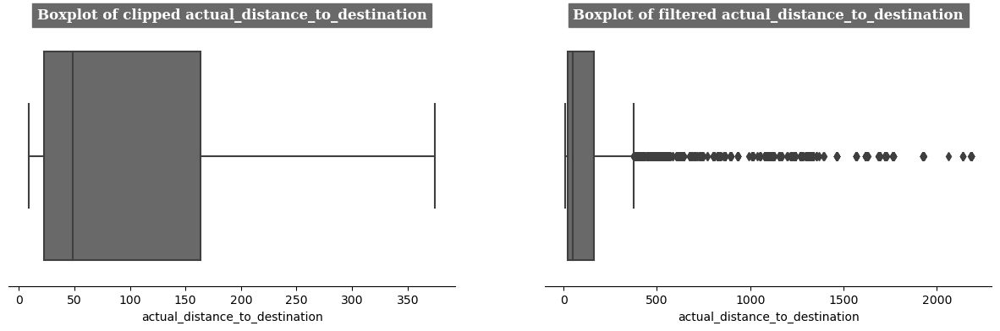

,actual_time
0,1562.0
1,143.0
2,3347.0
3,59.0
4,341.0
...,...
14782,83.0
14783,21.0
14784,282.0
14785,264.0


Clipped data of actual_time


,actual_time
0,817.0
1,143.0
2,817.0
3,59.0
4,341.0
...,...
14782,83.0
14783,21.0
14784,282.0
14785,264.0



Filtered data of actual_time


,actual_time
0,1562.0
1,143.0
2,3347.0
3,59.0
4,341.0
...,...
14782,83.0
14783,21.0
14784,282.0
14785,264.0


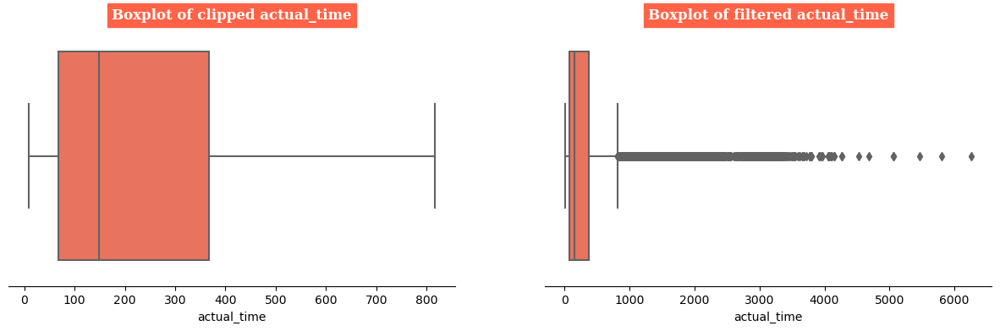

,osrm_time
0,717.0
1,68.0
2,1740.0
3,15.0
4,117.0
...,...
14782,62.0
14783,12.0
14784,48.0
14785,179.0


Clipped data of osrm_time


,osrm_time
0,376.5
1,68.0
2,376.5
3,15.0
4,117.0
...,...
14782,62.0
14783,12.0
14784,48.0
14785,179.0



Filtered data of osrm_time


,osrm_time
0,717.0
1,68.0
2,1740.0
3,15.0
4,117.0
...,...
14782,62.0
14783,12.0
14784,48.0
14785,179.0


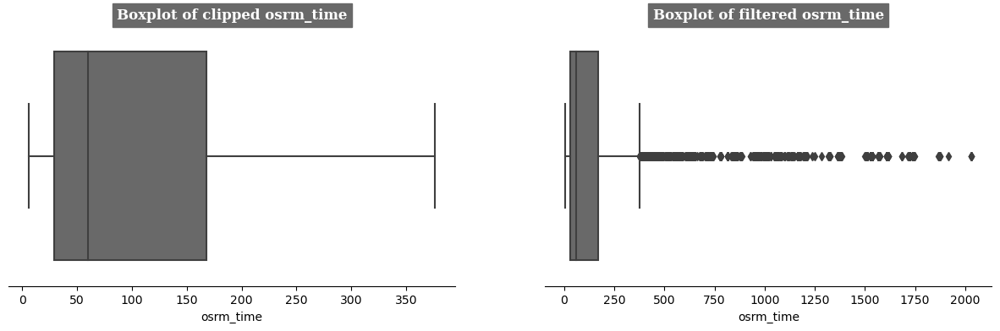

,osrm_distance
0,991.352295
1,85.111000
2,2354.066650
3,19.680000
4,146.791794
...,...
14782,73.462997
14783,16.088200
14784,58.903702
14785,171.110306


Clipped data of osrm_distance


,osrm_distance
0,470.475158
1,85.111000
2,470.475158
3,19.680000
4,146.791794
...,...
14782,73.462997
14783,16.088200
14784,58.903702
14785,171.110306



Filtered data of osrm_distance


,osrm_distance
0,991.352295
1,85.111000
2,2354.066650
3,19.680000
4,146.791794
...,...
14782,73.462997
14783,16.088200
14784,58.903702
14785,171.110306


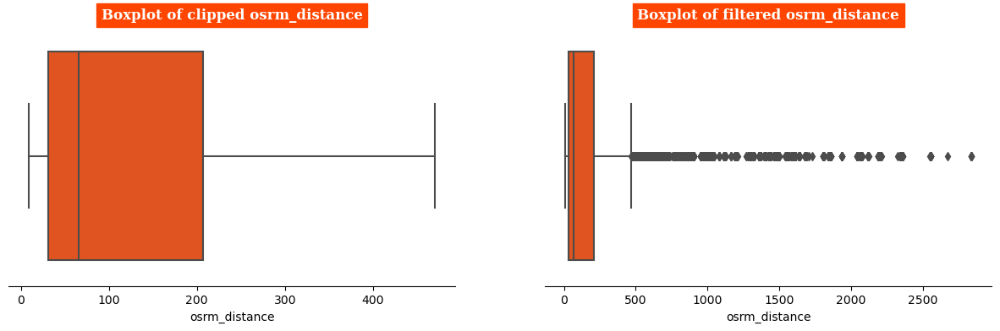

,segment_actual_time
0,1548.0
1,141.0
2,3308.0
3,59.0
4,340.0
...,...
14782,82.0
14783,21.0
14784,281.0
14785,258.0


Clipped data of segment_actual_time


,segment_actual_time
0,811.0
1,141.0
2,811.0
3,59.0
4,340.0
...,...
14782,82.0
14783,21.0
14784,281.0
14785,258.0



Filtered data of segment_actual_time


,segment_actual_time
0,1548.0
1,141.0
2,3308.0
3,59.0
4,340.0
...,...
14782,82.0
14783,21.0
14784,281.0
14785,258.0


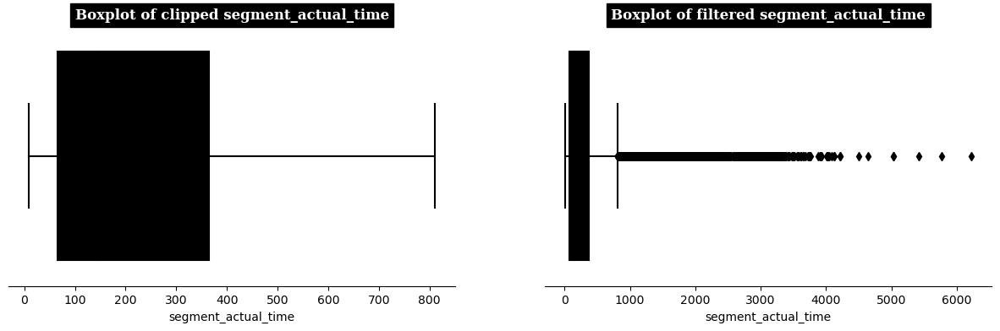

,segment_osrm_time
0,1008.0
1,65.0
2,1941.0
3,16.0
4,115.0
...,...
14782,62.0
14783,11.0
14784,88.0
14785,221.0


Clipped data of segment_osrm_time


,segment_osrm_time
0,415.0
1,65.0
2,415.0
3,16.0
4,115.0
...,...
14782,62.0
14783,11.0
14784,88.0
14785,221.0



Filtered data of segment_osrm_time


,segment_osrm_time
0,1008.0
1,65.0
2,1941.0
3,16.0
4,115.0
...,...
14782,62.0
14783,11.0
14784,88.0
14785,221.0


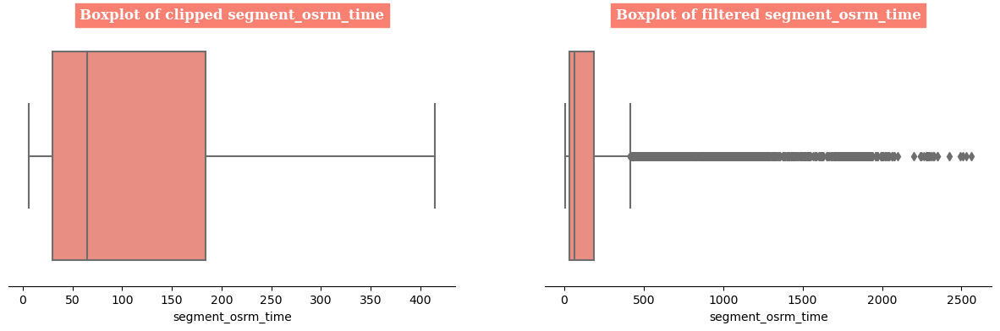

,segment_osrm_distance
0,1320.473267
1,84.189400
2,2545.267822
3,19.876600
4,146.791901
...,...
14782,64.855103
14783,16.088299
14784,104.886597
14785,223.532394


Clipped data of segment_osrm_distance


,segment_osrm_distance
0,492.533245
1,84.189400
2,492.533245
3,19.876600
4,146.791901
...,...
14782,64.855103
14783,16.088299
14784,104.886597
14785,223.532394



Filtered data of segment_osrm_distance


,segment_osrm_distance
0,1320.473267
1,84.189400
2,2545.267822
3,19.876600
4,146.791901
...,...
14782,64.855103
14783,16.088299
14784,104.886597
14785,223.532394


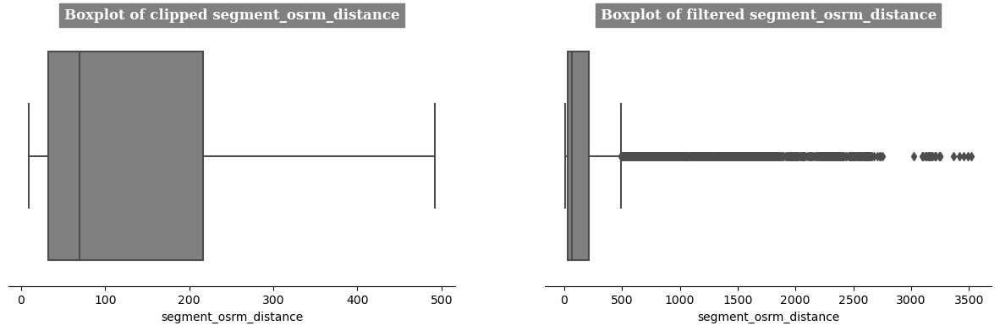

,segment_actual_time_sum
0,1548.0
1,141.0
2,3308.0
3,59.0
4,340.0
...,...
14782,82.0
14783,21.0
14784,281.0
14785,258.0


Clipped data of segment_actual_time_sum


,segment_actual_time_sum
0,811.0
1,141.0
2,811.0
3,59.0
4,340.0
...,...
14782,82.0
14783,21.0
14784,281.0
14785,258.0



Filtered data of segment_actual_time_sum


,segment_actual_time_sum
0,1548.0
1,141.0
2,3308.0
3,59.0
4,340.0
...,...
14782,82.0
14783,21.0
14784,281.0
14785,258.0


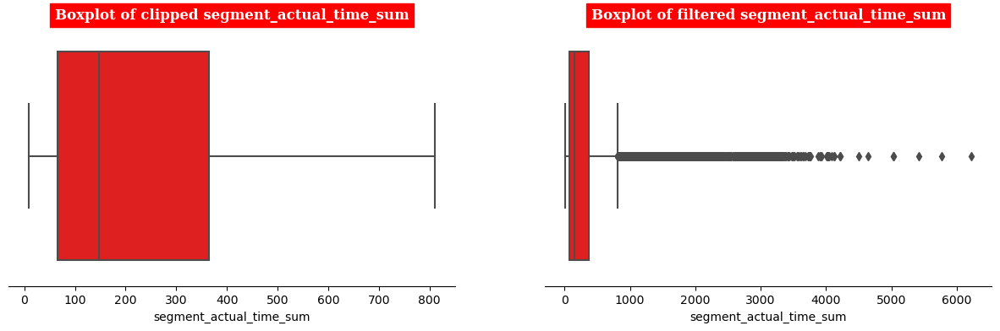

,segment_osrm_time_sum
0,1008.0
1,65.0
2,1941.0
3,16.0
4,115.0
...,...
14782,62.0
14783,11.0
14784,88.0
14785,221.0


Clipped data of segment_osrm_time_sum


,segment_osrm_time_sum
0,415.0
1,65.0
2,415.0
3,16.0
4,115.0
...,...
14782,62.0
14783,11.0
14784,88.0
14785,221.0



Filtered data of segment_osrm_time_sum


,segment_osrm_time_sum
0,1008.0
1,65.0
2,1941.0
3,16.0
4,115.0
...,...
14782,62.0
14783,11.0
14784,88.0
14785,221.0


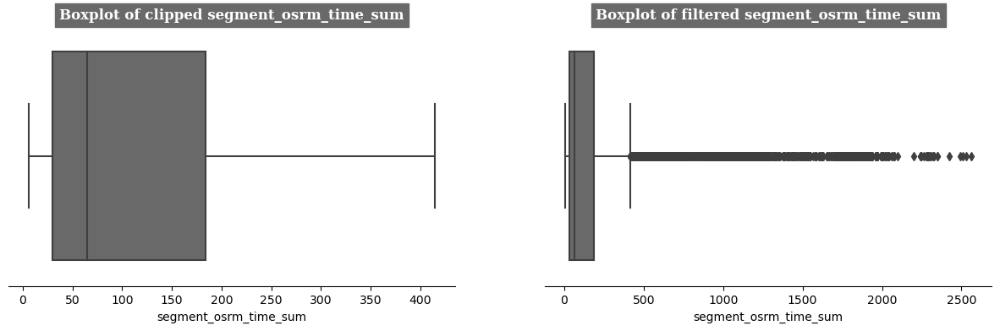

,segment_osrm_distance_sum
0,1320.473267
1,84.189400
2,2545.267822
3,19.876600
4,146.791901
...,...
14782,64.855103
14783,16.088299
14784,104.886597
14785,223.532394


Clipped data of segment_osrm_distance_sum


,segment_osrm_distance_sum
0,492.533245
1,84.189400
2,492.533245
3,19.876600
4,146.791901
...,...
14782,64.855103
14783,16.088299
14784,104.886597
14785,223.532394



Filtered data of segment_osrm_distance_sum


,segment_osrm_distance_sum
0,1320.473267
1,84.189400
2,2545.267822
3,19.876600
4,146.791901
...,...
14782,64.855103
14783,16.088299
14784,104.886597
14785,223.532394


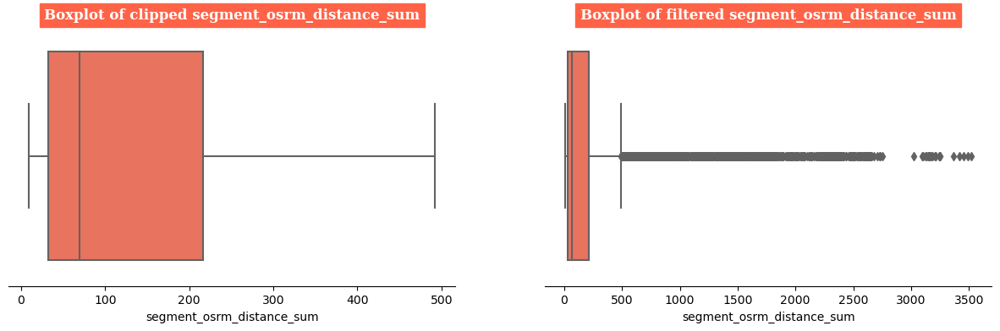

In [134]:
for i, col in enumerate(numerical_columns):
    
    data = trip_df[col]
    display(data.to_frame())
    
    
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1

    
    lower_bound = Q1 - (1.5 * IQR)
    upper_bound = Q3 + (1.5 * IQR)
    
    clipped_data = np.clip(data, lower_bound, upper_bound)
    print(f'Clipped data of {col}')
    display(clipped_data.to_frame())
    print()
    
    # Plot boxplot of the clipped data
    plt.figure(figsize=(15, 4))
    plt.subplot(121)
    sns.boxplot(x=clipped_data, color=cp[i])
    sns.despine(left=True)
    plt.yticks([])
    plt.title(f'Boxplot of clipped {col}', fontfamily='serif', fontweight='bold', fontsize=12, backgroundcolor=cp[i], color='w')
    
    filtered_data = data.loc[(data >= lower_bound) | (data <= upper_bound)]
    print(f'Filtered data of {col}')
    display(filtered_data.to_frame())
    print()
    
    plt.subplot(122)
    sns.boxplot(x=filtered_data, color=cp[i])
    sns.despine(left=True)
    plt.yticks([])
    plt.title(f'Boxplot of filtered {col}', fontfamily='serif', fontweight='bold', fontsize=12, backgroundcolor=cp[i], color='w')
      
    plt.show()

#### 🏷️Understanding:

> - Here we see that the data after removing outliers has outliers. It has to be understood that q1 and q3 dont have to be always 25th percentile and 75th percentile. ***Try changing q1 and q3 to 10th percentile to 90th percentile and plot and see...***

> - Clipped data replaces the outlier values with specified values.

> - Here, I have proceeded with both clipped and filtered data(with reduced outliers) for further analysis.


In [135]:
num_df = numerical_columns.copy()
num_df

,od_time_diff_hour,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum
0,37.668497,2259.0,824.732849,1562.0,717.0,991.352295,1548.0,1008.0,1320.473267,1548.0,1008.0,1320.473267
1,3.026865,180.0,73.186905,143.0,68.0,85.111000,141.0,65.0,84.189400,141.0,65.0,84.189400
2,65.572709,3933.0,1927.404297,3347.0,1740.0,2354.066650,3308.0,1941.0,2545.267822,3308.0,1941.0,2545.267822
3,1.674916,100.0,17.175274,59.0,15.0,19.680000,59.0,16.0,19.876600,59.0,16.0,19.876600
4,11.972484,717.0,127.448502,341.0,117.0,146.791794,340.0,115.0,146.791901,340.0,115.0,146.791901
...,...,...,...,...,...,...,...,...,...,...,...,...
14782,4.300482,257.0,57.762333,83.0,62.0,73.462997,82.0,62.0,64.855103,82.0,62.0,64.855103
14783,1.009842,60.0,15.513784,21.0,12.0,16.088200,21.0,11.0,16.088299,21.0,11.0,16.088299
14784,7.035331,421.0,38.684837,282.0,48.0,58.903702,281.0,88.0,104.886597,281.0,88.0,104.886597
14785,5.808548,347.0,134.723831,264.0,179.0,171.110306,258.0,221.0,223.532394,258.0,221.0,223.532394


In [136]:
num_cols

['od_time_diff_hour',
 'start_scan_to_end_scan',
 'actual_distance_to_destination',
 'actual_time',
 'osrm_time',
 'osrm_distance',
 'segment_actual_time',
 'segment_osrm_time',
 'segment_osrm_distance',
 'segment_actual_time_sum',
 'segment_osrm_time_sum',
 'segment_osrm_distance_sum']

In [137]:
Q1 = np.percentile(num_df[num_cols], 25)
Q3 = np.percentile(num_df[num_cols], 75)
IQR = Q3 - Q1

lower_bound = Q1 - (1.5 * IQR)
upper_bound = Q3 + (1.5 * IQR)

clipped_num_df = np.clip(num_df[num_cols], lower_bound, upper_bound)
display(clipped_num_df)

filtered_num_df = num_df[num_cols][(num_df[num_cols] >= lower_bound) | (num_df[num_cols] <= upper_bound)]
display(filtered_num_df)

,od_time_diff_hour,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum
0,37.668497,543.285302,543.285302,543.285302,543.285302,543.285302,543.285302,543.285302,543.285302,543.285302,543.285302,543.285302
1,3.026865,180.000000,73.186905,143.000000,68.000000,85.111000,141.000000,65.000000,84.189400,141.000000,65.000000,84.189400
2,65.572709,543.285302,543.285302,543.285302,543.285302,543.285302,543.285302,543.285302,543.285302,543.285302,543.285302,543.285302
3,1.674916,100.000000,17.175274,59.000000,15.000000,19.680000,59.000000,16.000000,19.876600,59.000000,16.000000,19.876600
4,11.972484,543.285302,127.448502,341.000000,117.000000,146.791794,340.000000,115.000000,146.791901,340.000000,115.000000,146.791901
...,...,...,...,...,...,...,...,...,...,...,...,...
14782,4.300482,257.000000,57.762333,83.000000,62.000000,73.462997,82.000000,62.000000,64.855103,82.000000,62.000000,64.855103
14783,1.009842,60.000000,15.513784,21.000000,12.000000,16.088200,21.000000,11.000000,16.088299,21.000000,11.000000,16.088299
14784,7.035331,421.000000,38.684837,282.000000,48.000000,58.903702,281.000000,88.000000,104.886597,281.000000,88.000000,104.886597
14785,5.808548,347.000000,134.723831,264.000000,179.000000,171.110306,258.000000,221.000000,223.532394,258.000000,221.000000,223.532394


,od_time_diff_hour,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum
0,37.668497,2259.0,824.732849,1562.0,717.0,991.352295,1548.0,1008.0,1320.473267,1548.0,1008.0,1320.473267
1,3.026865,180.0,73.186905,143.0,68.0,85.111000,141.0,65.0,84.189400,141.0,65.0,84.189400
2,65.572709,3933.0,1927.404297,3347.0,1740.0,2354.066650,3308.0,1941.0,2545.267822,3308.0,1941.0,2545.267822
3,1.674916,100.0,17.175274,59.0,15.0,19.680000,59.0,16.0,19.876600,59.0,16.0,19.876600
4,11.972484,717.0,127.448502,341.0,117.0,146.791794,340.0,115.0,146.791901,340.0,115.0,146.791901
...,...,...,...,...,...,...,...,...,...,...,...,...
14782,4.300482,257.0,57.762333,83.0,62.0,73.462997,82.0,62.0,64.855103,82.0,62.0,64.855103
14783,1.009842,60.0,15.513784,21.0,12.0,16.088200,21.0,11.0,16.088299,21.0,11.0,16.088299
14784,7.035331,421.0,38.684837,282.0,48.0,58.903702,281.0,88.0,104.886597,281.0,88.0,104.886597
14785,5.808548,347.0,134.723831,264.0,179.0,171.110306,258.0,221.0,223.532394,258.0,221.0,223.532394


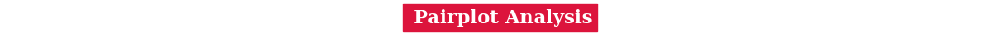

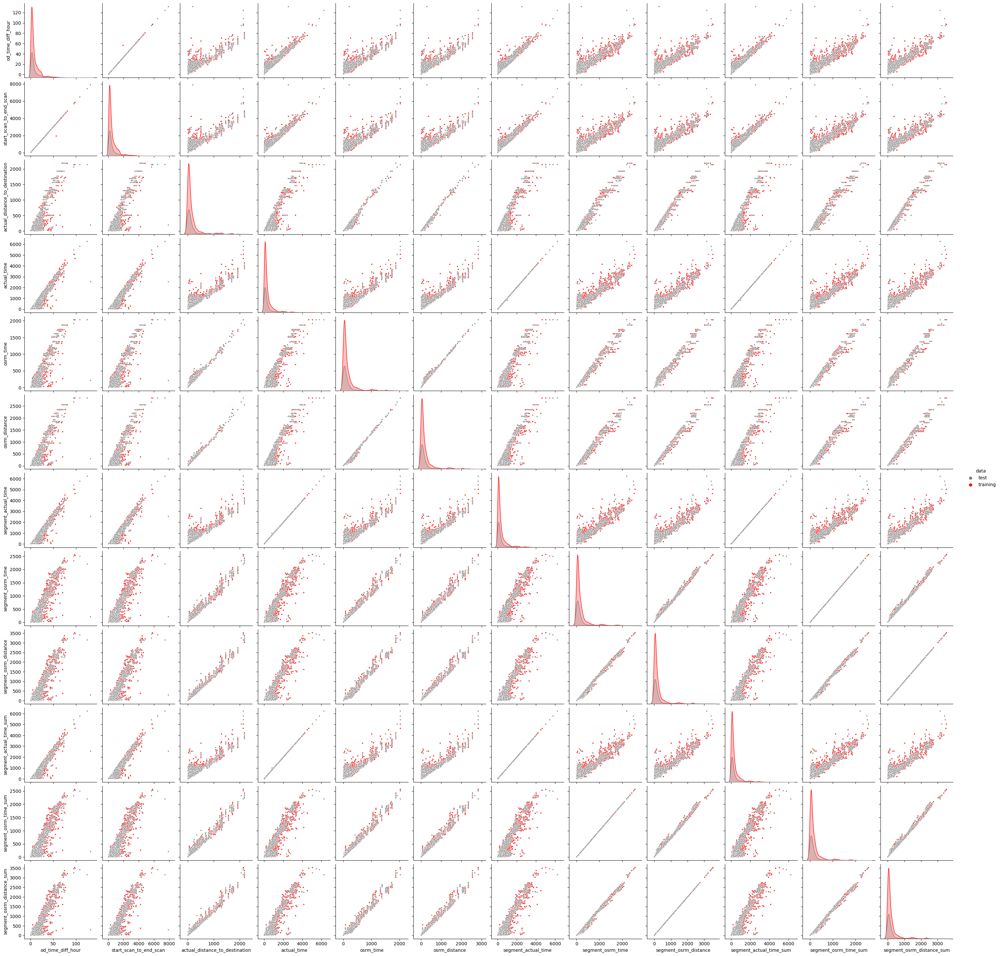

In [138]:
plt.figure(figsize=(14,0.05))
plt.axis('off')
plt.title(f' Pairplot Analysis',fontfamily='serif',fontweight='bold',fontsize=15,backgroundcolor='crimson',color='w')
sns.pairplot(data = trip_df,vars = num_cols,hue='data',markers = '.',palette=cp)
plt.show()

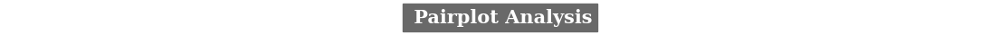

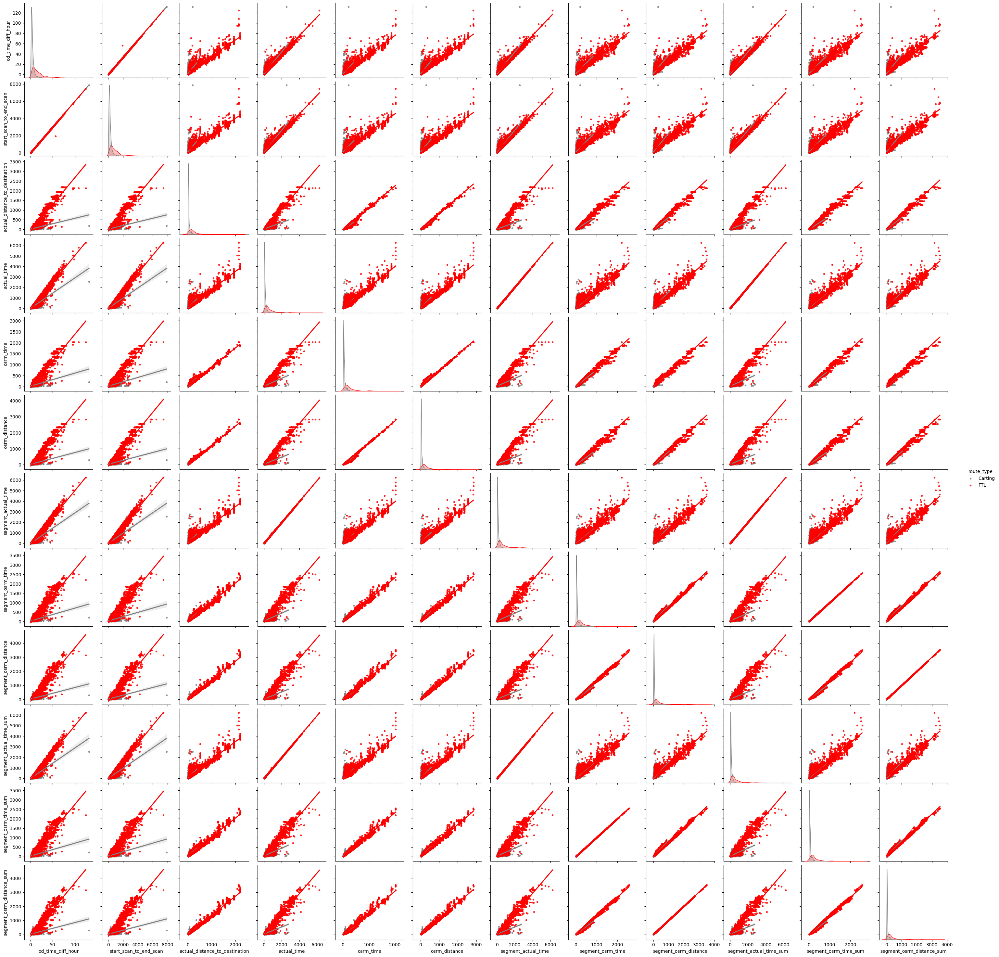

In [139]:
plt.figure(figsize=(14,0.05))
plt.axis('off')
plt.title(f' Pairplot Analysis',fontfamily='serif',fontweight='bold',fontsize=15,backgroundcolor='dimgrey',color='w')
sns.pairplot(data = trip_df,vars=num_cols,kind = 'reg',hue='route_type',markers ='.',palette=cp)
plt.show()

In [140]:
clipped_df_corr = clipped_num_df.corr()
clipped_df_corr

filtered_df_corr = filtered_num_df.corr()
filtered_df_corr

,od_time_diff_hour,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum
od_time_diff_hour,1.000000,0.999837,0.918644,0.961223,0.926973,0.924683,0.961288,0.918921,0.919665,0.961288,0.918921,0.919665
start_scan_to_end_scan,0.999837,1.000000,0.919159,0.961612,0.927471,0.925205,0.961634,0.919429,0.920191,0.961634,0.919429,0.920191
actual_distance_to_destination,0.918644,0.919159,1.000000,0.953920,0.993568,0.997268,0.952987,0.987542,0.993068,0.952987,0.987542,0.993068
actual_time,0.961223,0.961612,0.953920,1.000000,0.958781,0.959398,0.999989,0.954044,0.957151,0.999989,0.954044,0.957151
osrm_time,0.926973,0.927471,0.993568,0.958781,1.000000,0.997588,0.957955,0.993263,0.991624,0.957955,0.993263,0.991624
osrm_distance,0.924683,0.925205,0.997268,0.959398,0.997588,1.000000,0.958540,0.991802,0.994712,0.958540,0.991802,0.994712
segment_actual_time,0.961288,0.961634,0.952987,0.999989,0.957955,0.958540,1.000000,0.953214,0.956293,1.000000,0.953214,0.956293
segment_osrm_time,0.918921,0.919429,0.987542,0.954044,0.993263,0.991802,0.953214,1.000000,0.996098,0.953214,1.000000,0.996098
segment_osrm_distance,0.919665,0.920191,0.993068,0.957151,0.991624,0.994712,0.956293,0.996098,1.000000,0.956293,0.996098,1.000000
segment_actual_time_sum,0.961288,0.961634,0.952987,0.999989,0.957955,0.958540,1.000000,0.953214,0.956293,1.000000,0.953214,0.956293


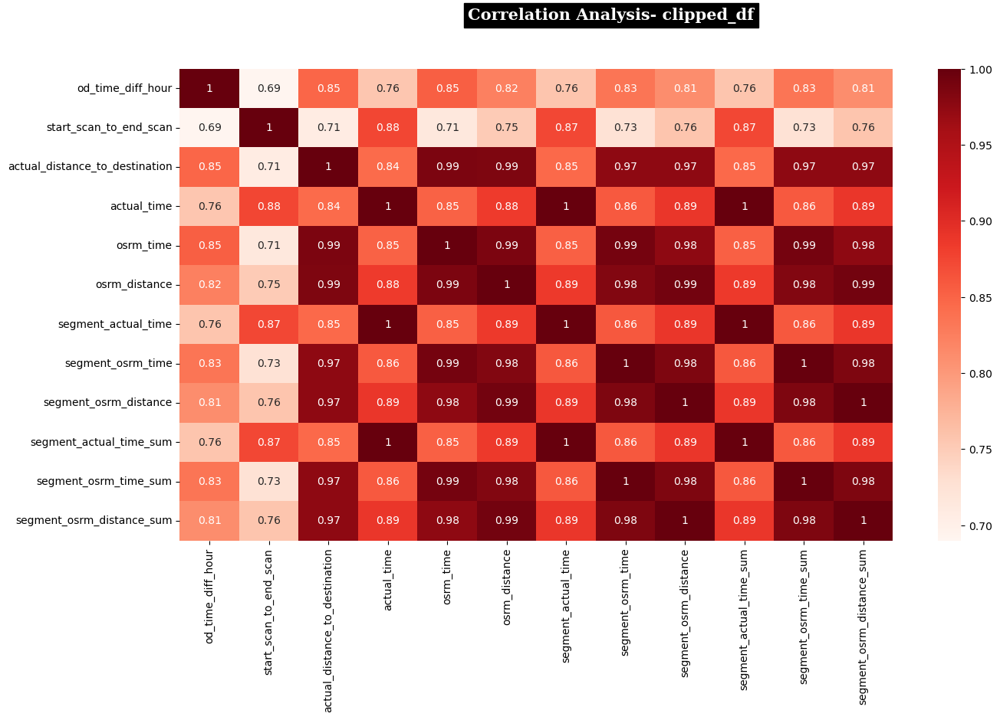

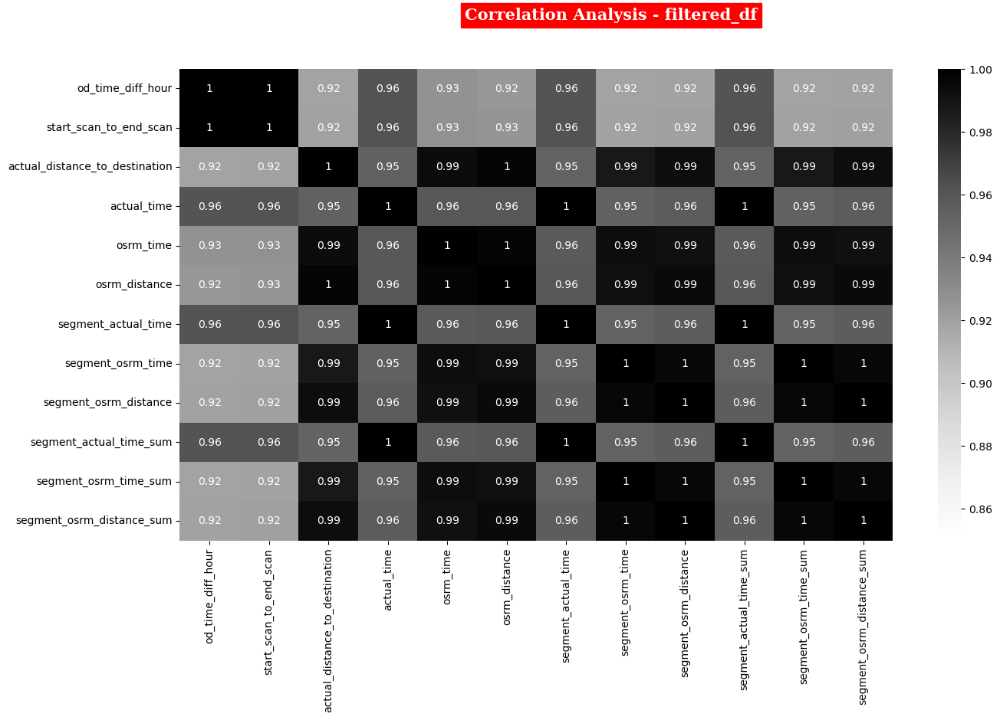

In [145]:
plt.figure(figsize = (15,8))
plt.suptitle(f'Correlation Analysis- clipped_df',fontfamily='serif',fontweight='bold',fontsize=15,backgroundcolor='k',color='w')
sns.heatmap(data = clipped_df_corr,vmin=0.69, annot = True, cmap='Reds')
plt.show()

plt.figure(figsize = (15,8))
plt.suptitle(f'Correlation Analysis - filtered_df',fontfamily='serif',fontweight='bold',fontsize=15,backgroundcolor='r',color='w')
sns.heatmap(data = filtered_df_corr,vmin=0.85, annot = True, cmap='Greys')
plt.show()

#### 🏷️Insights:

* Very High Correlation exists between all the numerical columns.

-----

In [254]:
trip_df.skew(numeric_only = True)

od_time_diff_hour                 2.893550
trip_creation_month               2.337439
trip_creation_year                0.000000
trip_creation_day                -0.695241
trip_creation_hour               -0.206092
trip_creation_weekday             0.065904
trip_creation_week                0.181308
start_scan_to_end_scan            2.895337
actual_distance_to_destination    3.562931
actual_time                       3.375178
osrm_time                         3.455256
osrm_distance                     3.553619
segment_actual_time               3.372043
segment_osrm_time                 3.602915
segment_osrm_distance             3.714016
segment_actual_time_sum           3.372043
segment_osrm_time_sum             3.602915
segment_osrm_distance_sum         3.714016
trip_creation_dayofdate          -0.695241
dtype: float64

#### 🏷️Insights:

- We can see that Many of the data is ***Right-Skewed***.

## 1️⃣🔖one-hot encoding

In [146]:
trip_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14787 entries, 0 to 14786
Data columns (total 37 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   trip_uuid                       14787 non-null  object        
 1   data                            14787 non-null  category      
 2   route_type                      14787 non-null  category      
 3   od_start_time                   14787 non-null  datetime64[ns]
 4   od_end_time                     14787 non-null  datetime64[ns]
 5   od_time_diff_hour               14787 non-null  float64       
 6   trip_creation_time              14787 non-null  datetime64[ns]
 7   trip_creation_month             14787 non-null  int32         
 8   trip_creation_year              14787 non-null  int32         
 9   trip_creation_day               14787 non-null  int32         
 10  trip_creation_hour              14787 non-null  int32         
 11  tr

In [147]:
categorical_cols = ['data','route_type']

In [149]:
# one hot encoding the categorical features
ohe = OneHotEncoder(sparse=False)
encoded_cat_cols = ohe.fit_transform(trip_df[categorical_cols])

categorical_encoded_df = pd.DataFrame(encoded_cat_cols, columns=ohe.get_feature_names_out(categorical_cols))
display(categorical_encoded_df)

encoded_df = pd.concat([trip_df,categorical_encoded_df],axis=1)
encoded_df

,data_test,data_training,route_type_Carting,route_type_FTL
0,0.0,1.0,0.0,1.0
1,0.0,1.0,1.0,0.0
2,0.0,1.0,0.0,1.0
3,0.0,1.0,1.0,0.0
4,0.0,1.0,0.0,1.0
...,...,...,...,...
14782,1.0,0.0,1.0,0.0
14783,1.0,0.0,1.0,0.0
14784,1.0,0.0,1.0,0.0
14785,1.0,0.0,1.0,0.0


,trip_uuid,data,route_type,od_start_time,od_end_time,od_time_diff_hour,trip_creation_time,trip_creation_month,trip_creation_year,trip_creation_day,trip_creation_hour,trip_creation_weekday,trip_creation_week,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,source_name,source_city,source_state,source_place,destination_name,destination_city,destination_state,destination_place,corridor,state_corridor,city_corridor,trip_creation_day_week,trip_creation_dayofdate,data_test,data_training,route_type_Carting,route_type_FTL
0,trip-153671041653548748,training,FTL,2018-09-12 16:39:46.858469,2018-09-12 16:39:46.858469,37.668497,2018-09-12 00:00:16.535741,9,2018,12,0,2,37,2259.0,824.732849,1562.0,717.0,991.352295,1548.0,1008.0,1320.473267,1548.0,1008.0,1320.473267,Kanpur_Central_H_6 (Uttar Pradesh),Kanpur,Uttar Pradesh,Central_H_6,Gurgaon_Bilaspur_HB (Haryana),Gurgaon,Haryana,Bilaspur_HB,Kanpur_Central_H_6 (Uttar Pradesh) <---> Gurga...,Uttar Pradesh--Kanpur <---> Haryana--Gurgaon,Kanpur--Central_H_6 <---> Gurgaon--Bilaspur_HB,Wednesday,12,0.0,1.0,0.0,1.0
1,trip-153671042288605164,training,Carting,2018-09-12 02:03:09.655591,2018-09-12 02:03:09.655591,3.026865,2018-09-12 00:00:22.886430,9,2018,12,0,2,37,180.0,73.186905,143.0,68.0,85.111000,141.0,65.0,84.189400,141.0,65.0,84.189400,Doddablpur_ChikaDPP_D (Karnataka),Doddablpur,Karnataka,ChikaDPP_D,Chikblapur_ShntiSgr_D (Karnataka),Chikblapur,Karnataka,ShntiSgr_D,Doddablpur_ChikaDPP_D (Karnataka) <---> Chikbl...,Karnataka--Doddablpur <---> Karnataka--Chikblapur,Doddablpur--ChikaDPP_D <---> Chikblapur--Shnti...,Wednesday,12,0.0,1.0,1.0,0.0
2,trip-153671043369099517,training,FTL,2018-09-14 03:40:17.106733,2018-09-14 03:40:17.106733,65.572709,2018-09-12 00:00:33.691250,9,2018,12,0,2,37,3933.0,1927.404297,3347.0,1740.0,2354.066650,3308.0,1941.0,2545.267822,3308.0,1941.0,2545.267822,Gurgaon_Bilaspur_HB (Haryana),Gurgaon,Haryana,Bilaspur_HB,Chandigarh_Mehmdpur_H (Punjab),Chandigarh,Punjab,Mehmdpur_H,Gurgaon_Bilaspur_HB (Haryana) <---> Chandigarh...,Haryana--Gurgaon <---> Punjab--Chandigarh,Gurgaon--Bilaspur_HB <---> Chandigarh--Mehmdpur_H,Wednesday,12,0.0,1.0,0.0,1.0
3,trip-153671046011330457,training,Carting,2018-09-12 00:01:00.113710,2018-09-12 01:41:29.809822,1.674916,2018-09-12 00:01:00.113710,9,2018,12,0,2,37,100.0,17.175274,59.0,15.0,19.680000,59.0,16.0,19.876600,59.0,16.0,19.876600,Mumbai Hub (Maharashtra),Mumbai,Maharashtra,Hub,Mumbai_MiraRd_IP (Maharashtra),Mumbai,Maharashtra,MiraRd_IP,Mumbai Hub (Maharashtra) <---> Mumbai_MiraRd_I...,Maharashtra--Mumbai <---> Maharashtra--Mumbai,Mumbai--Hub <---> Mumbai--MiraRd_IP,Wednesday,12,0.0,1.0,1.0,0.0
4,trip-153671052974046625,training,FTL,2018-09-12 00:02:09.740725,2018-09-12 03:54:43.114421,11.972484,2018-09-12 00:02:09.740725,9,2018,12,0,2,37,717.0,127.448502,341.0,117.0,146.791794,340.0,115.0,146.791901,340.0,115.0,146.791901,Bellary_Dc (Karnataka),Bellary,Karnataka,Dc,Hospet (Karnataka),Hospet,Karnataka,Hospet,Bellary_Dc (Karnataka) <---> Hospet (Karnataka),Karnataka--Bellary <---> Karnataka--Hospet,Bellary--Dc <---> Hospet--Hospet,Wednesday,12,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14782,trip-153861095625827784,test,Carting,2018-10-03 23:55:56.258533,2018-10-04 06:41:25.409035,4.300482,2018-10-03 23:55:56.258533,10,2018,3,23,2,40,257.0,57.762333,83.0,62.0,73.462997,82.0,62.0,64.855103,82.0,62.0,64.855103,Chandigarh_Mehmdpur_H (Punjab),Chandigarh,Punjab,Mehmdpur_H,Zirakpur_DC (Punjab),Zirakpur,Punjab,DC,Chandigarh_Mehmdpur_H (Punjab) <---> Zirakpur_...,Punjab--Chandigarh <---> Punjab--Zirakpur,Chandigarh--Mehmdpur_H <---> Zirakpur--DC,Wednesday,3,1.0,0.0,1.0,0.0
14783,trip-153861104386292051,test,Carting,2018-10-03 23:57:23.863155,20

## 0️⃣-1️⃣ Minmax scaler
#### 🔹Most appropriate since the data is not gaussian

In [150]:
# Normalizing/Standardizing the numerical features using MinMaxScaler
min_max_scaler = MinMaxScaler()
min_max_scaled_numerical = min_max_scaler.fit_transform(trip_df[num_cols])

# Converting the scaled features back to a dataframe
min_max_scaled_df = pd.DataFrame(min_max_scaled_numerical, columns=num_cols)
min_max_scaled_df

,od_time_diff_hour,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum
0,0.284016,0.283937,0.374613,0.248242,0.350938,0.346972,0.247388,0.391712,0.373134,0.247388,0.391712,0.373134
1,0.020082,0.019937,0.029476,0.021419,0.030602,0.026859,0.021218,0.023065,0.021373,0.021218,0.023065,0.021373
2,0.496617,0.496508,0.880999,0.533568,0.855874,0.828325,0.530301,0.756450,0.721625,0.530301,0.756450,0.721625
3,0.009782,0.009778,0.003753,0.007992,0.004442,0.003747,0.008037,0.003909,0.003074,0.008037,0.003909,0.003074
4,0.088239,0.088127,0.054395,0.053069,0.054788,0.048647,0.053207,0.042611,0.039185,0.053207,0.042611,0.039185
...,...,...,...,...,...,...,...,...,...,...,...,...
14782,0.029786,0.029714,0.022392,0.011829,0.027641,0.022745,0.011734,0.021892,0.015872,0.011734,0.021892,0.015872
14783,0.004715,0.004698,0.002990,0.001918,0.002962,0.002478,0.001929,0.001955,0.001996,0.001929,0.001955,0.001996
14784,0.050623,0.050540,0.013631,0.043638,0.020731,0.017602,0.043723,0.032056,0.027262,0.043723,0.032056,0.027262
14785,0.041276,0.041143,0.057736,0.040761,0.085390,0.057237,0.040026,0.084050,0.061020,0.040026,0.084050,0.061020


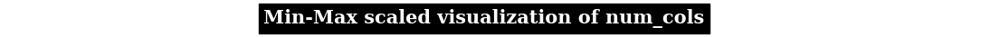

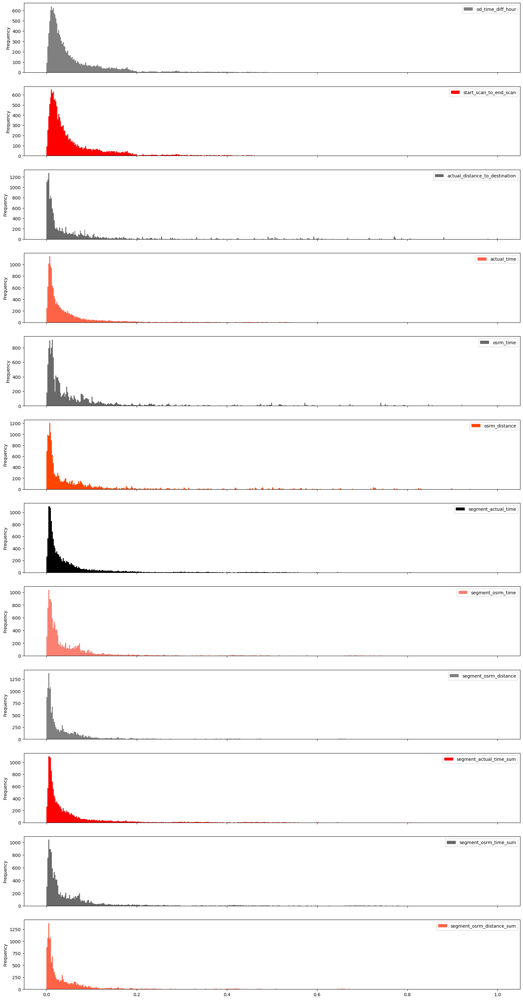

In [155]:
plt.figure(figsize=(14,0.05))
plt.axis('off')
plt.suptitle(f'Min-Max scaled visualization of num_cols',fontfamily='serif',fontweight='bold',fontsize=15,backgroundcolor='k',color='w')
min_max_scaled_df.plot(kind='hist', figsize=(20,40),subplots=True,color=cp,bins=500)
plt.show()

In [156]:
# Just so to know ... cant do this as `data is not gaussian`
# Standardization works only with data which follows normal distribution
# Standardizing the numerical features using StandardScaler
std_scaler = StandardScaler()
std_scaled = std_scaler.fit_transform(trip_df[num_cols])

# Converting the scaled features back to a dataframe
std_scaled_df = pd.DataFrame(std_scaled, columns=num_cols)
std_scaled_df

,od_time_diff_hour,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum
0,2.625886,2.627598,2.162548,2.147277,2.048290,2.125107,2.147833,2.629714,2.633597,2.147833,2.629714,2.633597
1,-0.529518,-0.530859,-0.297563,-0.379887,-0.342571,-0.320538,-0.381163,-0.367090,-0.332307,-0.381163,-0.367090,-0.332307
2,5.167598,5.170772,5.772034,5.326268,5.816936,5.802622,5.311326,5.594737,5.571936,5.311326,5.594737,5.571936
3,-0.652664,-0.652397,-0.480911,-0.529486,-0.537818,-0.497115,-0.528553,-0.522809,-0.486596,-0.528553,-0.522809,-0.486596
4,0.285312,0.284962,-0.119943,-0.027259,-0.162059,-0.154082,-0.023473,-0.208192,-0.182120,-0.023473,-0.208192,-0.182120
...,...,...,...,...,...,...,...,...,...,...,...,...
14782,-0.413508,-0.413880,-0.348054,-0.486744,-0.364674,-0.351972,-0.487212,-0.376623,-0.378690,-0.487212,-0.376623,-0.378690
14783,-0.713243,-0.713166,-0.486350,-0.597162,-0.548870,-0.506808,-0.596856,-0.538699,-0.495684,-0.596856,-0.538699,-0.495684
14784,-0.164399,-0.164728,-0.410502,-0.132335,-0.416249,-0.391263,-0.129522,-0.293997,-0.282653,-0.129522,-0.293997,-0.282653
14785,-0.276143,-0.277150,-0.096128,-0.164392,0.066344,-0.088455,-0.170863,0.128670,0.001984,-0.170863,0.128670,0.001984


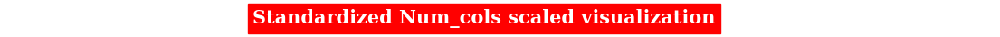

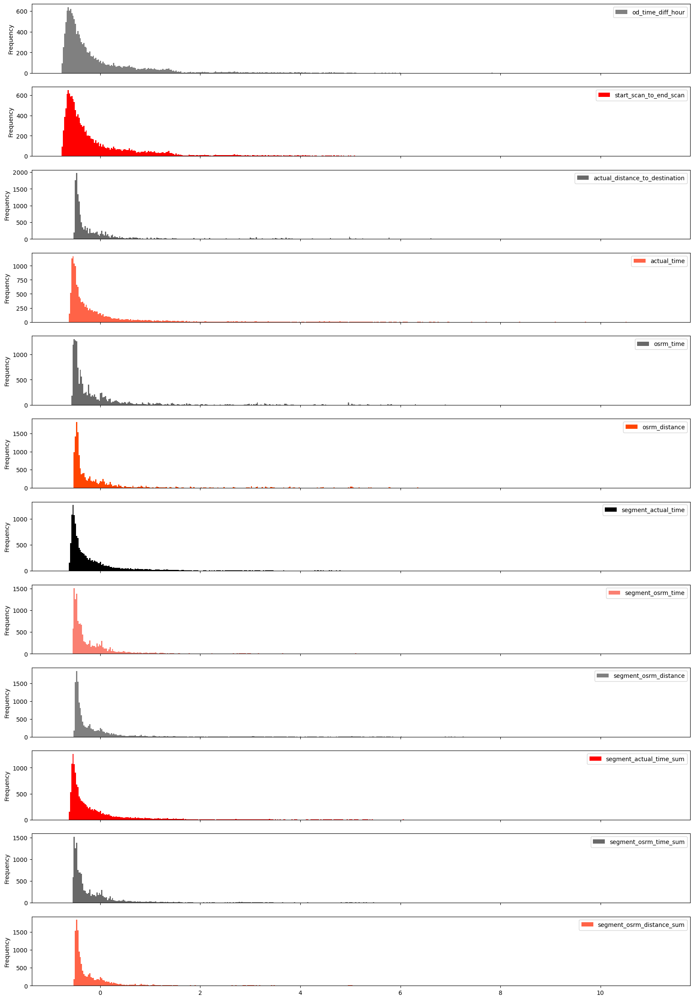

In [157]:
plt.figure(figsize=(14,0.05))
plt.axis('off')
plt.suptitle(f'Standardized Num_cols scaled visualization',fontfamily='serif',fontweight='bold',fontsize=15,backgroundcolor='r',color='w')
std_scaled_df.plot(kind='hist', figsize=(20,30),subplots=True,color=cp,bins=500)
plt.show()

----

## 🤞Hypothesis Testing:

- Perform hypothesis testing / visual analysis between :

> ⚡ actual_time aggregated value and OSRM time aggregated value.

> ⚡ actual_time aggregated value and segment actual time aggregated value.

> ⚡ OSRM distance aggregated value and segment OSRM distance aggregated value.

> ⚡ OSRM time aggregated value and segment OSRM time aggregated value.


- Note: Aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid.

#### Assumptions of T-Test

1. The sample size should be less than 30.
2. The population variance is unknown.
3. The population mean and standard deviation are finite.
4. The means of the two populations being compared should follow normal distributions.
5. If using Student's original definition of the t-test, the two populations being compared should have the same variance. If the sample sizes in the two groups being compared are equal, Student's original t-test is highly robust to the presence of unequal variances.

-------

🔖***STEP-1*** : Set up Null Hypothesis

  > **Null Hypothesis ( Ho )** - There is no significant difference in the mean values between column1 and column2  
      $H_{o}$: $μ_{col1}$ = $μ_{col2}$

  > **Alternate Hypothesis ( Ha )** - There is a significant difference in the mean values between column1 and column2  
      $H_{a}$: $μ_{col1}$ != $μ_{col2}$

----

🔖***STEP-2*** : Checking for basic assumpitons for the hypothesis


> Normality checks
* Distribution check using **QQ Plot** & **prob Plot**

* Confirmation by **Shapiro-wilks Test**

* Confirmation by **Anderson-darling Test**

* Homogeneity of Variances using **Levene's test**

----
🔖***STEP-3***: Define Test statistics; Distribution of T under Ho.

- We know that the test statistic while performing a T-Test follows T-distribution.  

> for independent variables:  
    >>If data follows normal distribution we go with **ttest_ind**  
    >> Else we will go with **Mannwhitney_u test** (Non - Parametric test)  
    
    
> for dependent variables: (paired T-test)  
    >>If data follows normal distribution we go with **ttest_rel**  
    >>Else we will go with **Wilcoxon signed rank test** (Non - Parametric test)  

----
🔖***STEP-4***: Decide the kind of test.


* We will be performing **Two tailed t-test**

-----

🔖***STEP-5***: Compute the p-value and fix value of alpha.

* we will be computing the t-stat value using the ttest function using scipy.stats.
* We set our ***alpha to be 0.05 (i.e) confidence level = 95%***

----

🔖***STEP-6***: Compare p-value and alpha.


* Based on p-value, we will accept or reject H0.

    >   **p-val < alpha** : Reject Ho
    
    >   **p-val > alpha** : Accept Ho  
    
----


In [198]:

# def shapiro_and_anderson(name,col):
    
#     print(f"Performing SHAPIRO & ANDERSON DARLING TEST for {name} column")
#     print()
#     print('Shapiro Wilks Test')
#     shapiro_stat , p_val = shapiro(col)
#     if p_val < 0.05:
#         print(f'{name} - Data is not Gaussian')
#     else:
#         print(f'{name} - Data is Gaussian')
#     print()
    
#     print("As shapiro is sensitive, we go with ANDERSON DARLING TEST")    
#     result = anderson(col)
#     if result.statistic > result.critical_values[2]:
#         print(f"{name} - Data does not follow normal distribution.")
#     else:
#         print(f"{name} - Data follows normal distribution.")
#     print()
#     print('-'*50)
    
#     def boxcox_tranformation(name,col):
    
#         print(f'Performing BOXCOX transformation on {name} column')
#         transformed_data,best_lambda = boxcox(col)
    
    #     return " "
    
    
# class NormalCheck:
#     def __init__(self, name, col):
#         self.name = name
#         self.col = col
    
#     def perform_checks(self):
#         boxcox_transformation(self.name, self.col)
#         shapiro_and_anderson(self.name, self.col)

In [207]:
class Normality_check:
    def __init__(self, name, col):
        self.name = name
        self.col = col
    
    def shapiro_and_anderson(self):
        print(f"Performing SHAPIRO & ANDERSON-DARLING TEST for {self.name} column")
        print()
        
        # Shapiro-Wilk Test
        print('Shapiro-Wilk Test')
        shapiro_stat, p_val = shapiro(self.col)
        if p_val < 0.05:
            print(f'{self.name} - Data is not Gaussian')
        else:
            print(f'{self.name} - Data is Gaussian')
        print()
        
        # Using Anderson-Darling Test
        print("Since Shapiro-Wilk test is sensitive, we go with Anderson-Darling Test")    
        result = anderson(self.col)
        if result.statistic > result.critical_values[2]:
            print(f"{self.name} - Data does not follow a normal distribution.")
        else:
            print(f"{self.name} - Data follows a normal distribution.")
        print()
        print('-'*50)
    
    def boxcox_transformation(self):
        print(f'Performing BOXCOX transformation on {self.name} column')
        transformed_data, best_lambda = boxcox(self.col)
        self.col = transformed_data  # Update column data with transformed data
        self.shapiro_and_anderson()  # Calling shapiro_and_anderson method after transformation
        
        
# normality_check = NormalCheck(name, col)
# normality_check.boxcox_transformation()

In [203]:
def levene_test(name1,name2,col1,col2):
    
    levene_stat, p_value = levene(col1,col2)

    print(f'Performing Levene Test for {name1} & {name2}')
          
    if p_value < 0.05:
        print('Does not have Homogenous (different) Variance')
    else:
        print('Have Homogenous (similar) variance') 
    print()
    print('-'*50)
    print()
    return ""

In [216]:
## MannWhitney u Rank test
### Test statistics : Mann-Whitney U rank test for two independent samples

def mannwhitneyu_test(name1,name2,col1,col2):
    
    print(f'Performing Non-parametric Test - MannWhitneyU for {name1} & {name2}')
    test_stat, p_value = mannwhitneyu(col1,col2)
    
    if p_value < 0.05:
        print("Reject Null Hypothesis")
        print(f'There is a significant difference in the Mean values of {name1} and {name2}')
    else:
        print("Failed to Reject Null Hypothesis - Accept Ho")
        print(f'There is NO significant difference in the Mean values of {name1} and {name2}')
    
    print()
    print('-'*50)
    print()
    
    return ""

In [227]:
def normality_plots(name1,name2,name3,name4,col1,col2,col3,col4):
    
    plt.figure(figsize = (20,10))
    plt.suptitle("Normality check - Histplot & QQ(prob)plot",fontsize=16,fontweight="bold",backgroundcolor=cp[5],color='w')
    
    plt.subplot(241)
    sns.histplot(col1, element = 'step', color =cp[1], kde = True, label = name1)
    plt.title(f'Histplot - {name1}',fontsize=10,fontweight="bold",backgroundcolor=cp[1],color='w')
    plt.legend()
    
    plt.subplot(242)
    sns.histplot(col3,element = 'step', color = cp[2], kde = True, label = name3 )
    plt.title(f'Histplot - {name3}',fontsize=10,fontweight="bold",backgroundcolor=cp[2],color='w')
    plt.legend()

    plt.subplot(243)
    probplot(col1, plot = plt, dist = 'norm')
    plt.title(f'Probplot - {name1}',fontsize=10,fontweight="bold",backgroundcolor=cp[1],color='w')

    plt.subplot(244)
    probplot(col3, plot = plt, dist = 'norm')
    plt.title(f'Probplot - {name3}',fontsize=10,fontweight="bold",backgroundcolor=cp[2],color='w')
    
    plt.subplot(245)
    sns.histplot(col2, element = 'step', color =cp[1], kde = True, label = name2 )
    plt.title(f'Histplot - {name2}',fontsize=10,fontweight="bold",backgroundcolor=cp[1],color='w')
    plt.legend()

    plt.subplot(246)
    sns.histplot(col4,element = 'step', color = cp[2], kde = True, label = name4)
    plt.title(f'Histplot - {name4}',fontsize=10,fontweight="bold",backgroundcolor=cp[2],color='w')
    plt.legend()

    plt.subplot(247)
    probplot(col2, plot = plt, dist = 'norm')
    plt.title(f'Probplot - {name2}',fontsize=10,fontweight="bold",backgroundcolor=cp[1],color='w')

    plt.subplot(248)
    probplot(col4, plot = plt, dist = 'norm')
    plt.title(f'Probplot - {name4}',fontsize=10,fontweight="bold",backgroundcolor=cp[2],color='w')

    sns.despine()
    plt.show()

### ⚡ Hypothesis testing - actual_time aggregated value and OSRM time aggregated value.

In [158]:
clipped_num_df.sample(3)

,od_time_diff_hour,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum
4578,10.118006,543.285302,220.068207,353.0,221.0,249.271805,351.0,238.0,272.674194,351.0,238.0,272.674194
176,1.358135,81.000000,9.083277,28.0,11.0,14.245600,28.0,11.0,14.245600,28.0,11.0,14.245600
505,6.646569,398.000000,101.146736,259.0,98.0,130.815598,257.0,115.0,130.997910,257.0,115.0,130.997910


In [219]:
clipped_num_df[['actual_time','osrm_time']].describe().T

,count,mean,std,min,25%,50%,75%,max
actual_time,14787.0,224.212577,185.922840,9.0,67.0,148.0,367.0,543.285302
osrm_time,14787.0,128.190912,150.301267,6.0,29.0,60.0,168.0,543.285302


In [167]:
filtered_num_df[['actual_time','osrm_time']].describe().T

,count,mean,std,min,25%,50%,75%,max
actual_time,14787.0,356.306000,561.517761,9.0,67.0,148.0,367.0,6265.0
osrm_time,14787.0,160.990936,271.459229,6.0,29.0,60.0,168.0,2032.0


In [169]:
actual_time = clipped_num_df['actual_time']
osrm_time = clipped_num_df['osrm_time']
fil_actual_time = filtered_num_df['actual_time']
fil_osrm_time = filtered_num_df['osrm_time']

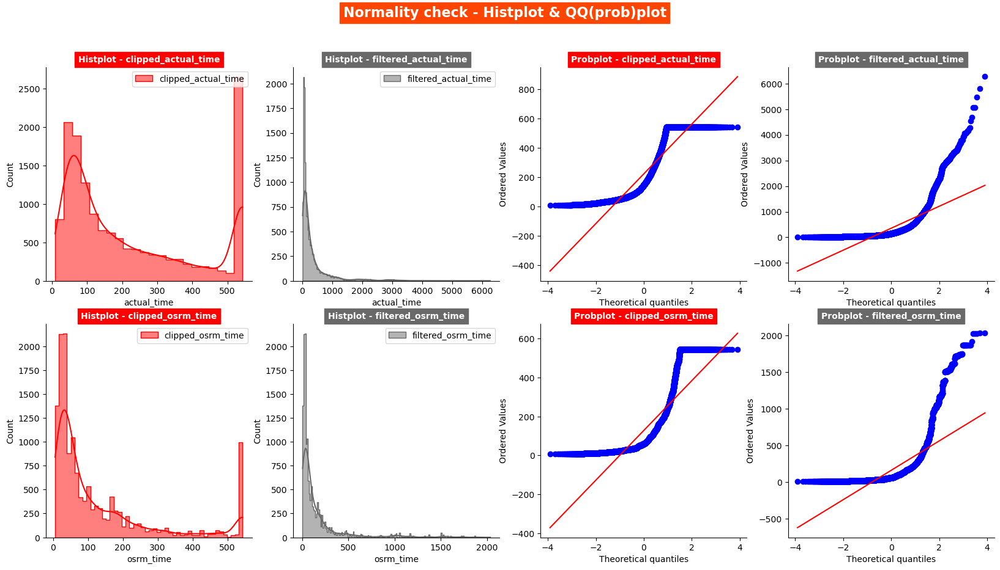

In [228]:
normality_plots('clipped_actual_time','clipped_osrm_time','filtered_actual_time','filtered_osrm_time',actual_time,osrm_time,fil_actual_time,fil_osrm_time)

In [213]:
col_names= ['clipped_actual_time','clipped_osrm_time','filtered_actual_time','filtered_osrm_time']
cols = [actual_time,osrm_time,fil_actual_time,fil_osrm_time]

for _ in zip(col_names,cols):
    normality = Normality_check(_[0],_[1])
    normality.shapiro_and_anderson()
    normality.boxcox_transformation()

Performing SHAPIRO & ANDERSON-DARLING TEST for clipped_actual_time column

Shapiro-Wilk Test
clipped_actual_time - Data is not Gaussian

Since Shapiro-Wilk test is sensitive, we go with Anderson-Darling Test
clipped_actual_time - Data does not follow a normal distribution.

--------------------------------------------------
Performing BOXCOX transformation on clipped_actual_time column
Performing SHAPIRO & ANDERSON-DARLING TEST for clipped_actual_time column

Shapiro-Wilk Test
clipped_actual_time - Data is not Gaussian

Since Shapiro-Wilk test is sensitive, we go with Anderson-Darling Test
clipped_actual_time - Data does not follow a normal distribution.

--------------------------------------------------
Performing SHAPIRO & ANDERSON-DARLING TEST for clipped_osrm_time column

Shapiro-Wilk Test
clipped_osrm_time - Data is not Gaussian

Since Shapiro-Wilk test is sensitive, we go with Anderson-Darling Test
clipped_osrm_time - Data does not follow a normal distribution.

----------------

In [204]:
levene_test('clipped_actual_time','clipped_osrm_time',actual_time,osrm_time),
levene_test('filtered_actual_time','filtered_osrm_time',fil_actual_time,fil_osrm_time)

Performing Levene Test for clipped_actual_time & clipped_osrm_time
Does not have Homogenous (different) Variance

--------------------------------------------------

Performing Levene Test for filtered_actual_time & filtered_osrm_time
Does not have Homogenous (different) Variance

--------------------------------------------------



''

## Wilcoxon signed rank test:

In [214]:
## with clipped data

# H0 : aggregated actual time is same as aggregated osrm time
# Ha : aggregated actual time is more than the aggregated osrm time

alpha = 0.05  #testing at 95% confidence

test_stat , p_value = wilcoxon(actual_time,osrm_time,alternative='greater')

if p_value < alpha:
    print("Reject Null Hypothesis - The Aggregated Actual_time is More than the Aggregated OSRM_time")
else:
    print("Fail to Reject Null Hypothesis - The Aggregated Actual_time is same as the Aggregated OSRM_time")

Reject Null Hypothesis - The Aggregated Actual_time is More than the Aggregated OSRM_time


In [215]:
## with filtered data

alpha = 0.05  #testing at 95% confidence

test_stat , p_value = wilcoxon(fil_actual_time,fil_osrm_time,alternative='greater')

if p_value < alpha:
    print("Reject Null Hypothesis - The Aggregated Actual_time is More than the Aggregated OSRM_time")
else:
    print("Fail to Reject Null Hypothesis - The Aggregated Actual_time is same as the Aggregated OSRM_time")

Reject Null Hypothesis - The Aggregated Actual_time is More than the Aggregated OSRM_time


In [218]:
### MannWhitney u Rank test

test_cols = [('clipped_actual_time','clipped_osrm_time',actual_time,osrm_time),
       ('filtered_actual_time','filtered_osrm_time',fil_actual_time,fil_osrm_time)]

for _ in test_cols:
    mannwhitneyu_test(_[0],_[1],_[2],_[3])

Performing Non-parametric Test - MannWhitneyU for clipped_actual_time & clipped_osrm_time
Reject Null Hypothesis
There is a significant difference in the Mean values of clipped_actual_time and clipped_osrm_time

--------------------------------------------------

Performing Non-parametric Test - MannWhitneyU for filtered_actual_time & filtered_osrm_time
Reject Null Hypothesis
There is a significant difference in the Mean values of filtered_actual_time and filtered_osrm_time

--------------------------------------------------



#### 🏷️Insights:

> It is confirmed that `There is a significant difference in the Mean values of Aggregated actual_time and Aggregated osrm_time` through ***MannwhitneyU*** test.

>>> * $H_{o}$: $μ_{Aggregated-actual-time}$ != $μ_{Aggregated-osrm-time}$

> Further, it is found that `The Aggregated Actual_time is More than the Aggregated OSRM_time` through ***Wilcoxon signed Rank*** test.

> > > * $H_{o}$: $μ_{Aggregated-actual-time}$ > $μ_{Aggregated-osrm-time}$

-----

## ⚡ Actual_time aggregated value and Segment actual time aggregated value.

In [220]:
clipped_num_df.sample()

,od_time_diff_hour,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum
11839,4.644768,278.0,46.165558,104.0,63.0,75.968498,101.0,61.0,62.8657,101.0,61.0,62.8657


In [221]:
clipped_num_df[['actual_time','segment_actual_time']].describe().T

,count,mean,std,min,25%,50%,75%,max
actual_time,14787.0,224.212577,185.922840,9.0,67.0,148.0,367.0,543.285302
segment_actual_time,14787.0,222.904643,185.797003,9.0,66.0,147.0,364.0,543.285302


In [222]:
filtered_num_df[['actual_time','segment_actual_time']].describe().T

,count,mean,std,min,25%,50%,75%,max
actual_time,14787.0,356.306000,561.517761,9.0,67.0,148.0,367.0,6265.0
segment_actual_time,14787.0,353.059174,556.364441,9.0,66.0,147.0,364.0,6230.0


In [223]:
clipped_actual_time = clipped_num_df['actual_time']
clipped_segmented_actual_time = clipped_num_df['segment_actual_time']
filtered_actual_time = filtered_num_df['actual_time']
filtered_segmented_actual_time = filtered_num_df['segment_actual_time']

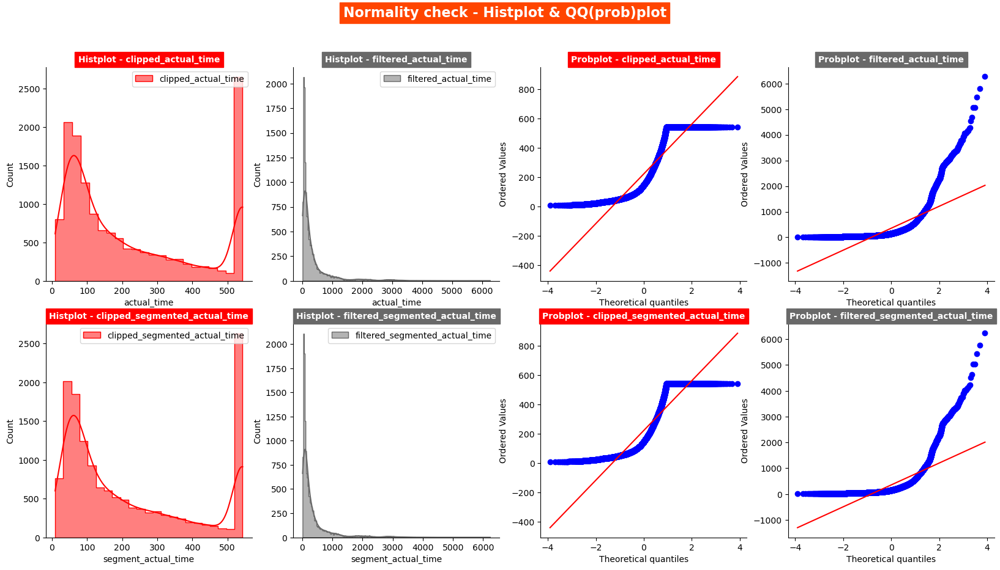

In [229]:
normality_plots("clipped_actual_time","clipped_segmented_actual_time","filtered_actual_time","filtered_segmented_actual_time",
                clipped_actual_time,clipped_segmented_actual_time,filtered_actual_time,filtered_segmented_actual_time)

In [230]:
col_names= ["clipped_actual_time","clipped_segmented_actual_time","filtered_actual_time","filtered_segmented_actual_time"]
cols = [clipped_actual_time,clipped_segmented_actual_time,filtered_actual_time,filtered_segmented_actual_time]

for _ in zip(col_names,cols):
    normality = Normality_check(_[0],_[1])
    normality.shapiro_and_anderson()
    normality.boxcox_transformation()

Performing SHAPIRO & ANDERSON-DARLING TEST for clipped_actual_time column

Shapiro-Wilk Test
clipped_actual_time - Data is not Gaussian

Since Shapiro-Wilk test is sensitive, we go with Anderson-Darling Test
clipped_actual_time - Data does not follow a normal distribution.

--------------------------------------------------
Performing BOXCOX transformation on clipped_actual_time column
Performing SHAPIRO & ANDERSON-DARLING TEST for clipped_actual_time column

Shapiro-Wilk Test
clipped_actual_time - Data is not Gaussian

Since Shapiro-Wilk test is sensitive, we go with Anderson-Darling Test
clipped_actual_time - Data does not follow a normal distribution.

--------------------------------------------------
Performing SHAPIRO & ANDERSON-DARLING TEST for clipped_segmented_actual_time column

Shapiro-Wilk Test
clipped_segmented_actual_time - Data is not Gaussian

Since Shapiro-Wilk test is sensitive, we go with Anderson-Darling Test
clipped_segmented_actual_time - Data does not follow a no

In [232]:
levene_test("clipped_actual_time","clipped_segmented_actual_time",clipped_actual_time,clipped_segmented_actual_time),
levene_test("filtered_actual_time","filtered_segmented_actual_time",filtered_actual_time,filtered_segmented_actual_time)

Performing Levene Test for clipped_actual_time & clipped_segmented_actual_time
Have Homogenous (similar) variance

--------------------------------------------------

Performing Levene Test for filtered_actual_time & filtered_segmented_actual_time
Have Homogenous (similar) variance

--------------------------------------------------



''

In [231]:
### MannWhitney u Rank test

test_cols = [("clipped_actual_time","clipped_segmented_actual_time",clipped_actual_time,clipped_segmented_actual_time),
       ("filtered_actual_time","filtered_segmented_actual_time",filtered_actual_time,filtered_segmented_actual_time)]

for _ in test_cols:
    mannwhitneyu_test(_[0],_[1],_[2],_[3])

Performing Non-parametric Test - MannWhitneyU for clipped_actual_time & clipped_segmented_actual_time
Failed to Reject Null Hypothesis - Accept Ho
There is NO significant difference in the Mean values of clipped_actual_time and clipped_segmented_actual_time

--------------------------------------------------

Performing Non-parametric Test - MannWhitneyU for filtered_actual_time & filtered_segmented_actual_time
Failed to Reject Null Hypothesis - Accept Ho
There is NO significant difference in the Mean values of filtered_actual_time and filtered_segmented_actual_time

--------------------------------------------------



#### 🏷️Insights:

> Even thought data is not gaussian , though it has similar variance (confirmed by ***Levene's*** test)

> It is confirmed that `There is NO significant difference in the Mean values of Aggregated actual_time and segmented_actual_time` through ***MannWHitneyU*** test.

> > > * $H_{o}$: $μ_{Aggregated-actual-time}$ = $μ_{Segmented-actual-time}$


### ⚡ OSRM distance aggregated value and segment OSRM distance aggregated value.

In [245]:
filtered_num_df.sample()

,od_time_diff_hour,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum
3944,5.694592,341.0,88.352287,156.0,71.0,101.823898,155.0,70.0,101.823898,155.0,70.0,101.823898


In [246]:
clipped_num_df[['osrm_distance','segment_osrm_distance']].describe().T

,count,mean,std,min,25%,50%,75%,max
osrm_distance,14787.0,144.551531,162.880435,9.0729,30.75690,65.302795,206.644203,543.285302
segment_osrm_distance,14787.0,150.959153,165.473080,9.0729,32.57885,69.784203,216.560608,543.285302


In [247]:
filtered_num_df[['osrm_distance','segment_osrm_distance']].describe().T

,count,mean,std,min,25%,50%,75%,max
osrm_distance,14787.0,203.887405,370.565460,9.0729,30.75690,65.302795,206.644203,2840.081055
segment_osrm_distance,14787.0,222.705444,416.845642,9.0729,32.57885,69.784203,216.560608,3523.632324


In [248]:
clipped_osrm_distance = clipped_num_df['osrm_distance']
clipped_segmented_osrm_distance = clipped_num_df['segment_osrm_distance']
filtered_osrm_distance = filtered_num_df['osrm_distance']
filtered_segmented_osrm_distance = filtered_num_df['segment_osrm_distance']

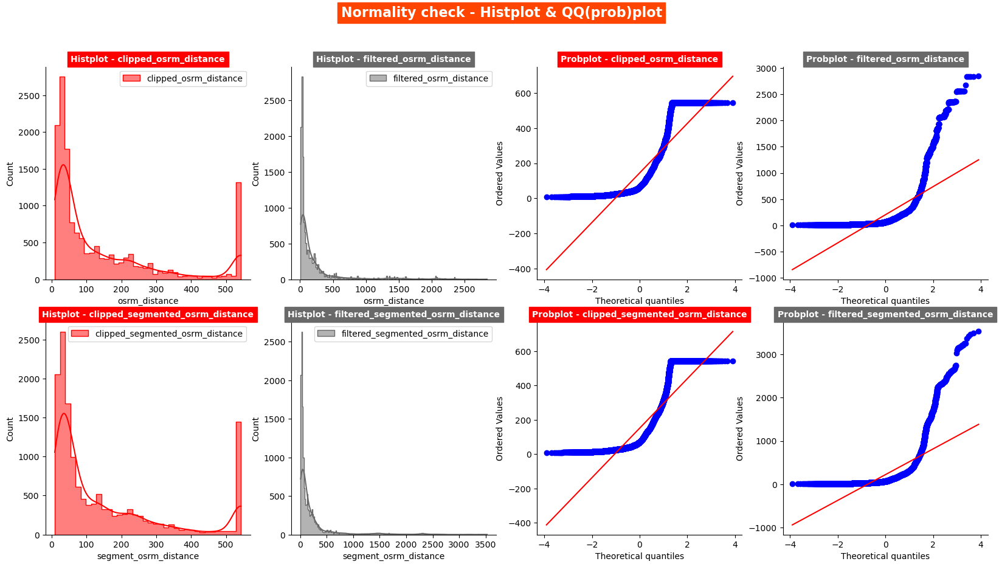

In [249]:
normality_plots("clipped_osrm_distance","clipped_segmented_osrm_distance","filtered_osrm_distance","filtered_segmented_osrm_distance",
                clipped_osrm_distance,clipped_segmented_osrm_distance,filtered_osrm_distance,filtered_segmented_osrm_distance)

In [250]:
col_names= ["clipped_osrm_distance","clipped_segmented_osrm_distance","filtered_osrm_distance","filtered_segmented_osrm_distance"]
cols = [clipped_osrm_distance,clipped_segmented_osrm_distance,filtered_osrm_distance,filtered_segmented_osrm_distance]

for _ in zip(col_names,cols):
    normality = Normality_check(_[0],_[1])
    normality.shapiro_and_anderson()
    normality.boxcox_transformation()

Performing SHAPIRO & ANDERSON-DARLING TEST for clipped_osrm_distance column

Shapiro-Wilk Test
clipped_osrm_distance - Data is not Gaussian

Since Shapiro-Wilk test is sensitive, we go with Anderson-Darling Test
clipped_osrm_distance - Data does not follow a normal distribution.

--------------------------------------------------
Performing BOXCOX transformation on clipped_osrm_distance column
Performing SHAPIRO & ANDERSON-DARLING TEST for clipped_osrm_distance column

Shapiro-Wilk Test
clipped_osrm_distance - Data is not Gaussian

Since Shapiro-Wilk test is sensitive, we go with Anderson-Darling Test
clipped_osrm_distance - Data does not follow a normal distribution.

--------------------------------------------------
Performing SHAPIRO & ANDERSON-DARLING TEST for clipped_segmented_osrm_distance column

Shapiro-Wilk Test
clipped_segmented_osrm_distance - Data is not Gaussian

Since Shapiro-Wilk test is sensitive, we go with Anderson-Darling Test
clipped_segmented_osrm_distance - Data 

In [251]:
levene_test("clipped_osrm_distance","clipped_segmented_osrm_distance",clipped_osrm_distance,clipped_segmented_osrm_distance),
levene_test("filtered_osrm_distance","filtered_segmented_osrm_distance",filtered_osrm_distance,filtered_segmented_osrm_distance)

Performing Levene Test for clipped_osrm_distance & clipped_segmented_osrm_distance
Does not have Homogenous (different) Variance

--------------------------------------------------

Performing Levene Test for filtered_osrm_distance & filtered_segmented_osrm_distance
Does not have Homogenous (different) Variance

--------------------------------------------------



''

In [252]:
### MannWhitney u Rank test

test_cols = [("clipped_osrm_distance","clipped_segmented_osrm_distance",clipped_osrm_distance,clipped_segmented_osrm_distance),
       ("filtered_osrm_distance","filtered_segmented_osrm_distance",filtered_osrm_distance,filtered_segmented_osrm_distance)]

for _ in test_cols:
    mannwhitneyu_test(_[0],_[1],_[2],_[3])

Performing Non-parametric Test - MannWhitneyU for clipped_osrm_distance & clipped_segmented_osrm_distance
Reject Null Hypothesis
There is a significant difference in the Mean values of clipped_osrm_distance and clipped_segmented_osrm_distance

--------------------------------------------------

Performing Non-parametric Test - MannWhitneyU for filtered_osrm_distance & filtered_segmented_osrm_distance
Reject Null Hypothesis
There is a significant difference in the Mean values of filtered_osrm_distance and filtered_segmented_osrm_distance

--------------------------------------------------



#### 🏷️Insights:

> It is confirmed that `There is a significant difference in the Mean values of osrm_distance and segmented_osrm_distance aggregated` through ***MannwhitneyU*** test.

> > > * $H_{o}$: $μ_{Aggregated-osrm-distance}$ != $μ_{Segmented-osrm-distance-aggregated}$

------------

### ⚡ OSRM time aggregated value and segment OSRM time aggregated value.

In [233]:
filtered_num_df.sample()

,od_time_diff_hour,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum
113,3.763914,225.0,45.959438,140.0,57.0,54.921398,138.0,66.0,64.504799,138.0,66.0,64.504799


In [234]:
clipped_num_df[['osrm_time','segment_osrm_time']].describe().T

,count,mean,std,min,25%,50%,75%,max
osrm_time,14787.0,128.190912,150.301267,6.0,29.0,60.0,168.0,543.285302
segment_osrm_time,14787.0,136.843818,155.422255,6.0,30.0,65.0,184.0,543.285302


In [235]:
filtered_num_df[['osrm_time','segment_osrm_time']].describe().T

,count,mean,std,min,25%,50%,75%,max
osrm_time,14787.0,160.990936,271.459229,6.0,29.0,60.0,168.0,2032.0
segment_osrm_time,14787.0,180.511597,314.678741,6.0,30.0,65.0,184.0,2564.0


In [240]:
clipped_osrm_time = clipped_num_df['osrm_time']
clipped_segmented_osrm_time = clipped_num_df['segment_osrm_time']
filtered_osrm_time = filtered_num_df['osrm_time']
filtered_segmented_osrm_time = filtered_num_df['segment_osrm_time']

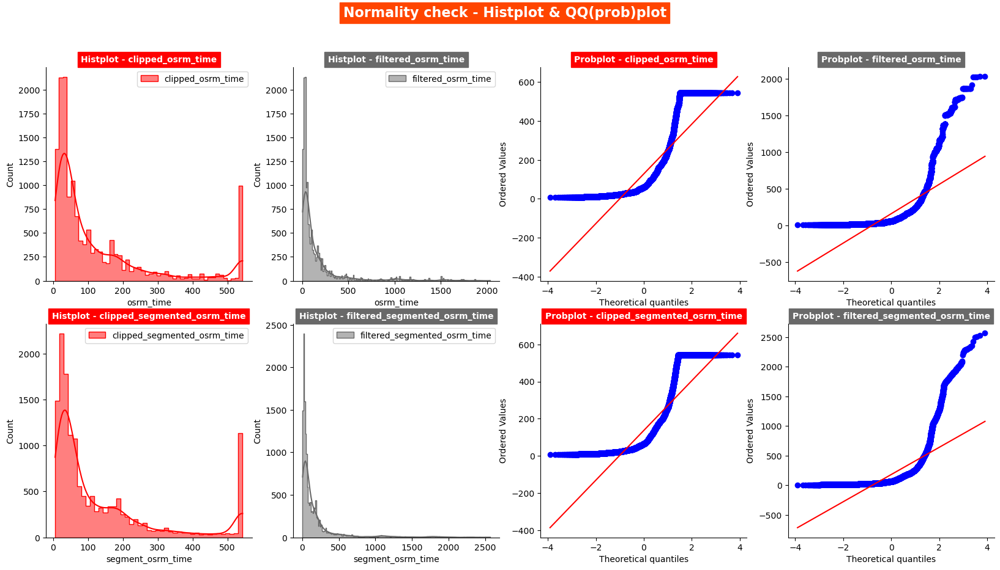

In [241]:
normality_plots("clipped_osrm_time","clipped_segmented_osrm_time","filtered_osrm_time","filtered_segmented_osrm_time",
                clipped_osrm_time,clipped_segmented_osrm_time,filtered_osrm_time,filtered_segmented_osrm_time)

In [242]:
col_names= ["clipped_osrm_time","clipped_segmented_osrm_time","filtered_osrm_time","filtered_segmented_osrm_time"]
cols = [clipped_osrm_time,clipped_segmented_osrm_time,filtered_osrm_time,filtered_segmented_osrm_time]

for _ in zip(col_names,cols):
    normality = Normality_check(_[0],_[1])
    normality.shapiro_and_anderson()
    normality.boxcox_transformation()

Performing SHAPIRO & ANDERSON-DARLING TEST for clipped_osrm_time column

Shapiro-Wilk Test
clipped_osrm_time - Data is not Gaussian

Since Shapiro-Wilk test is sensitive, we go with Anderson-Darling Test
clipped_osrm_time - Data does not follow a normal distribution.

--------------------------------------------------
Performing BOXCOX transformation on clipped_osrm_time column
Performing SHAPIRO & ANDERSON-DARLING TEST for clipped_osrm_time column

Shapiro-Wilk Test
clipped_osrm_time - Data is not Gaussian

Since Shapiro-Wilk test is sensitive, we go with Anderson-Darling Test
clipped_osrm_time - Data does not follow a normal distribution.

--------------------------------------------------
Performing SHAPIRO & ANDERSON-DARLING TEST for clipped_segmented_osrm_time column

Shapiro-Wilk Test
clipped_segmented_osrm_time - Data is not Gaussian

Since Shapiro-Wilk test is sensitive, we go with Anderson-Darling Test
clipped_segmented_osrm_time - Data does not follow a normal distribution.



In [243]:
levene_test("clipped_osrm_time","clipped_segmented_osrm_time",clipped_osrm_time,clipped_segmented_osrm_time),
levene_test("filtered_osrm_time","filtered_segmented_osrm_time",filtered_osrm_time,filtered_segmented_osrm_time)

Performing Levene Test for clipped_osrm_time & clipped_segmented_osrm_time
Does not have Homogenous (different) Variance

--------------------------------------------------

Performing Levene Test for filtered_osrm_time & filtered_segmented_osrm_time
Does not have Homogenous (different) Variance

--------------------------------------------------



''

In [244]:
### MannWhitney u Rank test

test_cols = [("clipped_osrm_time","clipped_segmented_osrm_time",clipped_osrm_time,clipped_segmented_osrm_time),
       ("filtered_osrm_time","filtered_segmented_osrm_time",filtered_osrm_time,filtered_segmented_osrm_time)]

for _ in test_cols:
    mannwhitneyu_test(_[0],_[1],_[2],_[3])

Performing Non-parametric Test - MannWhitneyU for clipped_osrm_time & clipped_segmented_osrm_time
Reject Null Hypothesis
There is a significant difference in the Mean values of clipped_osrm_time and clipped_segmented_osrm_time

--------------------------------------------------

Performing Non-parametric Test - MannWhitneyU for filtered_osrm_time & filtered_segmented_osrm_time
Reject Null Hypothesis
There is a significant difference in the Mean values of filtered_osrm_time and filtered_segmented_osrm_time

--------------------------------------------------



#### 🏷️Insights:

> It is confirmed that `There is a significant difference in the Mean values of Aggregated osrm_time and segmented_osrm_time aggregated` through ***MannwhitneyU*** test.

> > > * $H_{o}$: $μ_{Aggregated-osrm-time}$ != $μ_{Segmented-osrm-time-aggregated}$

-----

In [292]:
trip_df.sample()

,trip_uuid,data,route_type,od_start_time,od_end_time,od_time_diff_hour,trip_creation_time,trip_creation_month,trip_creation_year,trip_creation_day,trip_creation_hour,trip_creation_weekday,trip_creation_week,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,source_name,source_city,source_state,source_place,destination_name,destination_city,destination_state,destination_place,corridor,state_corridor,city_corridor,trip_creation_day_week,trip_creation_dayofdate
8533,trip-153774183943645102,training,Carting,2018-09-24 00:46:07.807847,2018-09-24 07:32:00.833381,9.02261,2018-09-23 22:30:39.436721,9,2018,23,22,6,38,540.0,110.157166,268.0,132.0,168.731094,265.0,153.0,195.579712,265.0,153.0,195.579712,Bagnan_Harop_D (West Bengal),Bagnan,West Bengal,Harop_D,Kolaghat_Central_DPP_2 (West Bengal),Kolaghat,West Bengal,Central_DPP_2,Bagnan_Harop_D (West Bengal) <---> Kolaghat_Ce...,West Bengal--Bagnan <---> West Bengal--Kolaghat,Bagnan--Harop_D <---> Kolaghat--Central_DPP_2,Sunday,23


In [295]:
# To find the busiest corridor, we'll look at the most common combinations of source and destination states
corridor_counts = trip_df.groupby(['source_state', 'destination_state']).size().reset_index(name='count')
busiest_corridor = corridor_counts.sort_values(by='count', ascending=False).head(1)

# Average distance and time taken for the busiest corridor
busiest_corridor_details = busiest_corridor.merge(trip_df, on=['source_state', 'destination_state'])
average_distance = busiest_corridor_details['actual_distance_to_destination'].mean()
average_time = busiest_corridor_details['od_time_diff_hour'].mean()

print("Busiest corridor:  ")
display(busiest_corridor)
print("Average distance:  ",average_distance)
print("Average time (in hours):  ",average_time)

Busiest corridor:  


,source_state,destination_state,count
85,Maharashtra,Maharashtra,2458


Average distance:   74.852844
Average time (in hours):   5.346577921457034


## 🤔💭<span style="color:red"><strong>Buisness Insights</strong></span>💭🤔

> <span style="color:dimgrey"><strong>**Based on EDA:**</strong></span>

* The Timeframe of the data is '2018-09-12' to '2018-10-08' i.e(26 days).
* 88% of the trips are from October Month & remaining are from November
* The entire data is heavily right skewed
* Almost all the features are heavy positively correleated with each other & which is intutive as well.
* Start & End dates of the months have less percent of trips compare to mid of the month. Though the difference is not huge
* Thats very strange to see that there is absolutely no trip from 4th- 11th day of the month
* Most orders come mid-month. That means customers usually make more orders in the mid of the month.

> <span style="color:dimgrey"><strong>**Route type:**</strong></span>
 
- The analysis reveals that a higher proportion of shipments are routed through Full Truck Load (FTL) as opposed to carting. This has important implications for the efficiency and speed of the delivery process.

> <span style="color:dimgrey"><strong>**Geographical Focus:**</strong></span>

Understanding the busiest routes and distances can help in optimizing logistics operations, improving transportation efficiency, and potentially reducing costs.

- **State:** The states of Haryana, Maharashtra, and Karnataka are not only busy source states but also emerge as the busiest source states, indicating a high demand or significant business activities originating from these regions.

- **source city:** Gurgaon, Bangalore, and Bhiwandi are identified as the busiest source cities, suggesting that these cities play a crucial role in contributing to the overall business operations or transportation activities.

- **Destination city:** Gurgaon, Bangalore, and Hyderabad are identified as the busiest destination cities, underscoring their significance in terms of business activities or population movement.

- **Busiest corridor:** Overall, the busiest corridor is Mumbai_Maharashtra and Bangalore_Karnataka which has the maximum trips.
    - Average distance:   74.852844 kms
    - Average time (in hours):   5.346577921457034

> <span style="color:dimgrey"><strong>**Delivery Time & Distance Accuracy:**</strong></span>

**OSRM Time vs. Actual Time:**
- The difference between the mean values of estimated delivery time and actual delivery time suggests that there may be variations or delays in the actual delivery process compared to the initial estimates.
- The fact that the mean of OSRM time is less than the mean of actual delivery time indicates that the estimated times provided by the OSRM (Open Source Routing Machine) service tend to be optimistic. 

**OSRM Distance vs. Actual Distance:**
- The mean of OSRM distance being greater than the mean of actual distance to the destination suggests that the OSRM might overestimate the distances. This could impact route planning and fuel efficiency calculations.

**Segment-wise time Analysis:**
- The equality in the mean values of actual time and segment actual time suggests that the time measurements are consistent across different segments of the delivery process

**Segment-wise distance Analysis:**
- The mean of segment OSRM distance being greater than the mean of OSRM distance implies that the OSRM might provide more conservative estimates for distance within individual segments. 

> <span style="color:dimgrey"><strong>**Further look into :**</strong></span>

* As its depicted from the analysis that there is absolutely no trip from 4th- 11th day of the month, The reason for that can be figured out and catered to receive the orders in the these dates as well.

* More ways to promote FTL route handling system can be implemented to increase this percentage

-----

## ✴️⚡<span style="color:dimgrey"><strong>Business Recommendations</strong></span>⚡✴️

> <span style="color:salmon"><strong>**Route Optimization:**</strong></span>

   - Given that the busiest state route is within Karnataka, it might be beneficial to optimize the transportation network within Karnataka to improve efficiency and reduce congestion. Consider implementing route optimization algorithms and real-time traffic monitoring to enhance the transportation system.
   - Since Gurgaon and Bangalore are identified as the busiest source and destination cities, respectively, focus on city-specific strategies to manage the high traffic volume. 
   

> <span style="color:salmon"><strong>**Operational Efficiency:**</strong></span>

   - Since mean of OSRM time is less than the mean of actual delivery time, Businesses could use this insight to set more realistic delivery time expectations for customers.
   - Since the mean of OSRM distance greater than the mean of actual distance, Businesses should consider adjusting their distance estimations for more accurate logistics planning.
   - Since the mean of segment OSRM distance greater than the mean of OSRM distance, along with this, we have the actual distance travelled, Businesses can use this information to fine-tune their route planning and optimize segment-specific logistics.
   - Implement advanced demand forecasting techniques to anticipate peak travel times and adjust transportation services accordingly. This proactive approach can help in better resource allocation and minimize the impact of congestion during peak hours.
   - Overall, the analysis hints at potential areas for operational improvement. Businesses could focus on refining their route planning algorithms, addressing discrepancies in estimated times and distances, and streamlining processes between different stages of delivery to enhance overall operational efficiency.
 
 
> <span style="color:salmon"><strong>**Customer Satisfaction:**</strong></span>

   - Improving accuracy in estimated delivery times and distances can contribute to increased customer satisfaction. 
   - FTL shipments: Faster delivery times, facilitated by a higher proportion of FTL shipments, can directly impact customer satisfaction. Customers typically value timely deliveries, and this strategic choice aligns with meeting or exceeding customer expectations in terms of shipment speed.
    
> <span style="color:salmon"><strong>**Customer profiling:**</strong></span>
- Customer profiling of the customers belonging to the states Maharashtra, Karnataka, Haryana, Tamil Nadu and Uttar Pradesh has to be done to get to know why major orders are coming from these atates and to improve customers' buying and delivery experience.

> <span style="color:salmon"><strong>**Cost Optimization:**</strong></span>

   - Understanding the differences in estimated and actual times and distances can aid in cost optimization efforts. 
   - Fine-tuning logistics planning based on more accurate measurements can lead to better resource allocation and potentially reduce operational costs.
    
> <span style="color:salmon"><strong>**Strategic Decision-making:**</strong></span>

   - The preference for FTL over carting reflects a strategic decision by the logistics management. 
   - Understanding the reasons behind this choice and continuously evaluating its impact can guide future decision-making processes and help adapt to evolving business needs.
   
> <span style="color:salmon"><strong>**Collaboration with Stakeholders:**</strong></span>

   - Collaborate with relevant stakeholders, including government authorities, transportation companies, and local communities, to develop and implement comprehensive strategies for managing and optimizing transportation in the identified busy corridors and cities.
     
     
--------